In [1]:
import warnings
warnings.filterwarnings("ignore")

In [2]:
# import libs
import pandas as pd
import plotly
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split, StratifiedKFold
from sklearn.preprocessing import label_binarize
import xgboost as xgb
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score, f1_score, classification_report, confusion_matrix
import scipy.stats as stats
from sklearn.calibration import calibration_curve
import optuna
import optuna.visualization as ov
from optuna.samplers import TPESampler
import os
import pickle

In [3]:
gpu_test = xgb.XGBClassifier(tree_method="gpu_hist")
print("GPU is available:", gpu_test.get_params()["tree_method"] == "gpu_hist")

GPU is available: True


In [4]:
# load dataset
df = pd.read_csv("data/online_gaming_behavior_dataset_preprocessed.csv")

df.head()

,PlayerID,Age,Gender,InGamePurchases,GameDifficulty,SessionsPerWeek,AvgSessionDurationMinutes,PlayerLevel,AchievementsUnlocked,EngagementLevel,AvgPlayTimePerWeek,isAddicted,Location_Europe,Location_Other,Location_USA,Genre_RPG,Genre_Simulation,Genre_Sports,Genre_Strategy
0,9000,43,0,0,1,6,108,79,25,1,648,0,False,True,False,False,False,False,True
1,9001,29,1,0,1,5,144,11,10,1,720,0,False,False,True,False,False,False,True
2,9002,22,1,0,0,16,142,35,41,2,2272,1,False,False,True,False,False,True,False
3,9003,35,0,1,0,9,85,57,47,1,765,0,False,False,True,False,False,False,False
4,9004,33,0,0,1,2,131,95,37,1,262,0,True,False,False,False,False,False,False


In [5]:
# Split dataset

X = df.drop(columns=["EngagementLevel", "PlayerID"]) # remove target feature, PlayerID and add rest to train set
y = df["EngagementLevel"] # set target variable

# 75% train set, 25% test set, random_state=42 for reproducibility, stratify to prevent class imbalance
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.25, random_state=42, stratify=y
)

print(f"Training Set: X_train = {X_train.shape}, y_train = {y_train.shape}")
print(f"Testing Set: X_test = {X_test.shape}, y_test = {y_test.shape}")

Training Set: X_train = (30025, 17), y_train = (30025,)
Testing Set: X_test = (10009, 17), y_test = (10009,)


In [6]:
# Standardize data
# Standardization is done after data splitting to prevent data-leakage
# from Exploratory Data Analysis, we saw that there aren't any outliers in the data, so we can rule out Robust scaling
# XGBoost doesn't need [0, 1] scaling so we can rule out Min-Max scaling
# However, the numerical features all have different scales, so the best option is Standard scaling
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

In [7]:
def visualize_model_performance(y_true, y_pred, model_name, class_labels=None):
    if class_labels is None:
        class_labels = np.unique(y_true)

    fig, axes = plt.subplots(2, 2, figsize=(14, 12), gridspec_kw={"wspace": 0.175, "hspace": 0.25})
    fig.suptitle(f"Classification Performance - {model_name}", fontsize=16, x=0.6)
    fig.subplots_adjust(right=1.05, top=0.8)

    # Conf matrix
    cm = confusion_matrix(y_true, y_pred)
    sns.heatmap(
        cm, annot=True, cmap='flare', fmt='d', linewidths=0.5, linecolor='black',
        annot_kws={"size": 10, "weight": "bold"}, cbar_kws={'shrink': 0.75}, ax=axes[0, 0]
    )
    axes[0, 0].set_title("Confusion Matrix", fontsize=14)
    for text in axes[0, 0].texts:
        text.set_color("white")
    for _, spine in axes[0, 0].spines.items():
        spine.set_visible(True)
        spine.set_linewidth(1)

    # legend for the entire canvas containing class labels
    legend_labels = ["0 → Low", "1 → Medium", "2 → High"]
    legend_text = "Engagement Level\n\n" + "\n".join(legend_labels)
    fig.text(1, 0.925, legend_text, fontsize=12, verticalalignment="top",
             bbox=dict(facecolor="white", alpha=0.8, edgecolor="black"))

    # Bar-chart for Per-Class Accuracy
    class_acc = np.divide(cm.diagonal(), cm.sum(axis=1, where=cm.sum(axis=1) != 0), out=np.zeros_like(cm.diagonal(), dtype=float), where=cm.sum(axis=1) != 0)
    colors = plt.cm.Set3(np.linspace(0, 1, len(class_labels)))
    sns.barplot(x=class_labels, y=class_acc, palette=colors, ax=axes[0, 1])
    axes[0, 1].set_xlabel("Classes")
    axes[0, 1].set_ylabel("Accuracy")
    axes[0, 1].set_title("Per-Class Accuracy", fontsize=14)
    axes[0, 1].set_ylim(0, 1)
    for index, value in enumerate(class_acc):
        axes[0, 1].text(index, value - 0.05, f"{value:.3f}", ha="center", fontsize=10, color="black", fontstyle="italic")

    # Weighted Misclassification Heatmap
    cm_weighted = cm / cm.sum(axis=1, where=cm.sum(axis=1) != 0).reshape(-1, 1)
    sns.heatmap(cm_weighted, annot=True, fmt=".2f", cmap="coolwarm", xticklabels=class_labels, yticklabels=class_labels, ax=axes[1, 0], linewidths=0.5, linecolor="black", cbar_kws={'shrink': 0.75})
    axes[1, 0].set_xlabel("Predicted Label")
    axes[1, 0].set_ylabel("True Label")
    axes[1, 0].set_title("Misclassification Heatmap", fontsize=14)
    for _, spine in axes[1, 0].spines.items():
        spine.set_visible(True)
        spine.set_linewidth(1)

    # Prediction Distribution
    sns.violinplot(x=y_true, y=y_pred, inner="point", palette="coolwarm", ax=axes[1, 1])
    axes[1, 1].set_xlabel("True Label")
    axes[1, 1].set_ylabel("Predicted Label")
    axes[1, 1].set_title("Prediction Distribution Per Class", fontsize=14)
    
    plt.show()

In [8]:
# Baseline Model Training

baseline_model_path = "models/baseline_xgboost_model.pkl"

# convert data to DMatrix format for XGBoost model
dtrain = xgb.DMatrix(X_train, label=y_train)
dvalid = xgb.DMatrix(X_test, label=y_test)

if os.path.exists(baseline_model_path):
    print("Loading existing Baseline Model...\n")
    with open(baseline_model_path, "rb") as file:
        baseline_model = pickle.load(file)
else:
    # Set standard default parameters for XGBoost
    baseline_params = {
        "objective": "multi:softmax",
        "num_class": len(set(y_train)),
        "eval_metric": "mlogloss",
        "tree_method": "gpu_hist",
        "learning_rate": 0.3,
        "max_depth": 6,
        "min_child_weight": 1,
        "subsample": 1.0,
        "colsample_bytree": 1.0,
        "gamma": 0,
        "lambda": 1,
        "alpha": 0,
        "n_estimators": 100,
        "enable_categorical": True
    }

    baseline_model = xgb.train(
        baseline_params,
        dtrain,
        num_boost_round=100,
        evals=[(dvalid, "eval")],
        early_stopping_rounds=10,
        verbose_eval=False
    )

    with open(baseline_model_path, "wb") as file:
        pickle.dump(baseline_model, file)
        
    print(f"Model saved to {baseline_model_path}\n")

y_pred_baseline = baseline_model.predict(dvalid) # predict using test data

# get accuracy metrics
accuracy = accuracy_score(y_test, y_pred_baseline)
f1 = f1_score(y_test, y_pred_baseline, average="weighted")

# print metrics
print(f"Baseline Model Performance:")
print(f"Accuracy: {accuracy}")
print(f"F1 Score: {f1}")
print("\nClassifcation Report:\n", classification_report(y_test, y_pred_baseline))

Model saved to models/baseline_xgboost_model.pkl

Baseline Model Performance:
Accuracy: 0.9280647417324408
F1 Score: 0.9278406866424681

Classifcation Report:
               precision    recall  f1-score   support

           0       0.93      0.90      0.91      2581
           1       0.93      0.96      0.94      4844
           2       0.93      0.90      0.91      2584

    accuracy                           0.93     10009
   macro avg       0.93      0.92      0.92     10009
weighted avg       0.93      0.93      0.93     10009



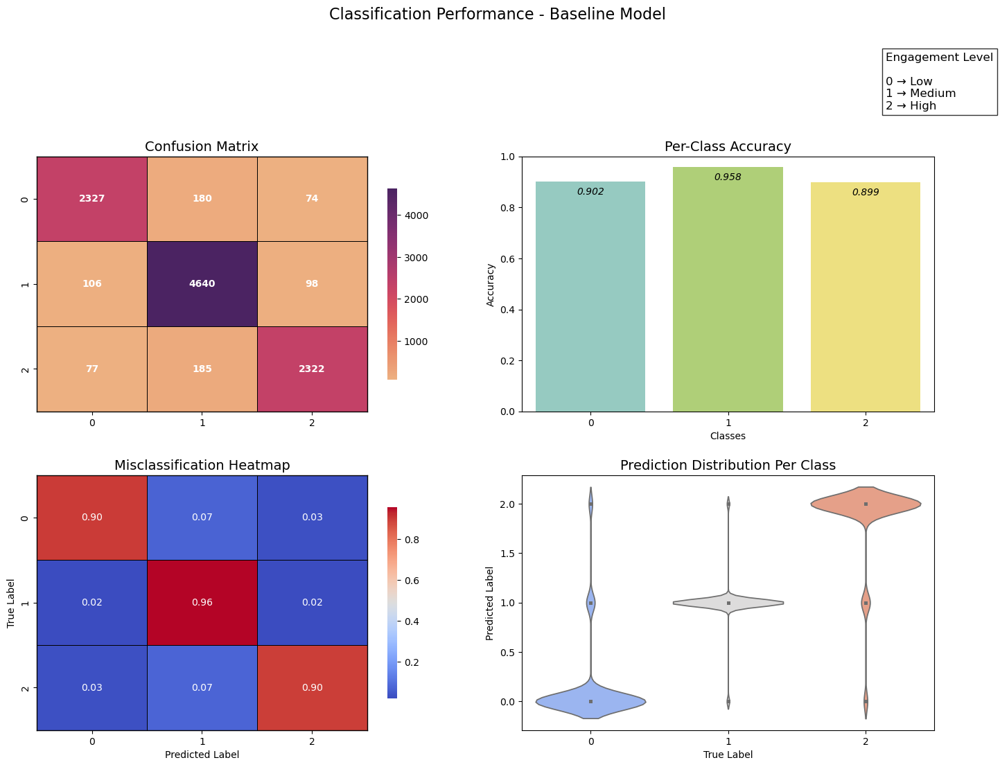

In [9]:
# Model Performance - Baseline
visualize_model_performance(y_test, y_pred_baseline, "Baseline Model")

In [10]:
# Find best hyperparameters for the XGBoost model using Optuna

# Define Objective function for running the study
def objective(trial):
    # Hyperparameter search space
    params = {
        "objective": "multi:softmax",
        "num_class": len(set(y_train)),
        "eval_metric": "mlogloss",
        "tree_method": "gpu_hist",
        "learning_rate": trial.suggest_float("learning_rate", 0.001, 1.0, log=True),
        "max_depth": trial.suggest_int("max_depth", 3, 32),
        "min_child_weight": trial.suggest_categorical("min_child_weight", [5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20]), 
        "subsample": trial.suggest_float("subsample", 0.001, 1.0, log=True),
        "colsample_bytree": trial.suggest_float("colsample_bytree", 0.001, 1.0, log=True),
        "gamma": trial.suggest_float("gamma", 1e-8, 1.0, log=True),
        "lambda": trial.suggest_float("lambda", 0.001, 10.0, log=True),
        "alpha": trial.suggest_float("alpha", 0.001, 10.0, log=True),
        "eta": trial.suggest_float("eta", 1e-8, 1.0, log=True),
        "n_estimators": trial.suggest_categorical("n_estimators", [32, 64, 128, 256, 512, 768, 1024, 1536, 2048, 3096, 4096, 5120]),
        "enable_categorical": trial.suggest_categorical("enable_categorical", [True]),
    }

    dtrain = xgb.DMatrix(X_train, label=y_train)
    dvalid = xgb.DMatrix(X_test, label=y_test)

    model = xgb.train(params, dtrain, num_boost_round=100, evals=[(dvalid, "eval")], early_stopping_rounds=10, verbose_eval=False)

    y_pred = model.predict(dvalid)

    # We maximize based on accuracy
    accuracy = accuracy_score(y_test, y_pred)

    return accuracy

In [11]:
study = optuna.create_study(direction="maximize", sampler=TPESampler())
study.optimize(objective, n_trials=500, show_progress_bar=True)

[I 2025-02-17 08:33:29,080] A new study created in memory with name: no-name-8f9240b7-fb6f-4aa3-b8f4-0433ef04102c
Best trial: 0. Best value: 0.483964:   0%|▏                                                         | 2/500 [00:00<01:30,  5.49it/s]

[I 2025-02-17 08:33:29,374] Trial 0 finished with value: 0.48396443201118994 and parameters: {'learning_rate': 0.0041109914821360755, 'max_depth': 31, 'min_child_weight': 5, 'subsample': 0.24030899067289066, 'colsample_bytree': 0.005779266579486889, 'gamma': 1.4510609712816046e-07, 'lambda': 0.13493739268417015, 'alpha': 0.009373976593196375, 'eta': 1.547897263186825e-08, 'n_estimators': 4096, 'enable_categorical': True}. Best is trial 0 with value: 0.48396443201118994.
[I 2025-02-17 08:33:29,481] Trial 1 finished with value: 0.48396443201118994 and parameters: {'learning_rate': 0.0012829575304722028, 'max_depth': 22, 'min_child_weight': 11, 'subsample': 0.002343153767177658, 'colsample_bytree': 0.0022184066717719163, 'gamma': 0.8872519175042057, 'lambda': 0.004848580963660725, 'alpha': 0.05442278983229128, 'eta': 9.60487046328016e-08, 'n_estimators': 512, 'enable_categorical': True}. Best is trial 0 with value: 0.48396443201118994.


Best trial: 2. Best value: 0.846838:   1%|▎                                                         | 3/500 [00:00<01:36,  5.17it/s]

[I 2025-02-17 08:33:29,688] Trial 2 finished with value: 0.8468378459386552 and parameters: {'learning_rate': 0.06876820845490289, 'max_depth': 30, 'min_child_weight': 10, 'subsample': 0.40726532213701944, 'colsample_bytree': 0.006864699146573341, 'gamma': 4.093522413661369e-05, 'lambda': 0.020176121803178484, 'alpha': 1.4422749583067564, 'eta': 0.01813576300686422, 'n_estimators': 2048, 'enable_categorical': True}. Best is trial 2 with value: 0.8468378459386552.


Best trial: 4. Best value: 0.87791:   1%|▌                                                          | 5/500 [00:00<01:22,  6.02it/s]

[I 2025-02-17 08:33:29,892] Trial 3 finished with value: 0.4982515735837746 and parameters: {'learning_rate': 0.02487668725059834, 'max_depth': 28, 'min_child_weight': 20, 'subsample': 0.17723742740039286, 'colsample_bytree': 0.009300601914534981, 'gamma': 4.1127087517274245e-05, 'lambda': 6.020603139006924, 'alpha': 0.0018203163407669348, 'eta': 8.365921973068718e-07, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 2 with value: 0.8468378459386552.
[I 2025-02-17 08:33:30,002] Trial 4 finished with value: 0.8779098811070037 and parameters: {'learning_rate': 0.9690909072375741, 'max_depth': 14, 'min_child_weight': 7, 'subsample': 0.009633958326992919, 'colsample_bytree': 0.06293466973728432, 'gamma': 0.08973129420594936, 'lambda': 0.05191084471133951, 'alpha': 5.288162152542172, 'eta': 0.017796493995053522, 'n_estimators': 4096, 'enable_categorical': True}. Best is trial 4 with value: 0.8779098811070037.


Best trial: 5. Best value: 0.885203:   1%|▋                                                         | 6/500 [00:01<01:14,  6.63it/s]

[I 2025-02-17 08:33:30,123] Trial 5 finished with value: 0.8852033170146868 and parameters: {'learning_rate': 0.7588302138268137, 'max_depth': 28, 'min_child_weight': 12, 'subsample': 0.010121479129003717, 'colsample_bytree': 0.0010280106438407273, 'gamma': 4.14032395892237e-06, 'lambda': 4.303234785040833, 'alpha': 0.560364003655768, 'eta': 0.0186968378969268, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 5 with value: 0.8852033170146868.


Best trial: 6. Best value: 0.908582:   1%|▊                                                         | 7/500 [00:01<01:31,  5.41it/s]

[I 2025-02-17 08:33:30,378] Trial 6 finished with value: 0.9085822759516435 and parameters: {'learning_rate': 0.30105505619167994, 'max_depth': 22, 'min_child_weight': 9, 'subsample': 0.27082842295147325, 'colsample_bytree': 0.14953659567156005, 'gamma': 0.4353301859139559, 'lambda': 0.006146916294754992, 'alpha': 0.37837551581856876, 'eta': 0.3509068283816579, 'n_estimators': 5120, 'enable_categorical': True}. Best is trial 6 with value: 0.9085822759516435.


Best trial: 6. Best value: 0.908582:   2%|█                                                         | 9/500 [00:01<01:29,  5.47it/s]

[I 2025-02-17 08:33:30,582] Trial 7 finished with value: 0.9014886602058148 and parameters: {'learning_rate': 0.7635811427973759, 'max_depth': 30, 'min_child_weight': 6, 'subsample': 0.28507613232652357, 'colsample_bytree': 0.2845494935919998, 'gamma': 7.922274878249205e-08, 'lambda': 0.14735715377846242, 'alpha': 0.05192405229186987, 'eta': 0.0311573074671373, 'n_estimators': 64, 'enable_categorical': True}. Best is trial 6 with value: 0.9085822759516435.
[I 2025-02-17 08:33:30,746] Trial 8 finished with value: 0.48716155460085925 and parameters: {'learning_rate': 0.017118082953225557, 'max_depth': 5, 'min_child_weight': 18, 'subsample': 0.340529467468493, 'colsample_bytree': 0.001049121116151556, 'gamma': 0.022265457234268444, 'lambda': 0.0031839899767157403, 'alpha': 0.6112415794497048, 'eta': 1.0003419806730175e-08, 'n_estimators': 512, 'enable_categorical': True}. Best is trial 6 with value: 0.9085822759516435.


Best trial: 10. Best value: 0.917774:   2%|█▏                                                      | 11/500 [00:01<01:19,  6.15it/s]

[I 2025-02-17 08:33:30,866] Trial 9 finished with value: 0.8109701268858027 and parameters: {'learning_rate': 0.0819622666408191, 'max_depth': 26, 'min_child_weight': 18, 'subsample': 0.005656842839950936, 'colsample_bytree': 0.0021121999125709254, 'gamma': 1.008253213980011e-07, 'lambda': 0.2017593791487294, 'alpha': 1.9315400455812728, 'eta': 0.11368656707563522, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 6 with value: 0.9085822759516435.
[I 2025-02-17 08:33:31,028] Trial 10 finished with value: 0.9177740033969427 and parameters: {'learning_rate': 0.19644379061067704, 'max_depth': 16, 'min_child_weight': 9, 'subsample': 0.03916705951177933, 'colsample_bytree': 0.9324165493763207, 'gamma': 0.002411503607214467, 'lambda': 0.00138905852823138, 'alpha': 0.14076451143507143, 'eta': 6.506473469895433e-05, 'n_estimators': 5120, 'enable_categorical': True}. Best is trial 10 with value: 0.9177740033969427.


Best trial: 11. Best value: 0.919073:   2%|█▎                                                      | 12/500 [00:02<01:18,  6.22it/s]

[I 2025-02-17 08:33:31,184] Trial 11 finished with value: 0.9190728344489959 and parameters: {'learning_rate': 0.2015436938701392, 'max_depth': 15, 'min_child_weight': 9, 'subsample': 0.05233202398564958, 'colsample_bytree': 0.997275513295325, 'gamma': 0.0021021600401444273, 'lambda': 0.0012733897031462394, 'alpha': 0.21370975842365658, 'eta': 9.025187791623419e-05, 'n_estimators': 5120, 'enable_categorical': True}. Best is trial 11 with value: 0.9190728344489959.


Best trial: 11. Best value: 0.919073:   3%|█▌                                                      | 14/500 [00:02<01:33,  5.19it/s]

[I 2025-02-17 08:33:31,453] Trial 12 finished with value: 0.9174742731541613 and parameters: {'learning_rate': 0.18156764195115582, 'max_depth': 14, 'min_child_weight': 9, 'subsample': 0.04294873724343587, 'colsample_bytree': 0.7572182565726144, 'gamma': 0.003904221918353611, 'lambda': 0.0013807179354976874, 'alpha': 0.12559566987557402, 'eta': 0.0001355403047607791, 'n_estimators': 5120, 'enable_categorical': True}. Best is trial 11 with value: 0.9190728344489959.
[I 2025-02-17 08:33:31,643] Trial 13 finished with value: 0.9147767009691278 and parameters: {'learning_rate': 0.22060450179871377, 'max_depth': 7, 'min_child_weight': 17, 'subsample': 0.05330634515720095, 'colsample_bytree': 0.5395829730381966, 'gamma': 0.0019326747792090446, 'lambda': 0.0016142970371064373, 'alpha': 0.00982294620988952, 'eta': 3.102726332583117e-05, 'n_estimators': 768, 'enable_categorical': True}. Best is trial 11 with value: 0.9190728344489959.


Best trial: 11. Best value: 0.919073:   3%|█▋                                                      | 15/500 [00:02<01:34,  5.12it/s]

[I 2025-02-17 08:33:31,845] Trial 14 finished with value: 0.8465381156958737 and parameters: {'learning_rate': 0.06787498897249829, 'max_depth': 11, 'min_child_weight': 15, 'subsample': 0.0603190389158996, 'colsample_bytree': 0.10155931049644015, 'gamma': 0.0007605991802465477, 'lambda': 0.015082897766744787, 'alpha': 0.1711704869813646, 'eta': 0.0001716655176186575, 'n_estimators': 5120, 'enable_categorical': True}. Best is trial 11 with value: 0.9190728344489959.


Best trial: 11. Best value: 0.919073:   3%|█▉                                                      | 17/500 [00:03<01:35,  5.04it/s]

[I 2025-02-17 08:33:32,121] Trial 15 finished with value: 0.8945948646218403 and parameters: {'learning_rate': 0.01198107316598878, 'max_depth': 19, 'min_child_weight': 13, 'subsample': 0.025331549160306523, 'colsample_bytree': 0.8563394987912375, 'gamma': 0.0002628898748243845, 'lambda': 0.989482859480209, 'alpha': 0.01859712943697436, 'eta': 1.4314543860552338e-05, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 11 with value: 0.9190728344489959.
[I 2025-02-17 08:33:32,271] Trial 16 finished with value: 0.8866020581476671 and parameters: {'learning_rate': 0.31029294405579344, 'max_depth': 11, 'min_child_weight': 9, 'subsample': 0.1051373601110546, 'colsample_bytree': 0.024202855165109487, 'gamma': 0.009696399509182677, 'lambda': 0.0011783831677403408, 'alpha': 7.826570440268696, 'eta': 0.0010328296625267254, 'n_estimators': 3096, 'enable_categorical': True}. Best is trial 11 with value: 0.9190728344489959.


Best trial: 17. Best value: 0.919872:   4%|██                                                      | 18/500 [00:04<04:04,  1.97it/s]

[I 2025-02-17 08:33:33,499] Trial 17 finished with value: 0.9198721150964132 and parameters: {'learning_rate': 0.10825247527112711, 'max_depth': 17, 'min_child_weight': 14, 'subsample': 0.8650530014467047, 'colsample_bytree': 0.33243627203593673, 'gamma': 3.4615766871740672e-06, 'lambda': 0.01183105222173321, 'alpha': 0.0010729747283118604, 'eta': 4.329565566591991e-06, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 17 with value: 0.9198721150964132.


Best trial: 17. Best value: 0.919872:   4%|██▏                                                     | 19/500 [00:05<05:32,  1.45it/s]

[I 2025-02-17 08:33:34,619] Trial 18 finished with value: 0.9043860525527025 and parameters: {'learning_rate': 0.04116621783074607, 'max_depth': 20, 'min_child_weight': 14, 'subsample': 0.5645396201274636, 'colsample_bytree': 0.2609396312160134, 'gamma': 2.2008460310148302e-06, 'lambda': 0.013960231309223536, 'alpha': 0.00118467862775187, 'eta': 2.3425065544163183e-06, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 17 with value: 0.9198721150964132.


Best trial: 19. Best value: 0.92207:   4%|██▎                                                      | 20/500 [00:06<05:29,  1.45it/s]

[I 2025-02-17 08:33:35,296] Trial 19 finished with value: 0.9220701368768108 and parameters: {'learning_rate': 0.1425683915798355, 'max_depth': 9, 'min_child_weight': 14, 'subsample': 0.9240837365115522, 'colsample_bytree': 0.32591980348084504, 'gamma': 1.22547510009503e-06, 'lambda': 0.031893159732098005, 'alpha': 0.00290671462573366, 'eta': 0.0013588234379031765, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 19 with value: 0.9220701368768108.


Best trial: 19. Best value: 0.92207:   4%|██▍                                                      | 21/500 [00:06<04:21,  1.83it/s]

[I 2025-02-17 08:33:35,513] Trial 20 finished with value: 0.48396443201118994 and parameters: {'learning_rate': 0.007910765497443663, 'max_depth': 7, 'min_child_weight': 14, 'subsample': 0.8219343513613502, 'colsample_bytree': 0.03810772334729395, 'gamma': 1.3267419532998798e-08, 'lambda': 0.05250615687187226, 'alpha': 0.002934256807497288, 'eta': 0.0012388215278089088, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 19 with value: 0.9220701368768108.


Best trial: 19. Best value: 0.92207:   4%|██▌                                                      | 22/500 [00:07<05:32,  1.44it/s]

[I 2025-02-17 08:33:36,558] Trial 21 finished with value: 0.9181736437206515 and parameters: {'learning_rate': 0.10957381436768886, 'max_depth': 11, 'min_child_weight': 8, 'subsample': 0.9827809543214991, 'colsample_bytree': 0.3519448366468491, 'gamma': 3.1096853756429095e-06, 'lambda': 0.4199299105146765, 'alpha': 0.004055747681050418, 'eta': 0.0014688097652949368, 'n_estimators': 1024, 'enable_categorical': True}. Best is trial 19 with value: 0.9220701368768108.
[I 2025-02-17 08:33:36,619] Trial 22 finished with value: 0.48396443201118994 and parameters: {'learning_rate': 0.42374734690150195, 'max_depth': 16, 'min_child_weight': 19, 'subsample': 0.0012410390941578137, 'colsample_bytree': 0.14111199150289538, 'gamma': 1.056534240284443e-06, 'lambda': 0.03611743163350333, 'alpha': 0.0010786520711629768, 'eta': 3.186998637591743e-06, 'n_estimators': 256, 'enable_categorical': True}. Best is trial 19 with value: 0.9220701368768108.


Best trial: 19. Best value: 0.92207:   5%|██▋                                                      | 24/500 [00:08<03:56,  2.01it/s]

[I 2025-02-17 08:33:37,089] Trial 23 finished with value: 0.9162753521830352 and parameters: {'learning_rate': 0.04201447372591508, 'max_depth': 8, 'min_child_weight': 16, 'subsample': 0.14124944535169476, 'colsample_bytree': 0.5096863888192626, 'gamma': 1.6359792116604433e-05, 'lambda': 0.006960196473289341, 'alpha': 0.005677877140144951, 'eta': 3.545429353598274e-07, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 19 with value: 0.9220701368768108.


Best trial: 19. Best value: 0.92207:   5%|██▊                                                      | 25/500 [00:08<04:21,  1.81it/s]

[I 2025-02-17 08:33:37,804] Trial 24 finished with value: 0.9066839844140274 and parameters: {'learning_rate': 0.1176985487120032, 'max_depth': 13, 'min_child_weight': 14, 'subsample': 0.5960922007454049, 'colsample_bytree': 0.18416886979166625, 'gamma': 4.908754654390223e-07, 'lambda': 0.0037188622506305734, 'alpha': 0.02654013849278018, 'eta': 9.790967025781509e-06, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 19 with value: 0.9220701368768108.
[I 2025-02-17 08:33:37,899] Trial 25 finished with value: 0.9060845239284644 and parameters: {'learning_rate': 0.4441681581879001, 'max_depth': 4, 'min_child_weight': 14, 'subsample': 0.020076786615896645, 'colsample_bytree': 0.4236811233027261, 'gamma': 0.00025930200644882286, 'lambda': 0.010482717216074687, 'alpha': 0.002386855484803712, 'eta': 0.0006677077412797303, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 19 with value: 0.9220701368768108.


Best trial: 19. Best value: 0.92207:   5%|███                                                      | 27/500 [00:09<03:04,  2.57it/s]

[I 2025-02-17 08:33:38,128] Trial 26 finished with value: 0.8748126685982616 and parameters: {'learning_rate': 0.13683644602371092, 'max_depth': 18, 'min_child_weight': 14, 'subsample': 0.08370053400064845, 'colsample_bytree': 0.08469143365622069, 'gamma': 1.3099348304737755e-05, 'lambda': 0.032408256121781845, 'alpha': 0.015853848262089812, 'eta': 0.00029254032885206606, 'n_estimators': 3096, 'enable_categorical': True}. Best is trial 19 with value: 0.9220701368768108.


Best trial: 19. Best value: 0.92207:   6%|███▎                                                     | 29/500 [00:09<03:06,  2.53it/s]

[I 2025-02-17 08:33:38,921] Trial 27 finished with value: 0.8983914476970727 and parameters: {'learning_rate': 0.049442775209649605, 'max_depth': 22, 'min_child_weight': 16, 'subsample': 0.5142688443746063, 'colsample_bytree': 0.22081139439368477, 'gamma': 4.2395360380831235e-07, 'lambda': 0.002475364052964094, 'alpha': 0.050090155167558374, 'eta': 0.004629895165649091, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 19 with value: 0.9220701368768108.
[I 2025-02-17 08:33:39,050] Trial 28 finished with value: 0.8852033170146868 and parameters: {'learning_rate': 0.5242855179363555, 'max_depth': 10, 'min_child_weight': 20, 'subsample': 0.01540117119502814, 'colsample_bytree': 0.04604060943526235, 'gamma': 0.000142255860976514, 'lambda': 0.09369932668043575, 'alpha': 0.3105657146527846, 'eta': 3.032992732380348e-05, 'n_estimators': 1024, 'enable_categorical': True}. Best is trial 19 with value: 0.9220701368768108.


Best trial: 19. Best value: 0.92207:   6%|███▍                                                     | 30/500 [00:11<04:25,  1.77it/s]

[I 2025-02-17 08:33:40,096] Trial 29 finished with value: 0.9211709461484664 and parameters: {'learning_rate': 0.022926393430095456, 'max_depth': 16, 'min_child_weight': 5, 'subsample': 0.20398171952497476, 'colsample_bytree': 0.5629529105725642, 'gamma': 1.430691857416219e-08, 'lambda': 0.3853848901725122, 'alpha': 0.006044566787986994, 'eta': 4.43448675975809e-08, 'n_estimators': 64, 'enable_categorical': True}. Best is trial 19 with value: 0.9220701368768108.


Best trial: 19. Best value: 0.92207:   6%|███▌                                                     | 31/500 [00:11<03:45,  2.08it/s]

[I 2025-02-17 08:33:40,352] Trial 30 finished with value: 0.48396443201118994 and parameters: {'learning_rate': 0.0029257891291299006, 'max_depth': 24, 'min_child_weight': 5, 'subsample': 0.1988516833348327, 'colsample_bytree': 0.026651720389158844, 'gamma': 2.972674056469874e-08, 'lambda': 0.8053155831336626, 'alpha': 0.007075313948344633, 'eta': 9.377277606274567e-08, 'n_estimators': 64, 'enable_categorical': True}. Best is trial 19 with value: 0.9220701368768108.


Best trial: 31. Best value: 0.923469:   6%|███▌                                                    | 32/500 [00:13<07:34,  1.03it/s]

[I 2025-02-17 08:33:42,590] Trial 31 finished with value: 0.9234688780097912 and parameters: {'learning_rate': 0.028332238855140367, 'max_depth': 16, 'min_child_weight': 5, 'subsample': 0.9016951559262738, 'colsample_bytree': 0.5842450037720357, 'gamma': 2.48962879775486e-07, 'lambda': 0.32200184298820034, 'alpha': 0.0038262235300513467, 'eta': 4.684824325052717e-08, 'n_estimators': 64, 'enable_categorical': True}. Best is trial 31 with value: 0.9234688780097912.


Best trial: 31. Best value: 0.923469:   7%|███▋                                                    | 33/500 [00:15<10:10,  1.31s/it]

[I 2025-02-17 08:33:44,743] Trial 32 finished with value: 0.9232690578479369 and parameters: {'learning_rate': 0.024125330439259473, 'max_depth': 17, 'min_child_weight': 5, 'subsample': 0.7612107971367483, 'colsample_bytree': 0.5341095360732738, 'gamma': 1.92234734402244e-07, 'lambda': 0.3128453210329675, 'alpha': 0.0018032530928968624, 'eta': 7.275552974406212e-08, 'n_estimators': 64, 'enable_categorical': True}. Best is trial 31 with value: 0.9234688780097912.


Best trial: 31. Best value: 0.923469:   7%|███▊                                                    | 34/500 [00:17<10:47,  1.39s/it]

[I 2025-02-17 08:33:46,331] Trial 33 finished with value: 0.9133779598361474 and parameters: {'learning_rate': 0.006721047555850489, 'max_depth': 20, 'min_child_weight': 5, 'subsample': 0.46935439935926454, 'colsample_bytree': 0.5210372311165081, 'gamma': 1.055208112919875e-08, 'lambda': 0.37201306421872327, 'alpha': 0.004041205275710956, 'eta': 4.8683463224361245e-08, 'n_estimators': 64, 'enable_categorical': True}. Best is trial 31 with value: 0.9234688780097912.


Best trial: 31. Best value: 0.923469:   7%|███▉                                                    | 35/500 [00:17<08:10,  1.06s/it]

[I 2025-02-17 08:33:46,580] Trial 34 finished with value: 0.5070436607053652 and parameters: {'learning_rate': 0.02507575468572968, 'max_depth': 13, 'min_child_weight': 5, 'subsample': 0.6798795897990174, 'colsample_bytree': 0.01602702476294854, 'gamma': 2.760196021311337e-07, 'lambda': 1.9710680898401658, 'alpha': 0.00204748392724181, 'eta': 2.9556921889388554e-08, 'n_estimators': 64, 'enable_categorical': True}. Best is trial 31 with value: 0.9234688780097912.


Best trial: 31. Best value: 0.923469:   7%|████                                                    | 36/500 [00:18<07:27,  1.04it/s]

[I 2025-02-17 08:33:47,330] Trial 35 finished with value: 0.9228694175242282 and parameters: {'learning_rate': 0.01408435993632126, 'max_depth': 9, 'min_child_weight': 5, 'subsample': 0.4038324429067811, 'colsample_bytree': 0.6157356008222372, 'gamma': 5.536777073377372e-08, 'lambda': 0.3105933937464326, 'alpha': 0.011233915226647415, 'eta': 4.010695060160793e-07, 'n_estimators': 64, 'enable_categorical': True}. Best is trial 31 with value: 0.9234688780097912.


Best trial: 31. Best value: 0.923469:   7%|████▏                                                   | 37/500 [00:18<06:46,  1.14it/s]

[I 2025-02-17 08:33:48,001] Trial 36 finished with value: 0.9229693276051554 and parameters: {'learning_rate': 0.013269386885651826, 'max_depth': 9, 'min_child_weight': 11, 'subsample': 0.3958436447769653, 'colsample_bytree': 0.6807558363135385, 'gamma': 4.906491266863549e-08, 'lambda': 0.10213228690115282, 'alpha': 0.009941260817685149, 'eta': 3.071464315209908e-07, 'n_estimators': 64, 'enable_categorical': True}. Best is trial 31 with value: 0.9234688780097912.


Best trial: 31. Best value: 0.923469:   8%|████▎                                                   | 38/500 [00:19<05:18,  1.45it/s]

[I 2025-02-17 08:33:48,247] Trial 37 finished with value: 0.911279848136677 and parameters: {'learning_rate': 0.0043720310024739206, 'max_depth': 4, 'min_child_weight': 11, 'subsample': 0.39732788461871876, 'colsample_bytree': 0.6975334402168235, 'gamma': 5.171664486355986e-08, 'lambda': 0.2257484939496212, 'alpha': 0.014079856470073114, 'eta': 3.5659931463145677e-07, 'n_estimators': 64, 'enable_categorical': True}. Best is trial 31 with value: 0.9234688780097912.


Best trial: 31. Best value: 0.923469:   8%|████▍                                                   | 40/500 [00:19<03:53,  1.97it/s]

[I 2025-02-17 08:33:48,779] Trial 38 finished with value: 0.8822060145868719 and parameters: {'learning_rate': 0.014303369973496977, 'max_depth': 12, 'min_child_weight': 11, 'subsample': 0.12993135938806877, 'colsample_bytree': 0.20672765341122318, 'gamma': 1.8662136222127365e-07, 'lambda': 0.09728144113707626, 'alpha': 0.039498908736975535, 'eta': 4.4503980480634873e-07, 'n_estimators': 2048, 'enable_categorical': True}. Best is trial 31 with value: 0.9234688780097912.
[I 2025-02-17 08:33:48,968] Trial 39 finished with value: 0.48396443201118994 and parameters: {'learning_rate': 0.009898048381646223, 'max_depth': 6, 'min_child_weight': 10, 'subsample': 0.3099240891377131, 'colsample_bytree': 0.11712716893088664, 'gamma': 3.7916537983484366e-08, 'lambda': 0.8151937424980994, 'alpha': 0.0842963121371984, 'eta': 1.2599349804988602e-07, 'n_estimators': 64, 'enable_categorical': True}. Best is trial 31 with value: 0.9234688780097912.


Best trial: 31. Best value: 0.923469:   8%|████▌                                                   | 41/500 [00:20<03:04,  2.48it/s]

[I 2025-02-17 08:33:49,126] Trial 40 finished with value: 0.48396443201118994 and parameters: {'learning_rate': 0.003150961285786854, 'max_depth': 3, 'min_child_weight': 5, 'subsample': 0.367610760458788, 'colsample_bytree': 0.07512028684107615, 'gamma': 1.4241647249142084e-07, 'lambda': 2.1036750998265066, 'alpha': 0.010356516763836704, 'eta': 1.7062557828492048e-08, 'n_estimators': 4096, 'enable_categorical': True}. Best is trial 31 with value: 0.9234688780097912.


Best trial: 31. Best value: 0.923469:   8%|████▋                                                   | 42/500 [00:20<04:04,  1.87it/s]

[I 2025-02-17 08:33:49,969] Trial 41 finished with value: 0.9140773304026376 and parameters: {'learning_rate': 0.030479705641740348, 'max_depth': 9, 'min_child_weight': 7, 'subsample': 0.9600251458217329, 'colsample_bytree': 0.3821167054562483, 'gamma': 6.474008046135501e-07, 'lambda': 0.13387436148225682, 'alpha': 0.0031398600402375494, 'eta': 1.5203876776343736e-07, 'n_estimators': 64, 'enable_categorical': True}. Best is trial 31 with value: 0.9234688780097912.


Best trial: 42. Best value: 0.923769:   9%|████▊                                                   | 43/500 [00:21<04:38,  1.64it/s]

[I 2025-02-17 08:33:50,753] Trial 42 finished with value: 0.9237686082525727 and parameters: {'learning_rate': 0.016110744643533997, 'max_depth': 9, 'min_child_weight': 12, 'subsample': 0.6580680470070361, 'colsample_bytree': 0.7026337598948865, 'gamma': 9.993248858616033e-07, 'lambda': 0.2683083101610213, 'alpha': 0.0016517446646751941, 'eta': 1.049406571627141e-06, 'n_estimators': 512, 'enable_categorical': True}. Best is trial 42 with value: 0.9237686082525727.


Best trial: 42. Best value: 0.923769:   9%|████▉                                                   | 44/500 [00:22<04:43,  1.61it/s]

[I 2025-02-17 08:33:51,404] Trial 43 finished with value: 0.9219702267958837 and parameters: {'learning_rate': 0.018237591819199823, 'max_depth': 9, 'min_child_weight': 12, 'subsample': 0.2656077214298023, 'colsample_bytree': 0.6652290131979369, 'gamma': 9.247761639758652e-08, 'lambda': 0.27594954304997893, 'alpha': 0.0016423246219644631, 'eta': 9.05532692992963e-07, 'n_estimators': 512, 'enable_categorical': True}. Best is trial 42 with value: 0.9237686082525727.


Best trial: 42. Best value: 0.923769:   9%|█████                                                   | 45/500 [00:22<03:59,  1.90it/s]

[I 2025-02-17 08:33:51,704] Trial 44 finished with value: 0.48396443201118994 and parameters: {'learning_rate': 0.007284339291600902, 'max_depth': 14, 'min_child_weight': 12, 'subsample': 0.47006948490824885, 'colsample_bytree': 0.007014164813123148, 'gamma': 7.843078676845005e-06, 'lambda': 0.05859107576279802, 'alpha': 0.025770455123462696, 'eta': 8.292638572679428e-07, 'n_estimators': 512, 'enable_categorical': True}. Best is trial 42 with value: 0.9237686082525727.


Best trial: 45. Best value: 0.924568:   9%|█████▏                                                  | 46/500 [00:23<03:43,  2.03it/s]

[I 2025-02-17 08:33:52,117] Trial 45 finished with value: 0.92456788889999 and parameters: {'learning_rate': 0.005209869538771176, 'max_depth': 6, 'min_child_weight': 6, 'subsample': 0.6621317388276371, 'colsample_bytree': 0.966409152299629, 'gamma': 3.991880253608055e-08, 'lambda': 0.5692370890566726, 'alpha': 0.004317477291276085, 'eta': 1.480847317041048e-07, 'n_estimators': 64, 'enable_categorical': True}. Best is trial 45 with value: 0.92456788889999.


Best trial: 45. Best value: 0.924568:   9%|█████▎                                                  | 47/500 [00:23<03:33,  2.12it/s]

[I 2025-02-17 08:33:52,540] Trial 46 finished with value: 0.9230692376860825 and parameters: {'learning_rate': 0.0012267115402295507, 'max_depth': 6, 'min_child_weight': 6, 'subsample': 0.6542321815510722, 'colsample_bytree': 0.9750530686673957, 'gamma': 2.578114218078518e-08, 'lambda': 0.5633914534334196, 'alpha': 0.001492403818270138, 'eta': 1.0060715005634285e-08, 'n_estimators': 768, 'enable_categorical': True}. Best is trial 45 with value: 0.92456788889999.


Best trial: 45. Best value: 0.924568:  10%|█████▍                                                  | 48/500 [00:23<02:57,  2.55it/s]

[I 2025-02-17 08:33:52,747] Trial 47 finished with value: 0.8869017883904486 and parameters: {'learning_rate': 0.0011280160762477383, 'max_depth': 6, 'min_child_weight': 6, 'subsample': 0.0047080933810464635, 'colsample_bytree': 0.9794433461859392, 'gamma': 2.328586062909369e-07, 'lambda': 0.573455246014656, 'alpha': 0.0017211405337784992, 'eta': 1.0553983700151334e-08, 'n_estimators': 768, 'enable_categorical': True}. Best is trial 45 with value: 0.92456788889999.


Best trial: 45. Best value: 0.924568:  10%|█████▍                                                  | 49/500 [00:23<02:33,  2.94it/s]

[I 2025-02-17 08:33:52,966] Trial 48 finished with value: 0.8924967529223699 and parameters: {'learning_rate': 0.0016955470584472053, 'max_depth': 3, 'min_child_weight': 6, 'subsample': 0.6486392533122392, 'colsample_bytree': 0.443863297933509, 'gamma': 1.9952936251405377e-08, 'lambda': 1.6294685501695017, 'alpha': 0.0016592360162275533, 'eta': 2.1628667780119258e-08, 'n_estimators': 768, 'enable_categorical': True}. Best is trial 45 with value: 0.92456788889999.


Best trial: 45. Best value: 0.924568:  10%|█████▌                                                  | 50/500 [00:24<02:31,  2.98it/s]

[I 2025-02-17 08:33:53,292] Trial 49 finished with value: 0.9180737336397242 and parameters: {'learning_rate': 0.0018411542609256715, 'max_depth': 5, 'min_child_weight': 6, 'subsample': 0.6871338963939561, 'colsample_bytree': 0.9654112375460162, 'gamma': 3.794471573573332e-05, 'lambda': 3.8131332322228713, 'alpha': 0.004219347268472082, 'eta': 1.1008583655551376e-07, 'n_estimators': 512, 'enable_categorical': True}. Best is trial 45 with value: 0.92456788889999.


Best trial: 45. Best value: 0.924568:  10%|█████▋                                                  | 51/500 [00:24<02:34,  2.90it/s]

[I 2025-02-17 08:33:53,655] Trial 50 finished with value: 0.8828054750724348 and parameters: {'learning_rate': 0.0039133033408499775, 'max_depth': 6, 'min_child_weight': 6, 'subsample': 0.247183951238303, 'colsample_bytree': 0.2613108254760998, 'gamma': 1.2313989146316265e-07, 'lambda': 1.230074287329981, 'alpha': 0.006328691964743474, 'eta': 5.6695631046773085e-08, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 45 with value: 0.92456788889999.


Best trial: 45. Best value: 0.924568:  10%|█████▊                                                  | 52/500 [00:25<02:52,  2.60it/s]

[I 2025-02-17 08:33:54,137] Trial 51 finished with value: 0.9232690578479369 and parameters: {'learning_rate': 0.005774498081949885, 'max_depth': 7, 'min_child_weight': 11, 'subsample': 0.6195189893784466, 'colsample_bytree': 0.7225670971574764, 'gamma': 4.131947124395296e-08, 'lambda': 0.1412762221595654, 'alpha': 0.0014021214421411565, 'eta': 1.5480201429383084e-06, 'n_estimators': 768, 'enable_categorical': True}. Best is trial 45 with value: 0.92456788889999.


Best trial: 45. Best value: 0.924568:  11%|█████▉                                                  | 53/500 [00:26<04:27,  1.67it/s]

[I 2025-02-17 08:33:55,233] Trial 52 finished with value: 0.9231691477670096 and parameters: {'learning_rate': 0.005038543423511759, 'max_depth': 32, 'min_child_weight': 17, 'subsample': 0.758351735255968, 'colsample_bytree': 0.7300275174252292, 'gamma': 2.9711113421837396e-08, 'lambda': 0.544240172961404, 'alpha': 0.001366979876149352, 'eta': 1.1048323651549943e-06, 'n_estimators': 768, 'enable_categorical': True}. Best is trial 45 with value: 0.92456788889999.


Best trial: 45. Best value: 0.924568:  11%|██████                                                  | 54/500 [00:26<03:45,  1.98it/s]

[I 2025-02-17 08:33:55,524] Trial 53 finished with value: 0.48396443201118994 and parameters: {'learning_rate': 0.005383836266173192, 'max_depth': 29, 'min_child_weight': 13, 'subsample': 0.8179610284594394, 'colsample_bytree': 0.0037719868670166574, 'gamma': 1.1477134657681137e-06, 'lambda': 0.18168050917989648, 'alpha': 0.0010048744441796004, 'eta': 1.3625486348215842e-06, 'n_estimators': 768, 'enable_categorical': True}. Best is trial 45 with value: 0.92456788889999.


Best trial: 45. Best value: 0.924568:  11%|██████▏                                                 | 55/500 [00:27<04:57,  1.49it/s]

[I 2025-02-17 08:33:56,574] Trial 54 finished with value: 0.9238685183334998 and parameters: {'learning_rate': 0.019106680556205614, 'max_depth': 32, 'min_child_weight': 17, 'subsample': 0.49186333074840527, 'colsample_bytree': 0.7386329692584159, 'gamma': 8.577383958035915e-08, 'lambda': 0.5699789101619879, 'alpha': 0.0021256352981421436, 'eta': 1.769428991341928e-06, 'n_estimators': 256, 'enable_categorical': True}. Best is trial 45 with value: 0.92456788889999.


Best trial: 45. Best value: 0.924568:  11%|██████▎                                                 | 56/500 [00:28<05:44,  1.29it/s]

[I 2025-02-17 08:33:57,598] Trial 55 finished with value: 0.911279848136677 and parameters: {'learning_rate': 0.009307376978102903, 'max_depth': 25, 'min_child_weight': 15, 'subsample': 0.30498468110088184, 'colsample_bytree': 0.4248175805042364, 'gamma': 3.224875511999881e-07, 'lambda': 0.16080929536399394, 'alpha': 0.002498379198713592, 'eta': 4.078657464941972e-06, 'n_estimators': 256, 'enable_categorical': True}. Best is trial 45 with value: 0.92456788889999.


Best trial: 45. Best value: 0.924568:  11%|██████▍                                                 | 57/500 [00:29<06:01,  1.23it/s]

[I 2025-02-17 08:33:58,504] Trial 56 finished with value: 0.8977919872115097 and parameters: {'learning_rate': 0.019829643539917646, 'max_depth': 20, 'min_child_weight': 18, 'subsample': 0.5105753097114584, 'colsample_bytree': 0.28791164114961004, 'gamma': 1.0420611938206898e-07, 'lambda': 0.22826004337689187, 'alpha': 0.004245208123393725, 'eta': 7.362957546819782e-06, 'n_estimators': 256, 'enable_categorical': True}. Best is trial 45 with value: 0.92456788889999.


Best trial: 45. Best value: 0.924568:  12%|██████▍                                                 | 58/500 [00:30<05:42,  1.29it/s]

[I 2025-02-17 08:33:59,184] Trial 57 finished with value: 0.9228694175242282 and parameters: {'learning_rate': 0.03428048055271642, 'max_depth': 27, 'min_child_weight': 17, 'subsample': 0.15911489387840136, 'colsample_bytree': 0.7793649657601904, 'gamma': 1.5769163865896017e-06, 'lambda': 0.06865175292615362, 'alpha': 0.0022929750768508447, 'eta': 1.901649502818526e-07, 'n_estimators': 2048, 'enable_categorical': True}. Best is trial 45 with value: 0.92456788889999.


Best trial: 45. Best value: 0.924568:  12%|██████▌                                                 | 59/500 [00:30<05:09,  1.43it/s]

[I 2025-02-17 08:33:59,714] Trial 58 finished with value: 0.922769507443301 and parameters: {'learning_rate': 0.07330313204356691, 'max_depth': 18, 'min_child_weight': 12, 'subsample': 0.4993666330247879, 'colsample_bytree': 0.5109438822658721, 'gamma': 6.957704532046648e-07, 'lambda': 2.9111621888231074, 'alpha': 3.6175911154313676, 'eta': 2.1253088487695177e-06, 'n_estimators': 256, 'enable_categorical': True}. Best is trial 45 with value: 0.92456788889999.


Best trial: 45. Best value: 0.924568:  12%|██████▋                                                 | 60/500 [00:31<05:11,  1.41it/s]

[I 2025-02-17 08:34:00,440] Trial 59 finished with value: 0.9156758916974723 and parameters: {'learning_rate': 0.049135271404344524, 'max_depth': 23, 'min_child_weight': 8, 'subsample': 0.22581248584300065, 'colsample_bytree': 0.3607479295692758, 'gamma': 0.17006213075497706, 'lambda': 1.2283699894207702, 'alpha': 0.003620986953257334, 'eta': 2.276453699624416e-05, 'n_estimators': 4096, 'enable_categorical': True}. Best is trial 45 with value: 0.92456788889999.


Best trial: 45. Best value: 0.924568:  12%|██████▊                                                 | 61/500 [00:31<04:41,  1.56it/s]

[I 2025-02-17 08:34:00,924] Trial 60 finished with value: 0.8474373064242182 and parameters: {'learning_rate': 0.011042178320384241, 'max_depth': 15, 'min_child_weight': 19, 'subsample': 0.9711806388638157, 'colsample_bytree': 0.14572833870157106, 'gamma': 2.311960465878523e-07, 'lambda': 0.6383483165517403, 'alpha': 0.007553283659393942, 'eta': 6.372698744537734e-08, 'n_estimators': 512, 'enable_categorical': True}. Best is trial 45 with value: 0.92456788889999.


Best trial: 45. Best value: 0.924568:  12%|██████▉                                                 | 62/500 [00:32<05:39,  1.29it/s]

[I 2025-02-17 08:34:02,013] Trial 61 finished with value: 0.9226695973623739 and parameters: {'learning_rate': 0.0022682328199786273, 'max_depth': 29, 'min_child_weight': 17, 'subsample': 0.7351528842762572, 'colsample_bytree': 0.7713434640679715, 'gamma': 2.1983370423798874e-08, 'lambda': 0.43194780333117094, 'alpha': 0.0013501341545979794, 'eta': 7.224558120451703e-07, 'n_estimators': 768, 'enable_categorical': True}. Best is trial 45 with value: 0.92456788889999.


Best trial: 45. Best value: 0.924568:  13%|███████                                                 | 63/500 [00:34<06:43,  1.08it/s]

[I 2025-02-17 08:34:03,277] Trial 62 finished with value: 0.9203716655010491 and parameters: {'learning_rate': 0.00578968122661371, 'max_depth': 32, 'min_child_weight': 17, 'subsample': 0.5741035125497135, 'colsample_bytree': 0.6417500193530823, 'gamma': 7.059991170397408e-08, 'lambda': 0.26435758119876335, 'alpha': 0.0021269881232982807, 'eta': 1.5565666985217176e-06, 'n_estimators': 768, 'enable_categorical': True}. Best is trial 45 with value: 0.92456788889999.


Best trial: 45. Best value: 0.924568:  13%|███████▏                                                | 64/500 [00:34<06:00,  1.21it/s]

[I 2025-02-17 08:34:03,879] Trial 63 finished with value: 0.9172744529923069 and parameters: {'learning_rate': 0.028740351344340127, 'max_depth': 31, 'min_child_weight': 17, 'subsample': 0.7227754166513995, 'colsample_bytree': 0.483902517128046, 'gamma': 4.0323153175866025e-08, 'lambda': 7.832575707329993, 'alpha': 0.001304711213943963, 'eta': 6.30506722778275e-06, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 45 with value: 0.92456788889999.


Best trial: 45. Best value: 0.924568:  13%|███████▎                                                | 65/500 [00:35<06:06,  1.19it/s]

[I 2025-02-17 08:34:04,757] Trial 64 finished with value: 0.9231691477670096 and parameters: {'learning_rate': 0.017931071827039152, 'max_depth': 32, 'min_child_weight': 20, 'subsample': 0.3501049838884858, 'colsample_bytree': 0.7720384552593493, 'gamma': 1.3420528166845362e-07, 'lambda': 0.5008489575969663, 'alpha': 0.0028313579142658736, 'eta': 2.1574301173210412e-07, 'n_estimators': 3096, 'enable_categorical': True}. Best is trial 45 with value: 0.92456788889999.


Best trial: 45. Best value: 0.924568:  13%|███████▍                                                | 66/500 [00:37<07:47,  1.08s/it]

[I 2025-02-17 08:34:06,382] Trial 65 finished with value: 0.9171745429113798 and parameters: {'learning_rate': 0.0043716102091135535, 'max_depth': 31, 'min_child_weight': 17, 'subsample': 0.7801150063276203, 'colsample_bytree': 0.5720491623242218, 'gamma': 5.896738998557136e-06, 'lambda': 0.13938963022103373, 'alpha': 0.001050794558537917, 'eta': 7.358273294261636e-07, 'n_estimators': 256, 'enable_categorical': True}. Best is trial 45 with value: 0.92456788889999.


Best trial: 45. Best value: 0.924568:  13%|███████▌                                                | 67/500 [00:37<06:20,  1.14it/s]

[I 2025-02-17 08:34:06,796] Trial 66 finished with value: 0.8900989109801178 and parameters: {'learning_rate': 0.009017392305605445, 'max_depth': 7, 'min_child_weight': 7, 'subsample': 0.44629971415472597, 'colsample_bytree': 0.2937266696338441, 'gamma': 1.08450359404044e-08, 'lambda': 0.7105334552982544, 'alpha': 0.0019312130617115976, 'eta': 3.226063755533205e-08, 'n_estimators': 1024, 'enable_categorical': True}. Best is trial 45 with value: 0.92456788889999.


Best trial: 45. Best value: 0.924568:  14%|███████▌                                                | 68/500 [00:39<07:24,  1.03s/it]

[I 2025-02-17 08:34:08,180] Trial 67 finished with value: 0.9130782295933659 and parameters: {'learning_rate': 0.022535434005768348, 'max_depth': 21, 'min_child_weight': 10, 'subsample': 0.5592287821768445, 'colsample_bytree': 0.391286983891186, 'gamma': 4.1395796819365166e-07, 'lambda': 0.32980448588601563, 'alpha': 0.00529551501190423, 'eta': 9.053542634029364e-08, 'n_estimators': 5120, 'enable_categorical': True}. Best is trial 45 with value: 0.92456788889999.


Best trial: 68. Best value: 0.927365:  14%|███████▋                                                | 69/500 [00:40<08:16,  1.15s/it]

[I 2025-02-17 08:34:09,615] Trial 68 finished with value: 0.9273653711659506 and parameters: {'learning_rate': 0.03869574034330528, 'max_depth': 27, 'min_child_weight': 11, 'subsample': 0.9365178024055489, 'colsample_bytree': 0.8155830635608907, 'gamma': 7.79233712610882e-08, 'lambda': 0.9972339928666183, 'alpha': 0.005032792500245722, 'eta': 1.5358113210220693e-06, 'n_estimators': 64, 'enable_categorical': True}. Best is trial 68 with value: 0.9273653711659506.


Best trial: 68. Best value: 0.927365:  14%|███████▊                                                | 70/500 [00:41<07:01,  1.02it/s]

[I 2025-02-17 08:34:10,199] Trial 69 finished with value: 0.896193425916675 and parameters: {'learning_rate': 0.040068715217251034, 'max_depth': 27, 'min_child_weight': 11, 'subsample': 0.9713607438096469, 'colsample_bytree': 0.185992911297948, 'gamma': 2.154743588579787e-06, 'lambda': 1.4346297002166073, 'alpha': 0.913243597369344, 'eta': 1.3101476176105642e-05, 'n_estimators': 64, 'enable_categorical': True}. Best is trial 68 with value: 0.9273653711659506.


Best trial: 68. Best value: 0.927365:  14%|███████▉                                                | 71/500 [00:41<05:24,  1.32it/s]

[I 2025-02-17 08:34:10,430] Trial 70 finished with value: 0.8356479168748127 and parameters: {'learning_rate': 0.06061218489690923, 'max_depth': 17, 'min_child_weight': 11, 'subsample': 0.08098606139785415, 'colsample_bytree': 0.0016282278849023806, 'gamma': 7.159655022381975e-07, 'lambda': 0.927418606639014, 'alpha': 0.004793623507830834, 'eta': 5.696915906489741e-05, 'n_estimators': 64, 'enable_categorical': True}. Best is trial 68 with value: 0.9273653711659506.


Best trial: 68. Best value: 0.927365:  14%|████████                                                | 72/500 [00:42<07:16,  1.02s/it]

[I 2025-02-17 08:34:12,067] Trial 71 finished with value: 0.9243680687381357 and parameters: {'learning_rate': 0.005740856807984252, 'max_depth': 30, 'min_child_weight': 11, 'subsample': 0.8032990386150951, 'colsample_bytree': 0.8216393910775573, 'gamma': 8.550758340573661e-08, 'lambda': 0.332109483730721, 'alpha': 0.0027807964093640807, 'eta': 2.5455937452278695e-06, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 68 with value: 0.9273653711659506.


Best trial: 68. Best value: 0.927365:  15%|████████▏                                               | 73/500 [00:44<08:44,  1.23s/it]

[I 2025-02-17 08:34:13,782] Trial 72 finished with value: 0.9258667199520432 and parameters: {'learning_rate': 0.01580950803059339, 'max_depth': 27, 'min_child_weight': 11, 'subsample': 0.6197523690670285, 'colsample_bytree': 0.8096250933291301, 'gamma': 7.448026540363147e-08, 'lambda': 0.19456107461512412, 'alpha': 0.0030761576309817915, 'eta': 2.426140546317695e-06, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 68 with value: 0.9273653711659506.


Best trial: 68. Best value: 0.927365:  15%|████████▎                                               | 74/500 [00:46<09:45,  1.38s/it]

[I 2025-02-17 08:34:15,498] Trial 73 finished with value: 0.9267659106803876 and parameters: {'learning_rate': 0.015677028535956348, 'max_depth': 30, 'min_child_weight': 11, 'subsample': 0.8279586928681067, 'colsample_bytree': 0.8669767657370766, 'gamma': 7.690877850877519e-08, 'lambda': 0.4153949354302331, 'alpha': 0.002873887655563292, 'eta': 2.9384947443078053e-06, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 68 with value: 0.9273653711659506.


Best trial: 68. Best value: 0.927365:  15%|████████▍                                               | 75/500 [00:47<09:18,  1.31s/it]

[I 2025-02-17 08:34:16,668] Trial 74 finished with value: 0.9265660905185333 and parameters: {'learning_rate': 0.015549805160766645, 'max_depth': 30, 'min_child_weight': 11, 'subsample': 0.8458013822245609, 'colsample_bytree': 0.8360956222023723, 'gamma': 6.76445711413694e-08, 'lambda': 1.0015737965805653, 'alpha': 0.007963162856021774, 'eta': 2.4643954563548705e-06, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 68 with value: 0.9273653711659506.


Best trial: 68. Best value: 0.927365:  15%|████████▌                                               | 76/500 [00:48<08:41,  1.23s/it]

[I 2025-02-17 08:34:17,706] Trial 75 finished with value: 0.9258667199520432 and parameters: {'learning_rate': 0.014754402335614505, 'max_depth': 30, 'min_child_weight': 11, 'subsample': 0.5552576973315331, 'colsample_bytree': 0.8034929850747079, 'gamma': 7.616672226086575e-08, 'lambda': 0.8529231375063467, 'alpha': 0.008181457733124044, 'eta': 2.8384919239712305e-06, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 68 with value: 0.9273653711659506.


Best trial: 68. Best value: 0.927365:  15%|████████▌                                               | 77/500 [00:49<07:38,  1.08s/it]

[I 2025-02-17 08:34:18,449] Trial 76 finished with value: 0.9252672594664801 and parameters: {'learning_rate': 0.011456269593749626, 'max_depth': 30, 'min_child_weight': 11, 'subsample': 0.34285479416087306, 'colsample_bytree': 0.8517065374793383, 'gamma': 7.869451187015744e-08, 'lambda': 0.9559792724336692, 'alpha': 0.00790092595206404, 'eta': 3.7376535292553746e-06, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 68 with value: 0.9273653711659506.


Best trial: 68. Best value: 0.927365:  16%|████████▋                                               | 78/500 [00:50<06:44,  1.04it/s]

[I 2025-02-17 08:34:19,112] Trial 77 finished with value: 0.9246677989809172 and parameters: {'learning_rate': 0.011891678053094523, 'max_depth': 30, 'min_child_weight': 11, 'subsample': 0.3017093677623701, 'colsample_bytree': 0.879671534998972, 'gamma': 6.66500292709385e-08, 'lambda': 1.0666564513562005, 'alpha': 0.021180790370901533, 'eta': 3.862801728668389e-06, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 68 with value: 0.9273653711659506.


Best trial: 68. Best value: 0.927365:  16%|████████▊                                               | 79/500 [00:50<05:35,  1.25it/s]

[I 2025-02-17 08:34:19,536] Trial 78 finished with value: 0.9246677989809172 and parameters: {'learning_rate': 0.011712928301350822, 'max_depth': 28, 'min_child_weight': 11, 'subsample': 0.28994241749860616, 'colsample_bytree': 0.9527212735858909, 'gamma': 2.288668458377169e-08, 'lambda': 2.641863164335528, 'alpha': 0.02163594690347549, 'eta': 1.7322971980224305e-05, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 68 with value: 0.9273653711659506.


Best trial: 68. Best value: 0.927365:  16%|████████▉                                               | 80/500 [00:50<04:45,  1.47it/s]

[I 2025-02-17 08:34:19,942] Trial 79 finished with value: 0.9220701368768108 and parameters: {'learning_rate': 0.012597766039980505, 'max_depth': 28, 'min_child_weight': 11, 'subsample': 0.2210107782871256, 'colsample_bytree': 0.8695486898210077, 'gamma': 1.9419144604808146e-08, 'lambda': 2.9213989024268523, 'alpha': 0.021687447640301755, 'eta': 5.528983164973762e-06, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 68 with value: 0.9273653711659506.


Best trial: 68. Best value: 0.927365:  16%|█████████                                               | 81/500 [00:51<03:51,  1.81it/s]

[I 2025-02-17 08:34:20,195] Trial 80 finished with value: 0.4844639824158258 and parameters: {'learning_rate': 0.015507034563483126, 'max_depth': 29, 'min_child_weight': 11, 'subsample': 0.2803773228295019, 'colsample_bytree': 0.015544120507555296, 'gamma': 1.487957999316607e-08, 'lambda': 1.027647965695197, 'alpha': 0.01339068497361109, 'eta': 3.124120854048843e-05, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 68 with value: 0.9273653711659506.


Best trial: 68. Best value: 0.927365:  16%|█████████▏                                              | 82/500 [00:51<03:40,  1.90it/s]

[I 2025-02-17 08:34:20,665] Trial 81 finished with value: 0.9255669897092617 and parameters: {'learning_rate': 0.011198071571135218, 'max_depth': 30, 'min_child_weight': 11, 'subsample': 0.3544089885884761, 'colsample_bytree': 0.9490646157997333, 'gamma': 5.8201229944030955e-08, 'lambda': 2.1800629769878617, 'alpha': 0.007560860162914281, 'eta': 1.0415410769362516e-05, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 68 with value: 0.9273653711659506.


Best trial: 68. Best value: 0.927365:  17%|█████████▎                                              | 83/500 [00:52<03:42,  1.87it/s]

[I 2025-02-17 08:34:21,214] Trial 82 finished with value: 0.9153761614546908 and parameters: {'learning_rate': 0.00781481137778037, 'max_depth': 30, 'min_child_weight': 11, 'subsample': 0.3213526504650859, 'colsample_bytree': 0.5655330739904619, 'gamma': 6.492302291896517e-08, 'lambda': 2.1845886060300055, 'alpha': 0.038239822418907866, 'eta': 1.570200025070331e-05, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 68 with value: 0.9273653711659506.


Best trial: 68. Best value: 0.927365:  17%|█████████▍                                              | 84/500 [00:52<03:35,  1.93it/s]

[I 2025-02-17 08:34:21,693] Trial 83 finished with value: 0.9091817364372066 and parameters: {'learning_rate': 0.011155767996820462, 'max_depth': 26, 'min_child_weight': 11, 'subsample': 0.19207396563747814, 'colsample_bytree': 0.4437876257640118, 'gamma': 1.431110996693185e-07, 'lambda': 4.22117844521857, 'alpha': 0.008602330873618143, 'eta': 0.9732953212373201, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 68 with value: 0.9273653711659506.


Best trial: 68. Best value: 0.927365:  17%|█████████▌                                              | 85/500 [00:53<03:22,  2.05it/s]

[I 2025-02-17 08:34:22,115] Trial 84 finished with value: 0.9258667199520432 and parameters: {'learning_rate': 0.010252133734937502, 'max_depth': 27, 'min_child_weight': 11, 'subsample': 0.4012165426491297, 'colsample_bytree': 0.9927287809267782, 'gamma': 6.220412831493584e-08, 'lambda': 2.827208891425866, 'alpha': 0.018234694508612644, 'eta': 3.522774508246328e-06, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 68 with value: 0.9273653711659506.


Best trial: 68. Best value: 0.927365:  17%|█████████▋                                              | 86/500 [00:53<03:35,  1.93it/s]

[I 2025-02-17 08:34:22,706] Trial 85 finished with value: 0.9189729243680688 and parameters: {'learning_rate': 0.009042113619978477, 'max_depth': 27, 'min_child_weight': 11, 'subsample': 0.3462731532855126, 'colsample_bytree': 0.6169953431400776, 'gamma': 3.948033975661586e-07, 'lambda': 1.5688260227349182, 'alpha': 0.008250337570198267, 'eta': 3.740478943042258e-06, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 68 with value: 0.9273653711659506.


Best trial: 68. Best value: 0.927365:  17%|█████████▋                                              | 87/500 [00:54<03:20,  2.06it/s]

[I 2025-02-17 08:34:23,113] Trial 86 finished with value: 0.9238685183334998 and parameters: {'learning_rate': 0.014522049313844881, 'max_depth': 30, 'min_child_weight': 11, 'subsample': 0.41063909018295386, 'colsample_bytree': 0.8425145631293736, 'gamma': 6.284474324088582e-08, 'lambda': 6.524494605261763, 'alpha': 0.011858972339438893, 'eta': 8.132402180789398e-06, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 68 with value: 0.9273653711659506.


Best trial: 68. Best value: 0.927365:  18%|█████████▊                                              | 88/500 [00:54<03:39,  1.87it/s]

[I 2025-02-17 08:34:23,757] Trial 87 finished with value: 0.9131781396742932 and parameters: {'learning_rate': 0.02143860835497888, 'max_depth': 29, 'min_child_weight': 11, 'subsample': 0.16554886328007898, 'colsample_bytree': 0.48481555309785296, 'gamma': 2.328277642057745e-07, 'lambda': 0.9332278894817944, 'alpha': 0.01728549981784422, 'eta': 3.2470149375841485e-06, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 68 with value: 0.9273653711659506.


Best trial: 68. Best value: 0.927365:  18%|█████████▉                                              | 89/500 [00:55<04:02,  1.70it/s]

[I 2025-02-17 08:34:24,477] Trial 88 finished with value: 0.9253671695474074 and parameters: {'learning_rate': 0.010828873415206986, 'max_depth': 26, 'min_child_weight': 11, 'subsample': 0.4260242798297873, 'colsample_bytree': 0.8522227099759714, 'gamma': 1.6535137318247711e-07, 'lambda': 1.1495762900038373, 'alpha': 0.006731888939777673, 'eta': 1.0366063218197011e-05, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 68 with value: 0.9273653711659506.


Best trial: 68. Best value: 0.927365:  18%|██████████▏                                             | 91/500 [00:56<03:18,  2.06it/s]

[I 2025-02-17 08:34:25,139] Trial 89 finished with value: 0.9204715755819762 and parameters: {'learning_rate': 0.007221392657232058, 'max_depth': 25, 'min_child_weight': 11, 'subsample': 0.5606256167982547, 'colsample_bytree': 0.6396356545021683, 'gamma': 0.016767976664661552, 'lambda': 1.983126488560825, 'alpha': 0.006739507881372118, 'eta': 4.2358895616477204e-05, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 68 with value: 0.9273653711659506.
[I 2025-02-17 08:34:25,332] Trial 90 finished with value: 0.8895993605754821 and parameters: {'learning_rate': 0.026936534747006875, 'max_depth': 26, 'min_child_weight': 11, 'subsample': 0.008982494491083997, 'colsample_bytree': 0.33294043907260834, 'gamma': 0.0006814274583486828, 'lambda': 3.528353721417578, 'alpha': 0.008965099280359027, 'eta': 0.00012896676177526008, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 68 with value: 0.9273653711659506.


Best trial: 68. Best value: 0.927365:  18%|██████████▎                                             | 92/500 [00:56<03:45,  1.81it/s]

[I 2025-02-17 08:34:26,040] Trial 91 finished with value: 0.9259666300329703 and parameters: {'learning_rate': 0.010382162546527511, 'max_depth': 31, 'min_child_weight': 11, 'subsample': 0.3931572137309438, 'colsample_bytree': 0.8490126741846455, 'gamma': 3.5067675028241606e-08, 'lambda': 1.1735547346234636, 'alpha': 0.005219202483022307, 'eta': 1.0805318880068615e-05, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 68 with value: 0.9273653711659506.


Best trial: 92. Best value: 0.928065:  19%|██████████▍                                             | 93/500 [00:57<04:42,  1.44it/s]

[I 2025-02-17 08:34:27,067] Trial 92 finished with value: 0.9280647417324408 and parameters: {'learning_rate': 0.035482187203411494, 'max_depth': 28, 'min_child_weight': 16, 'subsample': 0.42928661747856867, 'colsample_bytree': 0.9979096690304233, 'gamma': 1.6629003799743544e-07, 'lambda': 0.7486536749748374, 'alpha': 0.005240973058329387, 'eta': 1.1676458624961292e-05, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 92 with value: 0.9280647417324408.


Best trial: 92. Best value: 0.928065:  19%|██████████▌                                             | 94/500 [00:58<04:50,  1.40it/s]

[I 2025-02-17 08:34:27,831] Trial 93 finished with value: 0.9223698671195923 and parameters: {'learning_rate': 0.01662906854145082, 'max_depth': 28, 'min_child_weight': 16, 'subsample': 0.4429326975230289, 'colsample_bytree': 0.6584258074550565, 'gamma': 1.6042826909582675e-07, 'lambda': 1.318134719198646, 'alpha': 0.005546523861529471, 'eta': 1.0102560960663653e-05, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 92 with value: 0.9280647417324408.


Best trial: 92. Best value: 0.928065:  19%|██████████▋                                             | 95/500 [00:59<04:38,  1.45it/s]

[I 2025-02-17 08:34:28,454] Trial 94 finished with value: 0.9278649215705864 and parameters: {'learning_rate': 0.035644851927405706, 'max_depth': 31, 'min_child_weight': 16, 'subsample': 0.5436333592999761, 'colsample_bytree': 0.9965454785960645, 'gamma': 3.505029423652489e-08, 'lambda': 5.279644568022199, 'alpha': 0.0034644763478264514, 'eta': 1.0838194102815066e-05, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 92 with value: 0.9280647417324408.


Best trial: 92. Best value: 0.928065:  19%|██████████▊                                             | 96/500 [01:00<04:33,  1.48it/s]

[I 2025-02-17 08:34:29,108] Trial 95 finished with value: 0.9226695973623739 and parameters: {'learning_rate': 0.03637804672816062, 'max_depth': 31, 'min_child_weight': 16, 'subsample': 0.5366379823874268, 'colsample_bytree': 0.55870957020228, 'gamma': 2.918116420371589e-08, 'lambda': 4.641317530370814, 'alpha': 0.0035072008439677, 'eta': 5.305215320936933e-06, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 92 with value: 0.9280647417324408.


Best trial: 92. Best value: 0.928065:  19%|██████████▊                                             | 97/500 [01:00<03:41,  1.82it/s]

[I 2025-02-17 08:34:29,358] Trial 96 finished with value: 0.8368468378459386 and parameters: {'learning_rate': 0.06166774740516568, 'max_depth': 29, 'min_child_weight': 16, 'subsample': 0.863396017554906, 'colsample_bytree': 0.05322085474125587, 'gamma': 1.6277949219435223e-08, 'lambda': 1.7165538248423728, 'alpha': 0.00504355970157013, 'eta': 2.174697501545935e-05, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 92 with value: 0.9280647417324408.


Best trial: 97. Best value: 0.928464:  20%|██████████▉                                             | 98/500 [01:00<03:54,  1.72it/s]

[I 2025-02-17 08:34:30,019] Trial 97 finished with value: 0.9284643820561495 and parameters: {'learning_rate': 0.048155857451145, 'max_depth': 31, 'min_child_weight': 16, 'subsample': 0.6158046346972951, 'colsample_bytree': 0.9570623137383888, 'gamma': 3.990361398234017e-08, 'lambda': 9.439963541142466, 'alpha': 0.0033599077381090076, 'eta': 5.433681655645626e-07, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 97 with value: 0.9284643820561495.


Best trial: 97. Best value: 0.928464:  20%|███████████                                             | 99/500 [01:01<04:32,  1.47it/s]

[I 2025-02-17 08:34:30,925] Trial 98 finished with value: 0.9266660005994605 and parameters: {'learning_rate': 0.04790201721556849, 'max_depth': 31, 'min_child_weight': 16, 'subsample': 0.9946326562784391, 'colsample_bytree': 0.7212441536129015, 'gamma': 3.602964575304942e-08, 'lambda': 5.298337433817442, 'alpha': 0.0030428171741800885, 'eta': 7.12518361458155e-07, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 97 with value: 0.9284643820561495.


Best trial: 97. Best value: 0.928464:  20%|███████████                                            | 100/500 [01:02<04:36,  1.44it/s]

[I 2025-02-17 08:34:31,645] Trial 99 finished with value: 0.91787391347787 and parameters: {'learning_rate': 0.043755551317614536, 'max_depth': 31, 'min_child_weight': 16, 'subsample': 0.8447474522009202, 'colsample_bytree': 0.45713960273347953, 'gamma': 3.469536134388702e-08, 'lambda': 8.706705090166947, 'alpha': 0.0032179632601976194, 'eta': 2.259423520671454e-06, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 97 with value: 0.9284643820561495.
[I 2025-02-17 08:34:31,719] Trial 100 finished with value: 0.48396443201118994 and parameters: {'learning_rate': 0.091754632784444, 'max_depth': 28, 'min_child_weight': 16, 'subsample': 0.0020124018742239515, 'colsample_bytree': 0.6951958560921231, 'gamma': 1.0592772812524755e-08, 'lambda': 5.394044034673654, 'alpha': 0.0027447067813229113, 'eta': 4.7219632904004346e-07, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 97 with value: 0.9284643820561495.


Best trial: 97. Best value: 0.928464:  20%|███████████▏                                           | 102/500 [01:03<03:31,  1.88it/s]

[I 2025-02-17 08:34:32,332] Trial 101 finished with value: 0.9282645618942952 and parameters: {'learning_rate': 0.032859234459415194, 'max_depth': 32, 'min_child_weight': 16, 'subsample': 0.9940691475135969, 'colsample_bytree': 0.9959514099657274, 'gamma': 4.569238246184329e-08, 'lambda': 9.71839948233103, 'alpha': 0.0034887735334062434, 'eta': 1.1943852923332998e-06, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 97 with value: 0.9284643820561495.


Best trial: 97. Best value: 0.928464:  21%|███████████▎                                           | 103/500 [01:03<03:41,  1.79it/s]

[I 2025-02-17 08:34:32,974] Trial 102 finished with value: 0.9270656409231691 and parameters: {'learning_rate': 0.04911613391118182, 'max_depth': 32, 'min_child_weight': 16, 'subsample': 0.6356371003626409, 'colsample_bytree': 0.7821485280250101, 'gamma': 1.1474572576092842e-07, 'lambda': 9.371976244647383, 'alpha': 0.003497109348856153, 'eta': 1.1743744621809777e-06, 'n_estimators': 1536, 'enable_categorical': True}. Best is trial 97 with value: 0.9284643820561495.


Best trial: 97. Best value: 0.928464:  21%|███████████▍                                           | 104/500 [01:04<04:13,  1.56it/s]

[I 2025-02-17 08:34:33,841] Trial 103 finished with value: 0.9248676191427715 and parameters: {'learning_rate': 0.05276665702177805, 'max_depth': 31, 'min_child_weight': 16, 'subsample': 0.9899588097145285, 'colsample_bytree': 0.5886563666574721, 'gamma': 4.175730347618012e-08, 'lambda': 6.433442838460535, 'alpha': 0.0035953097249403656, 'eta': 5.659619615828519e-07, 'n_estimators': 2048, 'enable_categorical': True}. Best is trial 97 with value: 0.9284643820561495.


Best trial: 97. Best value: 0.928464:  21%|███████████▌                                           | 105/500 [01:05<04:07,  1.60it/s]

[I 2025-02-17 08:34:34,430] Trial 104 finished with value: 0.925167349385553 and parameters: {'learning_rate': 0.03328320817648397, 'max_depth': 32, 'min_child_weight': 16, 'subsample': 0.6420786108224785, 'colsample_bytree': 0.7488669163886127, 'gamma': 2.4621016411117673e-08, 'lambda': 7.709065288737147, 'alpha': 0.0024416247145509357, 'eta': 2.962062743872834e-07, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 97 with value: 0.9284643820561495.


Best trial: 105. Best value: 0.928764:  21%|███████████▍                                          | 106/500 [01:05<04:02,  1.62it/s]

[I 2025-02-17 08:34:35,019] Trial 105 finished with value: 0.928764112298931 and parameters: {'learning_rate': 0.08110232046605166, 'max_depth': 32, 'min_child_weight': 16, 'subsample': 0.7419671647639946, 'colsample_bytree': 0.9983538056613668, 'gamma': 1.3094918741682524e-07, 'lambda': 9.886396766679688, 'alpha': 0.004811058051624175, 'eta': 1.006674368600977e-06, 'n_estimators': 4096, 'enable_categorical': True}. Best is trial 105 with value: 0.928764112298931.


Best trial: 105. Best value: 0.928764:  21%|███████████▌                                          | 107/500 [01:06<03:52,  1.69it/s]

[I 2025-02-17 08:34:35,553] Trial 106 finished with value: 0.9286642022180038 and parameters: {'learning_rate': 0.08777943113339433, 'max_depth': 31, 'min_child_weight': 16, 'subsample': 0.8253838999969387, 'colsample_bytree': 0.9993910980728798, 'gamma': 1.0578015833732666e-07, 'lambda': 9.158550766311773, 'alpha': 0.004412490410901913, 'eta': 1.4129399872759927e-06, 'n_estimators': 4096, 'enable_categorical': True}. Best is trial 105 with value: 0.928764112298931.


Best trial: 105. Best value: 0.928764:  22%|███████████▋                                          | 108/500 [01:07<04:17,  1.52it/s]

[I 2025-02-17 08:34:36,372] Trial 107 finished with value: 0.9262663602757518 and parameters: {'learning_rate': 0.08207102316652459, 'max_depth': 32, 'min_child_weight': 16, 'subsample': 0.757331484956665, 'colsample_bytree': 0.6367847105089052, 'gamma': 1.2199858307596607e-07, 'lambda': 9.445096936167314, 'alpha': 0.004028187591928151, 'eta': 1.1795418096231522e-06, 'n_estimators': 4096, 'enable_categorical': True}. Best is trial 105 with value: 0.928764112298931.


Best trial: 105. Best value: 0.928764:  22%|███████████▊                                          | 109/500 [01:08<04:37,  1.41it/s]

[I 2025-02-17 08:34:37,209] Trial 108 finished with value: 0.9224697772005195 and parameters: {'learning_rate': 0.0521529360002795, 'max_depth': 31, 'min_child_weight': 16, 'subsample': 0.8709313548153189, 'colsample_bytree': 0.5034059396608002, 'gamma': 5.219190435780701e-07, 'lambda': 5.517362148337873, 'alpha': 0.004500900033755348, 'eta': 7.018146548359093e-07, 'n_estimators': 4096, 'enable_categorical': True}. Best is trial 105 with value: 0.928764112298931.


Best trial: 105. Best value: 0.928764:  22%|███████████▉                                          | 110/500 [01:08<04:38,  1.40it/s]

[I 2025-02-17 08:34:37,932] Trial 109 finished with value: 0.9264661804376062 and parameters: {'learning_rate': 0.09462054901018847, 'max_depth': 32, 'min_child_weight': 16, 'subsample': 0.9915968014758929, 'colsample_bytree': 0.700518345604299, 'gamma': 3.058029368832848e-07, 'lambda': 9.60037855542042, 'alpha': 0.00600035064809268, 'eta': 1.4884585598931526e-06, 'n_estimators': 4096, 'enable_categorical': True}. Best is trial 105 with value: 0.928764112298931.


Best trial: 105. Best value: 0.928764:  22%|███████████▉                                          | 111/500 [01:09<04:41,  1.38it/s]

[I 2025-02-17 08:34:38,682] Trial 110 finished with value: 0.928764112298931 and parameters: {'learning_rate': 0.045189506055482234, 'max_depth': 29, 'min_child_weight': 16, 'subsample': 0.7011072819850702, 'colsample_bytree': 0.9459832506270474, 'gamma': 1.0617996215898706e-07, 'lambda': 7.123970822052489, 'alpha': 0.0033392098910137624, 'eta': 2.689105641918324e-07, 'n_estimators': 4096, 'enable_categorical': True}. Best is trial 105 with value: 0.928764112298931.


Best trial: 105. Best value: 0.928764:  22%|████████████                                          | 112/500 [01:09<04:00,  1.61it/s]

[I 2025-02-17 08:34:39,054] Trial 111 finished with value: 0.9283644719752223 and parameters: {'learning_rate': 0.1381615129769102, 'max_depth': 29, 'min_child_weight': 16, 'subsample': 0.7227366949543768, 'colsample_bytree': 0.9933219474629938, 'gamma': 1.1492313173323364e-07, 'lambda': 7.585761997441945, 'alpha': 0.003547461477959567, 'eta': 2.7795342468539185e-07, 'n_estimators': 4096, 'enable_categorical': True}. Best is trial 105 with value: 0.928764112298931.


Best trial: 112. Best value: 0.929364:  23%|████████████▎                                         | 114/500 [01:10<02:47,  2.30it/s]

[I 2025-02-17 08:34:39,452] Trial 112 finished with value: 0.929363572784494 and parameters: {'learning_rate': 0.15675558301459855, 'max_depth': 29, 'min_child_weight': 16, 'subsample': 0.7085076228467417, 'colsample_bytree': 0.9916070302031051, 'gamma': 1.0178732923695814e-07, 'lambda': 7.467796400396566, 'alpha': 0.0033661131420738874, 'eta': 2.5265228524222634e-07, 'n_estimators': 4096, 'enable_categorical': True}. Best is trial 112 with value: 0.929363572784494.
[I 2025-02-17 08:34:39,606] Trial 113 finished with value: 0.9145768808072735 and parameters: {'learning_rate': 0.24408550007425425, 'max_depth': 29, 'min_child_weight': 16, 'subsample': 0.0333546651233467, 'colsample_bytree': 0.9764620689353987, 'gamma': 1.1808999990257196e-07, 'lambda': 7.4746116579292545, 'alpha': 0.0021721640401977534, 'eta': 2.0679377560929957e-07, 'n_estimators': 4096, 'enable_categorical': True}. Best is trial 112 with value: 0.929363572784494.


Best trial: 112. Best value: 0.929364:  23%|████████████▍                                         | 115/500 [01:10<02:39,  2.41it/s]

[I 2025-02-17 08:34:39,975] Trial 114 finished with value: 0.9280647417324408 and parameters: {'learning_rate': 0.15362120190661055, 'max_depth': 29, 'min_child_weight': 16, 'subsample': 0.7163516425452693, 'colsample_bytree': 0.9945037773063367, 'gamma': 2.9127969479462453e-07, 'lambda': 6.6622416715610315, 'alpha': 0.0035595833805488553, 'eta': 4.766062640163916e-07, 'n_estimators': 4096, 'enable_categorical': True}. Best is trial 112 with value: 0.929363572784494.


Best trial: 112. Best value: 0.929364:  23%|████████████▌                                         | 116/500 [01:11<02:31,  2.53it/s]

[I 2025-02-17 08:34:40,326] Trial 115 finished with value: 0.9284643820561495 and parameters: {'learning_rate': 0.16395101864369213, 'max_depth': 28, 'min_child_weight': 16, 'subsample': 0.6955802468541916, 'colsample_bytree': 0.9941424004057702, 'gamma': 2.989284149222763e-07, 'lambda': 6.909046469188122, 'alpha': 0.003564151149917049, 'eta': 2.863640732678765e-07, 'n_estimators': 4096, 'enable_categorical': True}. Best is trial 112 with value: 0.929363572784494.


Best trial: 112. Best value: 0.929364:  23%|████████████▋                                         | 117/500 [01:11<02:29,  2.56it/s]

[I 2025-02-17 08:34:40,705] Trial 116 finished with value: 0.9278649215705864 and parameters: {'learning_rate': 0.1418404931388161, 'max_depth': 29, 'min_child_weight': 16, 'subsample': 0.6973703983038207, 'colsample_bytree': 0.9905470220472753, 'gamma': 2.319548492051526e-07, 'lambda': 6.682818090661078, 'alpha': 0.004597076526444299, 'eta': 2.493149382763364e-07, 'n_estimators': 4096, 'enable_categorical': True}. Best is trial 112 with value: 0.929363572784494.


Best trial: 112. Best value: 0.929364:  24%|████████████▋                                         | 118/500 [01:11<02:26,  2.61it/s]

[I 2025-02-17 08:34:41,069] Trial 117 finished with value: 0.928764112298931 and parameters: {'learning_rate': 0.16225371587191983, 'max_depth': 28, 'min_child_weight': 16, 'subsample': 0.711829480774942, 'colsample_bytree': 0.9814427231370786, 'gamma': 8.543444639282959e-07, 'lambda': 6.616810695799653, 'alpha': 0.0018616877565216048, 'eta': 2.4142402726455634e-07, 'n_estimators': 4096, 'enable_categorical': True}. Best is trial 112 with value: 0.929363572784494.


Best trial: 112. Best value: 0.929364:  24%|████████████▊                                         | 119/500 [01:12<02:39,  2.39it/s]

[I 2025-02-17 08:34:41,568] Trial 118 finished with value: 0.926965730842242 and parameters: {'learning_rate': 0.1694971975375437, 'max_depth': 28, 'min_child_weight': 16, 'subsample': 0.4905502520154242, 'colsample_bytree': 0.6095300814892037, 'gamma': 4.774165534984876e-07, 'lambda': 3.736946877004426, 'alpha': 0.07906854726316624, 'eta': 1.531316866418248e-07, 'n_estimators': 4096, 'enable_categorical': True}. Best is trial 112 with value: 0.929363572784494.


Best trial: 112. Best value: 0.929364:  24%|████████████▉                                         | 120/500 [01:12<02:20,  2.71it/s]

[I 2025-02-17 08:34:41,822] Trial 119 finished with value: 0.9283644719752223 and parameters: {'learning_rate': 0.2605329927654229, 'max_depth': 29, 'min_child_weight': 16, 'subsample': 0.7065921391485535, 'colsample_bytree': 0.9745246417418041, 'gamma': 1.9793193912149088e-07, 'lambda': 7.426513803479195, 'alpha': 0.0017389251471279423, 'eta': 3.4254620389232623e-07, 'n_estimators': 4096, 'enable_categorical': True}. Best is trial 112 with value: 0.929363572784494.


Best trial: 112. Best value: 0.929364:  24%|█████████████                                         | 121/500 [01:13<02:14,  2.82it/s]

[I 2025-02-17 08:34:42,145] Trial 120 finished with value: 0.926366270356679 and parameters: {'learning_rate': 0.29338137815783777, 'max_depth': 29, 'min_child_weight': 16, 'subsample': 0.7609920304967199, 'colsample_bytree': 0.709250169326716, 'gamma': 8.513798264176741e-07, 'lambda': 7.7729818561415955, 'alpha': 0.0018333624559209603, 'eta': 3.751502221025477e-07, 'n_estimators': 4096, 'enable_categorical': True}. Best is trial 112 with value: 0.929363572784494.


Best trial: 112. Best value: 0.929364:  24%|█████████████▏                                        | 122/500 [01:13<02:07,  2.97it/s]

[I 2025-02-17 08:34:42,438] Trial 121 finished with value: 0.9291637526226396 and parameters: {'learning_rate': 0.16716372251566972, 'max_depth': 28, 'min_child_weight': 16, 'subsample': 0.596579622967426, 'colsample_bytree': 0.9633947439556169, 'gamma': 1.9838684169292165e-07, 'lambda': 5.95373286607248, 'alpha': 0.0024461050755457377, 'eta': 5.233708919090395e-07, 'n_estimators': 4096, 'enable_categorical': True}. Best is trial 112 with value: 0.929363572784494.


Best trial: 112. Best value: 0.929364:  25%|█████████████▎                                        | 123/500 [01:13<02:07,  2.95it/s]

[I 2025-02-17 08:34:42,782] Trial 122 finished with value: 0.928764112298931 and parameters: {'learning_rate': 0.17086488798353103, 'max_depth': 28, 'min_child_weight': 16, 'subsample': 0.6695967162873165, 'colsample_bytree': 0.8938046585117975, 'gamma': 3.150888247319228e-07, 'lambda': 4.6278508583862354, 'alpha': 0.0022671830096055263, 'eta': 2.7802691565356876e-07, 'n_estimators': 4096, 'enable_categorical': True}. Best is trial 112 with value: 0.929363572784494.


Best trial: 112. Best value: 0.929364:  25%|█████████████▍                                        | 124/500 [01:14<02:32,  2.46it/s]

[I 2025-02-17 08:34:43,349] Trial 123 finished with value: 0.9283644719752223 and parameters: {'learning_rate': 0.12050989248120347, 'max_depth': 28, 'min_child_weight': 9, 'subsample': 0.6232257630315308, 'colsample_bytree': 0.8694830609918085, 'gamma': 1.904365594726491e-07, 'lambda': 4.401004705805372, 'alpha': 0.002290283442903209, 'eta': 9.001458333636356e-08, 'n_estimators': 4096, 'enable_categorical': True}. Best is trial 112 with value: 0.929363572784494.


Best trial: 112. Best value: 0.929364:  25%|█████████████▌                                        | 125/500 [01:14<02:56,  2.13it/s]

[I 2025-02-17 08:34:43,966] Trial 124 finished with value: 0.9260665401138974 and parameters: {'learning_rate': 0.12437655594303257, 'max_depth': 25, 'min_child_weight': 9, 'subsample': 0.6124848425057394, 'colsample_bytree': 0.5478446116871605, 'gamma': 3.7250954048738357e-07, 'lambda': 4.764018091130685, 'alpha': 0.0024526130189624455, 'eta': 1.1012423626173569e-07, 'n_estimators': 4096, 'enable_categorical': True}. Best is trial 112 with value: 0.929363572784494.


Best trial: 112. Best value: 0.929364:  25%|█████████████▌                                        | 126/500 [01:15<02:35,  2.40it/s]

[I 2025-02-17 08:34:44,258] Trial 125 finished with value: 0.9264661804376062 and parameters: {'learning_rate': 0.22062290657749678, 'max_depth': 27, 'min_child_weight': 13, 'subsample': 0.5010672561455365, 'colsample_bytree': 0.8628234157034418, 'gamma': 1.807352941541915e-06, 'lambda': 8.138308084308504, 'alpha': 0.001523620689409413, 'eta': 2.4474731708465525e-07, 'n_estimators': 4096, 'enable_categorical': True}. Best is trial 112 with value: 0.929363572784494.


Best trial: 112. Best value: 0.929364:  25%|█████████████▋                                        | 127/500 [01:15<02:45,  2.25it/s]

[I 2025-02-17 08:34:44,766] Trial 126 finished with value: 0.9267659106803876 and parameters: {'learning_rate': 0.17408955260929693, 'max_depth': 28, 'min_child_weight': 9, 'subsample': 0.6952005708940828, 'colsample_bytree': 0.7349462647821597, 'gamma': 5.702154443620532e-07, 'lambda': 4.060749762736875, 'alpha': 0.001175533307117926, 'eta': 1.6494055168472553e-07, 'n_estimators': 4096, 'enable_categorical': True}. Best is trial 112 with value: 0.929363572784494.


Best trial: 112. Best value: 0.929364:  26%|█████████████▊                                        | 128/500 [01:16<03:13,  1.92it/s]

[I 2025-02-17 08:34:45,464] Trial 127 finished with value: 0.9268658207613149 and parameters: {'learning_rate': 0.1057598918892675, 'max_depth': 29, 'min_child_weight': 15, 'subsample': 0.6017466932706069, 'colsample_bytree': 0.6284349808209523, 'gamma': 2.1805192473670314e-07, 'lambda': 6.098384013689016, 'alpha': 0.002078533458324178, 'eta': 3.150785069253498e-07, 'n_estimators': 4096, 'enable_categorical': True}. Best is trial 112 with value: 0.929363572784494.


Best trial: 112. Best value: 0.929364:  26%|█████████████▉                                        | 129/500 [01:16<02:41,  2.30it/s]

[I 2025-02-17 08:34:45,696] Trial 128 finished with value: 0.8731141972224997 and parameters: {'learning_rate': 0.12290430523153954, 'max_depth': 30, 'min_child_weight': 19, 'subsample': 0.749652425236289, 'colsample_bytree': 0.003656939037342737, 'gamma': 3.17941532745716e-07, 'lambda': 9.915032491341451, 'alpha': 0.0018070423847815458, 'eta': 8.2924444721739e-08, 'n_estimators': 4096, 'enable_categorical': True}. Best is trial 112 with value: 0.929363572784494.


Best trial: 112. Best value: 0.929364:  26%|██████████████                                        | 130/500 [01:16<02:24,  2.55it/s]

[I 2025-02-17 08:34:45,991] Trial 129 finished with value: 0.9276651014087322 and parameters: {'learning_rate': 0.26347846316317847, 'max_depth': 26, 'min_child_weight': 8, 'subsample': 0.4830407448395094, 'colsample_bytree': 0.8737121147291304, 'gamma': 1.88987392496728e-07, 'lambda': 3.33715072326519, 'alpha': 0.0024166682287491484, 'eta': 5.613217494494821e-07, 'n_estimators': 4096, 'enable_categorical': True}. Best is trial 112 with value: 0.929363572784494.


Best trial: 112. Best value: 0.929364:  26%|██████████████▏                                       | 131/500 [01:17<02:20,  2.64it/s]

[I 2025-02-17 08:34:46,341] Trial 130 finished with value: 0.9277650114896593 and parameters: {'learning_rate': 0.20813698509116454, 'max_depth': 24, 'min_child_weight': 16, 'subsample': 0.8551658344271447, 'colsample_bytree': 0.779880271353362, 'gamma': 9.065022257024706e-07, 'lambda': 4.676739101862036, 'alpha': 0.0013601482291017806, 'eta': 3.594574702399383e-08, 'n_estimators': 4096, 'enable_categorical': True}. Best is trial 112 with value: 0.929363572784494.


Best trial: 112. Best value: 0.929364:  26%|██████████████▎                                       | 132/500 [01:17<02:13,  2.76it/s]

[I 2025-02-17 08:34:46,665] Trial 131 finished with value: 0.9274652812468778 and parameters: {'learning_rate': 0.1607421477630812, 'max_depth': 28, 'min_child_weight': 18, 'subsample': 0.5660470661027999, 'colsample_bytree': 0.9072863873914992, 'gamma': 1.633032503332461e-07, 'lambda': 7.146836150398298, 'alpha': 0.002680355513216193, 'eta': 1.4551036863748578e-07, 'n_estimators': 4096, 'enable_categorical': True}. Best is trial 112 with value: 0.929363572784494.


Best trial: 112. Best value: 0.929364:  27%|██████████████▎                                       | 133/500 [01:17<01:58,  3.09it/s]

[I 2025-02-17 08:34:46,899] Trial 132 finished with value: 0.9259666300329703 and parameters: {'learning_rate': 0.3954481163571765, 'max_depth': 27, 'min_child_weight': 16, 'subsample': 0.6754344127446105, 'colsample_bytree': 0.6793194070168674, 'gamma': 1.0937809484328872e-07, 'lambda': 5.6092178916085285, 'alpha': 0.001969469975594708, 'eta': 3.4675609663327814e-07, 'n_estimators': 4096, 'enable_categorical': True}. Best is trial 112 with value: 0.929363572784494.


Best trial: 112. Best value: 0.929364:  27%|██████████████▍                                       | 134/500 [01:18<01:56,  3.14it/s]

[I 2025-02-17 08:34:47,203] Trial 133 finished with value: 0.9271655510040964 and parameters: {'learning_rate': 0.18691110525259583, 'max_depth': 28, 'min_child_weight': 16, 'subsample': 0.7900275370746689, 'colsample_bytree': 0.9079675602719186, 'gamma': 1.6745142391465398e-07, 'lambda': 8.11989521143556, 'alpha': 0.004018990369977645, 'eta': 9.168360324360747e-07, 'n_estimators': 4096, 'enable_categorical': True}. Best is trial 112 with value: 0.929363572784494.


Best trial: 112. Best value: 0.929364:  27%|██████████████▌                                       | 135/500 [01:18<02:30,  2.42it/s]

[I 2025-02-17 08:34:47,837] Trial 134 finished with value: 0.927565191327805 and parameters: {'learning_rate': 0.07595275486046021, 'max_depth': 28, 'min_child_weight': 16, 'subsample': 0.45504292225071746, 'colsample_bytree': 0.7645634340739689, 'gamma': 4.054011801841029e-07, 'lambda': 9.83453278736843, 'alpha': 0.0016737466641143929, 'eta': 6.784099630662694e-08, 'n_estimators': 4096, 'enable_categorical': True}. Best is trial 112 with value: 0.929363572784494.


Best trial: 112. Best value: 0.929364:  27%|██████████████▋                                       | 136/500 [01:19<02:33,  2.37it/s]

[I 2025-02-17 08:34:48,283] Trial 135 finished with value: 0.928764112298931 and parameters: {'learning_rate': 0.10063580789836891, 'max_depth': 30, 'min_child_weight': 20, 'subsample': 0.6073185745064705, 'colsample_bytree': 0.9669944444374979, 'gamma': 1.3952848843045954e-06, 'lambda': 6.2204953238625755, 'alpha': 0.21018529436063044, 'eta': 5.41691083091293e-07, 'n_estimators': 4096, 'enable_categorical': True}. Best is trial 112 with value: 0.929363572784494.


Best trial: 112. Best value: 0.929364:  27%|██████████████▊                                       | 137/500 [01:19<02:35,  2.33it/s]

[I 2025-02-17 08:34:48,725] Trial 136 finished with value: 0.9282645618942952 and parameters: {'learning_rate': 0.10986548158567568, 'max_depth': 30, 'min_child_weight': 20, 'subsample': 0.6037006361949783, 'colsample_bytree': 0.9953259996426739, 'gamma': 4.843496994862243e-06, 'lambda': 6.302562523766993, 'alpha': 0.3470588186583785, 'eta': 2.2470068704109695e-07, 'n_estimators': 4096, 'enable_categorical': True}. Best is trial 112 with value: 0.929363572784494.


Best trial: 112. Best value: 0.929364:  28%|██████████████▉                                       | 138/500 [01:19<02:21,  2.56it/s]

[I 2025-02-17 08:34:49,028] Trial 137 finished with value: 0.9242681586572085 and parameters: {'learning_rate': 0.3507821473264996, 'max_depth': 29, 'min_child_weight': 20, 'subsample': 0.6845113948366222, 'colsample_bytree': 0.5242953656230931, 'gamma': 9.656458619928388e-05, 'lambda': 4.61925855816352, 'alpha': 0.002343627810518842, 'eta': 5.106715116675598e-07, 'n_estimators': 4096, 'enable_categorical': True}. Best is trial 112 with value: 0.929363572784494.


Best trial: 112. Best value: 0.929364:  28%|███████████████                                       | 139/500 [01:20<02:30,  2.40it/s]

[I 2025-02-17 08:34:49,504] Trial 138 finished with value: 0.9284643820561495 and parameters: {'learning_rate': 0.13791578433849414, 'max_depth': 32, 'min_child_weight': 9, 'subsample': 0.8643841924877109, 'colsample_bytree': 0.8283538076395386, 'gamma': 1.0569090213443422e-07, 'lambda': 7.246413644782318, 'alpha': 0.1529404016335633, 'eta': 3.1536748135548127e-07, 'n_estimators': 1024, 'enable_categorical': True}. Best is trial 112 with value: 0.929363572784494.


Best trial: 112. Best value: 0.929364:  28%|███████████████                                       | 140/500 [01:21<02:55,  2.05it/s]

[I 2025-02-17 08:34:50,157] Trial 139 finished with value: 0.9264661804376062 and parameters: {'learning_rate': 0.12889602252237634, 'max_depth': 31, 'min_child_weight': 9, 'subsample': 0.5347217344745753, 'colsample_bytree': 0.6363366852764518, 'gamma': 3.3469988267132975e-06, 'lambda': 3.558255649124211, 'alpha': 0.18402572980377682, 'eta': 1.108382873728002e-07, 'n_estimators': 1024, 'enable_categorical': True}. Best is trial 112 with value: 0.929363572784494.


Best trial: 112. Best value: 0.929364:  28%|███████████████▏                                      | 141/500 [01:21<02:28,  2.42it/s]

[I 2025-02-17 08:34:50,395] Trial 140 finished with value: 0.9024877610150864 and parameters: {'learning_rate': 0.09974427898128914, 'max_depth': 30, 'min_child_weight': 9, 'subsample': 0.02038085576673029, 'colsample_bytree': 0.3936557363213734, 'gamma': 1.2456184103368034e-06, 'lambda': 7.134965530434552, 'alpha': 0.12350021502091896, 'eta': 2.4668067427622543e-07, 'n_estimators': 1024, 'enable_categorical': True}. Best is trial 112 with value: 0.929363572784494.


Best trial: 112. Best value: 0.929364:  28%|███████████████▎                                      | 142/500 [01:21<02:35,  2.31it/s]

[I 2025-02-17 08:34:50,876] Trial 141 finished with value: 0.9276651014087322 and parameters: {'learning_rate': 0.1473841891697871, 'max_depth': 32, 'min_child_weight': 9, 'subsample': 0.8634732954374339, 'colsample_bytree': 0.8271267394675138, 'gamma': 9.920435254414142e-08, 'lambda': 8.283782192845, 'alpha': 0.17729927558246392, 'eta': 4.00577519942419e-07, 'n_estimators': 4096, 'enable_categorical': True}. Best is trial 112 with value: 0.929363572784494.


Best trial: 112. Best value: 0.929364:  29%|███████████████▍                                      | 143/500 [01:22<03:01,  1.96it/s]

[I 2025-02-17 08:34:51,564] Trial 142 finished with value: 0.9277650114896593 and parameters: {'learning_rate': 0.08489342464676497, 'max_depth': 31, 'min_child_weight': 20, 'subsample': 0.7774584987062618, 'colsample_bytree': 0.7707664264316588, 'gamma': 6.024134556688407e-07, 'lambda': 5.648802617061299, 'alpha': 0.10319549668745076, 'eta': 1.607754487583884e-07, 'n_estimators': 5120, 'enable_categorical': True}. Best is trial 112 with value: 0.929363572784494.


Best trial: 112. Best value: 0.929364:  29%|███████████████▌                                      | 144/500 [01:23<03:41,  1.60it/s]

[I 2025-02-17 08:34:52,453] Trial 143 finished with value: 0.9285642921370766 and parameters: {'learning_rate': 0.06624203782036817, 'max_depth': 32, 'min_child_weight': 7, 'subsample': 0.6204576580550858, 'colsample_bytree': 0.8744587598298594, 'gamma': 5.192634725085599e-08, 'lambda': 4.488248319599071, 'alpha': 0.142691057091514, 'eta': 7.958235633747662e-07, 'n_estimators': 4096, 'enable_categorical': True}. Best is trial 112 with value: 0.929363572784494.


Best trial: 112. Best value: 0.929364:  29%|███████████████▋                                      | 145/500 [01:24<04:03,  1.46it/s]

[I 2025-02-17 08:34:53,285] Trial 144 finished with value: 0.9282645618942952 and parameters: {'learning_rate': 0.07159934047945377, 'max_depth': 29, 'min_child_weight': 7, 'subsample': 0.6204922727355007, 'colsample_bytree': 0.8561203626905817, 'gamma': 2.4960593874131313e-07, 'lambda': 4.291318932800464, 'alpha': 0.09359588308455714, 'eta': 7.006885340010611e-07, 'n_estimators': 3096, 'enable_categorical': True}. Best is trial 112 with value: 0.929363572784494.


Best trial: 112. Best value: 0.929364:  29%|███████████████▊                                      | 146/500 [01:25<04:22,  1.35it/s]

[I 2025-02-17 08:34:54,152] Trial 145 finished with value: 0.9268658207613149 and parameters: {'learning_rate': 0.062398419791140455, 'max_depth': 30, 'min_child_weight': 7, 'subsample': 0.5242250959663074, 'colsample_bytree': 0.6903919756955925, 'gamma': 1.0413723563593816e-07, 'lambda': 6.27290869641915, 'alpha': 0.2490523524639462, 'eta': 3.5078317132716455e-07, 'n_estimators': 4096, 'enable_categorical': True}. Best is trial 112 with value: 0.929363572784494.


Best trial: 112. Best value: 0.929364:  29%|███████████████▉                                      | 147/500 [01:25<03:38,  1.61it/s]

[I 2025-02-17 08:34:54,492] Trial 146 finished with value: 0.927565191327805 and parameters: {'learning_rate': 0.1896566479077164, 'max_depth': 31, 'min_child_weight': 10, 'subsample': 0.6939877940169289, 'colsample_bytree': 0.8563012573301061, 'gamma': 3.286029610095091e-07, 'lambda': 5.087663697266482, 'alpha': 0.515234622419262, 'eta': 9.282142448924484e-08, 'n_estimators': 4096, 'enable_categorical': True}. Best is trial 112 with value: 0.929363572784494.


Best trial: 112. Best value: 0.929364:  30%|███████████████▉                                      | 148/500 [01:25<03:17,  1.79it/s]

[I 2025-02-17 08:34:54,912] Trial 147 finished with value: 0.925766809871116 and parameters: {'learning_rate': 0.22847890084035719, 'max_depth': 30, 'min_child_weight': 7, 'subsample': 0.46352126818948614, 'colsample_bytree': 0.5748681044539335, 'gamma': 4.857058474044256e-08, 'lambda': 7.324451169229841, 'alpha': 0.13943061850431318, 'eta': 5.829564839426798e-07, 'n_estimators': 4096, 'enable_categorical': True}. Best is trial 112 with value: 0.929363572784494.


Best trial: 112. Best value: 0.929364:  30%|████████████████                                      | 149/500 [01:26<03:18,  1.77it/s]

[I 2025-02-17 08:34:55,492] Trial 148 finished with value: 0.9276651014087322 and parameters: {'learning_rate': 0.11595875398165535, 'max_depth': 27, 'min_child_weight': 14, 'subsample': 0.5893289825002658, 'colsample_bytree': 0.7501512756397057, 'gamma': 1.4511823831033003e-07, 'lambda': 3.995513032610565, 'alpha': 0.0720332388674683, 'eta': 0.0026503751089718692, 'n_estimators': 4096, 'enable_categorical': True}. Best is trial 112 with value: 0.929363572784494.


Best trial: 112. Best value: 0.929364:  30%|████████████████▏                                     | 150/500 [01:26<03:13,  1.81it/s]

[I 2025-02-17 08:34:56,009] Trial 149 finished with value: 0.9274652812468778 and parameters: {'learning_rate': 0.13810193586595612, 'max_depth': 32, 'min_child_weight': 16, 'subsample': 0.8358989852159423, 'colsample_bytree': 0.66683832111527, 'gamma': 1.2905496772168876e-05, 'lambda': 6.079791380133063, 'alpha': 0.26490961874931807, 'eta': 9.153731743176195e-07, 'n_estimators': 1024, 'enable_categorical': True}. Best is trial 112 with value: 0.929363572784494.


Best trial: 112. Best value: 0.929364:  30%|████████████████▎                                     | 151/500 [01:27<03:05,  1.88it/s]

[I 2025-02-17 08:34:56,496] Trial 150 finished with value: 0.9284643820561495 and parameters: {'learning_rate': 0.08935313186169218, 'max_depth': 31, 'min_child_weight': 9, 'subsample': 0.7432622515988475, 'colsample_bytree': 0.9033683392185643, 'gamma': 0.739803336155319, 'lambda': 2.8750517090394982, 'alpha': 0.200250980139314, 'eta': 5.647836831317818e-08, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 112 with value: 0.929363572784494.


Best trial: 112. Best value: 0.929364:  30%|████████████████▍                                     | 152/500 [01:27<03:02,  1.90it/s]

[I 2025-02-17 08:34:57,006] Trial 151 finished with value: 0.9282645618942952 and parameters: {'learning_rate': 0.0828234940027178, 'max_depth': 31, 'min_child_weight': 9, 'subsample': 0.7666573278433128, 'colsample_bytree': 0.8830461543385687, 'gamma': 0.6599346078805671, 'lambda': 8.300506778370778, 'alpha': 0.2670003064676737, 'eta': 4.9228138195866575e-08, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 112 with value: 0.929363572784494.


Best trial: 112. Best value: 0.929364:  31%|████████████████▌                                     | 153/500 [01:28<03:03,  1.89it/s]

[I 2025-02-17 08:34:57,544] Trial 152 finished with value: 0.9288640223798581 and parameters: {'learning_rate': 0.09657745060916276, 'max_depth': 29, 'min_child_weight': 9, 'subsample': 0.6587133946030839, 'colsample_bytree': 0.9974550078157697, 'gamma': 2.3648788900710374e-07, 'lambda': 5.115319958024053, 'alpha': 0.1150101515854552, 'eta': 2.0863843168106994e-07, 'n_estimators': 4096, 'enable_categorical': True}. Best is trial 112 with value: 0.929363572784494.


Best trial: 112. Best value: 0.929364:  31%|████████████████▋                                     | 154/500 [01:29<03:09,  1.82it/s]

[I 2025-02-17 08:34:58,139] Trial 153 finished with value: 0.9285642921370766 and parameters: {'learning_rate': 0.10034982757392019, 'max_depth': 30, 'min_child_weight': 9, 'subsample': 0.8857862759293554, 'colsample_bytree': 0.9866357719356035, 'gamma': 0.027831977366506784, 'lambda': 3.1542041250399073, 'alpha': 0.21511183962944194, 'eta': 2.8241342619656303e-07, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 112 with value: 0.929363572784494.


Best trial: 112. Best value: 0.929364:  31%|████████████████▋                                     | 155/500 [01:29<03:25,  1.68it/s]

[I 2025-02-17 08:34:58,842] Trial 154 finished with value: 0.9278649215705864 and parameters: {'learning_rate': 0.09554963016929725, 'max_depth': 32, 'min_child_weight': 9, 'subsample': 0.8847897704554043, 'colsample_bytree': 0.7722797523289832, 'gamma': 0.21704721007102906, 'lambda': 3.2259142852901217, 'alpha': 0.14611911685093024, 'eta': 2.0659067288076302e-07, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 112 with value: 0.929363572784494.


Best trial: 112. Best value: 0.929364:  31%|████████████████▊                                     | 156/500 [01:30<03:56,  1.46it/s]

[I 2025-02-17 08:34:59,741] Trial 155 finished with value: 0.9286642022180038 and parameters: {'learning_rate': 0.06756865514647678, 'max_depth': 31, 'min_child_weight': 9, 'subsample': 0.9061651701393952, 'colsample_bytree': 0.9917054809662541, 'gamma': 0.001429568115501361, 'lambda': 2.904494620768607, 'alpha': 0.23025197254654178, 'eta': 5.368085670047486e-07, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 112 with value: 0.929363572784494.


Best trial: 112. Best value: 0.929364:  31%|████████████████▉                                     | 157/500 [01:30<03:09,  1.81it/s]

[I 2025-02-17 08:34:59,978] Trial 156 finished with value: 0.8339494454990508 and parameters: {'learning_rate': 0.06040115906205851, 'max_depth': 31, 'min_child_weight': 9, 'subsample': 0.8887124053398164, 'colsample_bytree': 0.020975061307140816, 'gamma': 0.0035224997073503754, 'lambda': 2.7056578354130725, 'alpha': 0.20246989139418167, 'eta': 4.98735027148051e-07, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 112 with value: 0.929363572784494.


Best trial: 112. Best value: 0.929364:  32%|█████████████████                                     | 158/500 [01:31<03:37,  1.57it/s]

[I 2025-02-17 08:35:00,816] Trial 157 finished with value: 0.9276651014087322 and parameters: {'learning_rate': 0.07201070920874449, 'max_depth': 32, 'min_child_weight': 9, 'subsample': 0.5537143084248003, 'colsample_bytree': 0.7680564756384762, 'gamma': 0.022798385445251777, 'lambda': 2.351845601207273, 'alpha': 0.23636153517992195, 'eta': 7.914919978250822e-07, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 112 with value: 0.929363572784494.


Best trial: 112. Best value: 0.929364:  32%|█████████████████▏                                    | 159/500 [01:32<03:41,  1.54it/s]

[I 2025-02-17 08:35:01,489] Trial 158 finished with value: 0.9291637526226396 and parameters: {'learning_rate': 0.09079827105996247, 'max_depth': 31, 'min_child_weight': 9, 'subsample': 0.8827172060334308, 'colsample_bytree': 0.997143749915488, 'gamma': 0.006407995229866479, 'lambda': 3.339161461021601, 'alpha': 0.12286482659495437, 'eta': 2.3061970186613586e-08, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 112 with value: 0.929363572784494.


Best trial: 112. Best value: 0.929364:  32%|█████████████████▎                                    | 160/500 [01:33<04:36,  1.23it/s]

[I 2025-02-17 08:35:02,686] Trial 159 finished with value: 0.9252672594664801 and parameters: {'learning_rate': 0.06584589845226953, 'max_depth': 30, 'min_child_weight': 9, 'subsample': 0.974867979594792, 'colsample_bytree': 0.6142982407996757, 'gamma': 0.010227517753986578, 'lambda': 3.5113089116010143, 'alpha': 0.16047233726397822, 'eta': 2.2735364888235682e-08, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 112 with value: 0.929363572784494.


Best trial: 112. Best value: 0.929364:  32%|█████████████████▍                                    | 161/500 [01:34<04:07,  1.37it/s]

[I 2025-02-17 08:35:03,224] Trial 160 finished with value: 0.9292636627035668 and parameters: {'learning_rate': 0.1025850925088137, 'max_depth': 30, 'min_child_weight': 15, 'subsample': 0.8578691601878721, 'colsample_bytree': 0.9912013898940443, 'gamma': 0.014320996705922422, 'lambda': 5.148168962989774, 'alpha': 0.11360883250889141, 'eta': 1.5443931680489632e-07, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 112 with value: 0.929363572784494.


Best trial: 112. Best value: 0.929364:  32%|█████████████████▍                                    | 162/500 [01:34<03:52,  1.46it/s]

[I 2025-02-17 08:35:03,777] Trial 161 finished with value: 0.9285642921370766 and parameters: {'learning_rate': 0.10434928424638885, 'max_depth': 30, 'min_child_weight': 18, 'subsample': 0.8446410796082646, 'colsample_bytree': 0.8611012878324497, 'gamma': 0.0483358362346049, 'lambda': 4.979241247437533, 'alpha': 0.11142671650423144, 'eta': 1.3769263432430394e-07, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 112 with value: 0.929363572784494.


Best trial: 112. Best value: 0.929364:  33%|█████████████████▌                                    | 163/500 [01:35<04:15,  1.32it/s]

[I 2025-02-17 08:35:04,732] Trial 162 finished with value: 0.9274652812468778 and parameters: {'learning_rate': 0.05583673831285987, 'max_depth': 30, 'min_child_weight': 15, 'subsample': 0.9958466832982471, 'colsample_bytree': 0.7075328708390416, 'gamma': 0.02795913403267569, 'lambda': 5.006321617948237, 'alpha': 0.11288416333723625, 'eta': 1.3523865394182384e-07, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 112 with value: 0.929363572784494.


Best trial: 112. Best value: 0.929364:  33%|█████████████████▋                                    | 164/500 [01:36<03:50,  1.46it/s]

[I 2025-02-17 08:35:05,247] Trial 163 finished with value: 0.9291637526226396 and parameters: {'learning_rate': 0.10121878051809759, 'max_depth': 30, 'min_child_weight': 18, 'subsample': 0.6625837349614111, 'colsample_bytree': 0.9914176632951673, 'gamma': 0.03940841046734957, 'lambda': 3.995832573655215, 'alpha': 0.06574122654804926, 'eta': 0.07772573053390983, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 112 with value: 0.929363572784494.


Best trial: 112. Best value: 0.929364:  33%|█████████████████▊                                    | 165/500 [01:36<03:30,  1.59it/s]

[I 2025-02-17 08:35:05,739] Trial 164 finished with value: 0.9286642022180038 and parameters: {'learning_rate': 0.10658734886275067, 'max_depth': 30, 'min_child_weight': 18, 'subsample': 0.8031285916653748, 'colsample_bytree': 0.9993076604540602, 'gamma': 0.0478191441316131, 'lambda': 4.0196344730223945, 'alpha': 0.45450225683522805, 'eta': 1.3143580851965806e-08, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 112 with value: 0.929363572784494.


Best trial: 112. Best value: 0.929364:  33%|█████████████████▉                                    | 166/500 [01:37<03:17,  1.69it/s]

[I 2025-02-17 08:35:06,243] Trial 165 finished with value: 0.9280647417324408 and parameters: {'learning_rate': 0.10262388175682999, 'max_depth': 30, 'min_child_weight': 18, 'subsample': 0.8225444725971688, 'colsample_bytree': 0.8320279353670162, 'gamma': 0.04314216059700209, 'lambda': 2.4247899223221734, 'alpha': 0.51053850877483, 'eta': 2.330481583517372e-08, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 112 with value: 0.929363572784494.


Best trial: 112. Best value: 0.929364:  33%|██████████████████                                    | 167/500 [01:37<03:20,  1.66it/s]

[I 2025-02-17 08:35:06,877] Trial 166 finished with value: 0.928764112298931 and parameters: {'learning_rate': 0.07779521788375605, 'max_depth': 29, 'min_child_weight': 18, 'subsample': 0.7972052739407999, 'colsample_bytree': 0.9907072329233456, 'gamma': 0.037387210362171214, 'lambda': 3.1863880342591084, 'alpha': 0.06349147361090153, 'eta': 0.014125900609614845, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 112 with value: 0.929363572784494.


Best trial: 112. Best value: 0.929364:  34%|██████████████████▏                                   | 168/500 [01:38<03:20,  1.65it/s]

[I 2025-02-17 08:35:07,486] Trial 167 finished with value: 0.9289639324607853 and parameters: {'learning_rate': 0.07929074353313063, 'max_depth': 29, 'min_child_weight': 18, 'subsample': 0.6561820860441555, 'colsample_bytree': 0.9949430200090368, 'gamma': 0.09132912377430807, 'lambda': 3.0872949088649126, 'alpha': 0.05820315478829515, 'eta': 0.09693437726444326, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 112 with value: 0.929363572784494.


Best trial: 112. Best value: 0.929364:  34%|██████████████████▎                                   | 169/500 [01:39<03:43,  1.48it/s]

[I 2025-02-17 08:35:08,322] Trial 168 finished with value: 0.926965730842242 and parameters: {'learning_rate': 0.07861207322403, 'max_depth': 29, 'min_child_weight': 18, 'subsample': 0.6452312547384242, 'colsample_bytree': 0.7023976788357016, 'gamma': 0.09488812834630328, 'lambda': 1.851900544314537, 'alpha': 0.06383347761142982, 'eta': 0.02586669870078244, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 112 with value: 0.929363572784494.


Best trial: 112. Best value: 0.929364:  34%|██████████████████▍                                   | 171/500 [01:40<02:49,  1.94it/s]

[I 2025-02-17 08:35:09,003] Trial 169 finished with value: 0.9276651014087322 and parameters: {'learning_rate': 0.06836511970140023, 'max_depth': 29, 'min_child_weight': 18, 'subsample': 0.47859476299149556, 'colsample_bytree': 0.8029344229961131, 'gamma': 0.08129653051658763, 'lambda': 3.873423616045013, 'alpha': 0.05746721882727793, 'eta': 0.07650200391569625, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 112 with value: 0.929363572784494.
[I 2025-02-17 08:35:09,146] Trial 170 finished with value: 0.8766110500549505 and parameters: {'learning_rate': 0.08044555769695176, 'max_depth': 31, 'min_child_weight': 18, 'subsample': 0.005389456709953372, 'colsample_bytree': 0.9866438231231112, 'gamma': 0.008258401637086252, 'lambda': 3.257621850730547, 'alpha': 0.9330721524718659, 'eta': 0.14564132352634362, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 112 with value: 0.929363572784494.


Best trial: 112. Best value: 0.929364:  34%|██████████████████▌                                   | 172/500 [01:40<02:54,  1.88it/s]

[I 2025-02-17 08:35:09,719] Trial 171 finished with value: 0.9291637526226396 and parameters: {'learning_rate': 0.11483227014315962, 'max_depth': 29, 'min_child_weight': 18, 'subsample': 0.7655953530580846, 'colsample_bytree': 0.980496704783369, 'gamma': 0.011756628588336296, 'lambda': 0.02577301532853581, 'alpha': 0.09957518698940251, 'eta': 0.012514627680877669, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 112 with value: 0.929363572784494.


Best trial: 112. Best value: 0.929364:  35%|██████████████████▋                                   | 173/500 [01:40<02:34,  2.11it/s]

[I 2025-02-17 08:35:10,052] Trial 172 finished with value: 0.9206713957438305 and parameters: {'learning_rate': 0.09343056075440032, 'max_depth': 29, 'min_child_weight': 18, 'subsample': 0.06347026044365381, 'colsample_bytree': 0.9975906452158022, 'gamma': 0.0062488246311490185, 'lambda': 0.021144344681312148, 'alpha': 0.08837850345000092, 'eta': 0.010246811448758235, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 112 with value: 0.929363572784494.


Best trial: 112. Best value: 0.929364:  35%|██████████████████▊                                   | 174/500 [01:41<02:51,  1.91it/s]

[I 2025-02-17 08:35:10,697] Trial 173 finished with value: 0.9282645618942952 and parameters: {'learning_rate': 0.12044051621163167, 'max_depth': 29, 'min_child_weight': 18, 'subsample': 0.7514911926206744, 'colsample_bytree': 0.7772560281539219, 'gamma': 0.014400182823382677, 'lambda': 0.038364879607139614, 'alpha': 0.045094234426328914, 'eta': 0.0630248477559637, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 112 with value: 0.929363572784494.


Best trial: 112. Best value: 0.929364:  35%|██████████████████▉                                   | 175/500 [01:41<02:23,  2.26it/s]

[I 2025-02-17 08:35:10,948] Trial 174 finished with value: 0.8583275052452792 and parameters: {'learning_rate': 0.08576501615620608, 'max_depth': 28, 'min_child_weight': 15, 'subsample': 0.6005301725250036, 'colsample_bytree': 0.09981804431369408, 'gamma': 0.03977866045823278, 'lambda': 4.374722339173233, 'alpha': 0.0487723970330679, 'eta': 0.24948480094759637, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 112 with value: 0.929363572784494.
[I 2025-02-17 08:35:10,986] Trial 175 finished with value: 0.48396443201118994 and parameters: {'learning_rate': 0.11380387804895711, 'max_depth': 29, 'min_child_weight': 18, 'subsample': 0.0010038354058448911, 'colsample_bytree': 0.8732393118783919, 'gamma': 0.0014113693499118174, 'lambda': 0.010668642750545614, 'alpha': 0.08206059791489231, 'eta': 0.01352203010741047, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 112 with value: 0.929363572784494.


Best trial: 112. Best value: 0.929364:  35%|███████████████████                                   | 177/500 [01:42<02:29,  2.16it/s]

[I 2025-02-17 08:35:11,921] Trial 176 finished with value: 0.9264661804376062 and parameters: {'learning_rate': 0.07264796844927685, 'max_depth': 31, 'min_child_weight': 18, 'subsample': 0.5497994521623804, 'colsample_bytree': 0.7023933098698283, 'gamma': 0.08724975388399277, 'lambda': 0.002132044383197109, 'alpha': 0.13462432377230482, 'eta': 1.2059737688982127e-08, 'n_estimators': 2048, 'enable_categorical': True}. Best is trial 112 with value: 0.929363572784494.


Best trial: 112. Best value: 0.929364:  36%|███████████████████▏                                  | 178/500 [01:43<02:23,  2.24it/s]

[I 2025-02-17 08:35:12,319] Trial 177 finished with value: 0.9281646518133679 and parameters: {'learning_rate': 0.15238425974132194, 'max_depth': 30, 'min_child_weight': 18, 'subsample': 0.7224448727432468, 'colsample_bytree': 0.883662804173598, 'gamma': 0.06298249825998702, 'lambda': 5.589641235346792, 'alpha': 0.06627299637317531, 'eta': 0.05457344129239914, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 112 with value: 0.929363572784494.


Best trial: 112. Best value: 0.929364:  36%|███████████████████▎                                  | 179/500 [01:44<03:07,  1.71it/s]

[I 2025-02-17 08:35:13,296] Trial 178 finished with value: 0.9289639324607853 and parameters: {'learning_rate': 0.06008053450691155, 'max_depth': 28, 'min_child_weight': 15, 'subsample': 0.652935083030613, 'colsample_bytree': 0.9946482329251017, 'gamma': 0.13457899649414315, 'lambda': 0.004846965092601151, 'alpha': 0.11445409491319422, 'eta': 0.034803779772213696, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 112 with value: 0.929363572784494.


Best trial: 112. Best value: 0.929364:  36%|███████████████████▌                                  | 181/500 [01:45<02:42,  1.97it/s]

[I 2025-02-17 08:35:14,052] Trial 179 finished with value: 0.9286642022180038 and parameters: {'learning_rate': 0.05780912610616545, 'max_depth': 28, 'min_child_weight': 15, 'subsample': 0.7774572663586962, 'colsample_bytree': 0.9971305446741417, 'gamma': 0.26086395274006813, 'lambda': 3.8774994303928687, 'alpha': 0.4363612083110021, 'eta': 0.029883465916617946, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 112 with value: 0.929363572784494.
[I 2025-02-17 08:35:14,241] Trial 180 finished with value: 0.9002897392346888 and parameters: {'learning_rate': 0.08744097014390702, 'max_depth': 28, 'min_child_weight': 15, 'subsample': 0.01188794994777083, 'colsample_bytree': 0.6254922361883305, 'gamma': 0.012798139541875352, 'lambda': 0.06633051976760383, 'alpha': 0.030227850276014444, 'eta': 0.04165101154737849, 'n_estimators': 3096, 'enable_categorical': True}. Best is trial 112 with value: 0.929363572784494.


Best trial: 112. Best value: 0.929364:  36%|███████████████████▋                                  | 182/500 [01:45<02:49,  1.88it/s]

[I 2025-02-17 08:35:14,838] Trial 181 finished with value: 0.9283644719752223 and parameters: {'learning_rate': 0.10759864818920174, 'max_depth': 28, 'min_child_weight': 18, 'subsample': 0.7871601362678421, 'colsample_bytree': 0.7771531980416049, 'gamma': 0.17134929200211058, 'lambda': 0.015569821845706005, 'alpha': 0.4270856509635164, 'eta': 0.11615926886679906, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 112 with value: 0.929363572784494.


Best trial: 112. Best value: 0.929364:  37%|███████████████████▊                                  | 183/500 [01:46<03:07,  1.69it/s]

[I 2025-02-17 08:35:15,568] Trial 182 finished with value: 0.9291637526226396 and parameters: {'learning_rate': 0.057466542095023866, 'max_depth': 27, 'min_child_weight': 15, 'subsample': 0.6716269540699552, 'colsample_bytree': 0.9974408825337997, 'gamma': 0.2455828259512388, 'lambda': 2.8036666377154105, 'alpha': 0.4092475894891046, 'eta': 0.006590999134084219, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 112 with value: 0.929363572784494.


Best trial: 112. Best value: 0.929364:  37%|███████████████████▊                                  | 184/500 [01:47<03:26,  1.53it/s]

[I 2025-02-17 08:35:16,370] Trial 183 finished with value: 0.929363572784494 and parameters: {'learning_rate': 0.04490429577734294, 'max_depth': 27, 'min_child_weight': 15, 'subsample': 0.6732411413788076, 'colsample_bytree': 0.9998565658538194, 'gamma': 0.395037860389574, 'lambda': 0.005359759132244624, 'alpha': 0.3202584058577992, 'eta': 0.00999420151398191, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 112 with value: 0.929363572784494.


Best trial: 112. Best value: 0.929364:  37%|███████████████████▉                                  | 185/500 [01:48<03:51,  1.36it/s]

[I 2025-02-17 08:35:17,300] Trial 184 finished with value: 0.9285642921370766 and parameters: {'learning_rate': 0.05359307037146587, 'max_depth': 26, 'min_child_weight': 15, 'subsample': 0.6505846969909553, 'colsample_bytree': 0.8565257459662814, 'gamma': 0.13471960140210898, 'lambda': 0.008536728647956517, 'alpha': 0.35744721651639094, 'eta': 0.010583210639721978, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 112 with value: 0.929363572784494.


Best trial: 112. Best value: 0.929364:  37%|████████████████████                                  | 186/500 [01:49<03:58,  1.32it/s]

[I 2025-02-17 08:35:18,117] Trial 185 finished with value: 0.9274652812468778 and parameters: {'learning_rate': 0.04286356768309913, 'max_depth': 27, 'min_child_weight': 15, 'subsample': 0.5230191981542237, 'colsample_bytree': 0.7533662058966067, 'gamma': 0.3788339242216023, 'lambda': 0.005179619681336379, 'alpha': 0.10311756328510366, 'eta': 0.005243498161127989, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 112 with value: 0.929363572784494.


Best trial: 112. Best value: 0.929364:  37%|████████████████████▏                                 | 187/500 [01:49<03:46,  1.38it/s]

[I 2025-02-17 08:35:18,762] Trial 186 finished with value: 0.9291637526226396 and parameters: {'learning_rate': 0.07607505818408883, 'max_depth': 27, 'min_child_weight': 15, 'subsample': 0.6800982867924692, 'colsample_bytree': 0.877106837578125, 'gamma': 0.38659872846715143, 'lambda': 0.004116031772566607, 'alpha': 0.30977958137987105, 'eta': 0.01883999602159488, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 112 with value: 0.929363572784494.


Best trial: 112. Best value: 0.929364:  38%|████████████████████▎                                 | 188/500 [01:50<03:48,  1.37it/s]

[I 2025-02-17 08:35:19,511] Trial 187 finished with value: 0.9259666300329703 and parameters: {'learning_rate': 0.04488948649235307, 'max_depth': 27, 'min_child_weight': 15, 'subsample': 0.6542366622957184, 'colsample_bytree': 0.6692071055799341, 'gamma': 0.40652732844267825, 'lambda': 0.006626082886026589, 'alpha': 0.3094662143787187, 'eta': 0.018610249763054126, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 112 with value: 0.929363572784494.


Best trial: 112. Best value: 0.929364:  38%|████████████████████▍                                 | 189/500 [01:51<03:43,  1.39it/s]

[I 2025-02-17 08:35:20,194] Trial 188 finished with value: 0.9278649215705864 and parameters: {'learning_rate': 0.07980883650461876, 'max_depth': 26, 'min_child_weight': 15, 'subsample': 0.5505471470757842, 'colsample_bytree': 0.8606554928797491, 'gamma': 0.2515939302126259, 'lambda': 0.0033280583536206307, 'alpha': 0.07390215225245765, 'eta': 0.008161951054272365, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 112 with value: 0.929363572784494.


Best trial: 112. Best value: 0.929364:  38%|████████████████████▌                                 | 190/500 [01:51<03:25,  1.51it/s]

[I 2025-02-17 08:35:20,734] Trial 189 finished with value: 0.9276651014087322 and parameters: {'learning_rate': 0.12563104164993869, 'max_depth': 27, 'min_child_weight': 15, 'subsample': 0.4425942081494862, 'colsample_bytree': 0.7682256367400981, 'gamma': 0.12667322196840014, 'lambda': 0.005210476509487498, 'alpha': 0.058370152739210646, 'eta': 0.024384295501663263, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 112 with value: 0.929363572784494.


Best trial: 112. Best value: 0.929364:  38%|████████████████████▋                                 | 191/500 [01:51<02:51,  1.80it/s]

[I 2025-02-17 08:35:21,035] Trial 190 finished with value: 0.9280647417324408 and parameters: {'learning_rate': 0.18879450113489296, 'max_depth': 25, 'min_child_weight': 13, 'subsample': 0.6679823319376805, 'colsample_bytree': 0.9994219961130016, 'gamma': 0.486243132581961, 'lambda': 0.0038315233830086893, 'alpha': 0.3188186493080898, 'eta': 0.0051310790871556605, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 112 with value: 0.929363572784494.


Best trial: 112. Best value: 0.929364:  38%|████████████████████▋                                 | 192/500 [01:53<03:42,  1.39it/s]

[I 2025-02-17 08:35:22,143] Trial 191 finished with value: 0.9281646518133679 and parameters: {'learning_rate': 0.05973085528638293, 'max_depth': 29, 'min_child_weight': 15, 'subsample': 0.998449084876606, 'colsample_bytree': 0.8921397662615203, 'gamma': 0.0005395601854212081, 'lambda': 0.002320239461423856, 'alpha': 0.2916795625803993, 'eta': 0.03902861573637479, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 112 with value: 0.929363572784494.


Best trial: 112. Best value: 0.929364:  39%|████████████████████▊                                 | 193/500 [01:53<03:59,  1.28it/s]

[I 2025-02-17 08:35:23,058] Trial 192 finished with value: 0.9285642921370766 and parameters: {'learning_rate': 0.06728893184800906, 'max_depth': 28, 'min_child_weight': 8, 'subsample': 0.7175756050418596, 'colsample_bytree': 0.8505283813686924, 'gamma': 0.00575817427836053, 'lambda': 0.004437535517524285, 'alpha': 0.6277272170312194, 'eta': 0.0004940888426860245, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 112 with value: 0.929363572784494.


Best trial: 112. Best value: 0.929364:  39%|████████████████████▉                                 | 194/500 [01:54<03:10,  1.60it/s]

[I 2025-02-17 08:35:23,320] Trial 193 finished with value: 0.8619242681586572 and parameters: {'learning_rate': 0.09246574616783124, 'max_depth': 27, 'min_child_weight': 20, 'subsample': 0.5852615685488213, 'colsample_bytree': 0.012411911129000355, 'gamma': 0.016399810939031548, 'lambda': 0.0031588133715935544, 'alpha': 0.11523255527559338, 'eta': 0.1120924871056077, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 112 with value: 0.929363572784494.


Best trial: 112. Best value: 0.929364:  39%|█████████████████████                                 | 195/500 [01:55<03:37,  1.40it/s]

[I 2025-02-17 08:35:24,237] Trial 194 finished with value: 0.9290638425417125 and parameters: {'learning_rate': 0.07561232894250526, 'max_depth': 29, 'min_child_weight': 15, 'subsample': 0.8642380072911435, 'colsample_bytree': 0.9887735247778867, 'gamma': 0.031643739288575154, 'lambda': 0.006380784092697452, 'alpha': 0.0944922646334168, 'eta': 0.0198928625847412, 'n_estimators': 512, 'enable_categorical': True}. Best is trial 112 with value: 0.929363572784494.


Best trial: 112. Best value: 0.929364:  39%|█████████████████████▏                                | 196/500 [01:55<03:43,  1.36it/s]

[I 2025-02-17 08:35:25,030] Trial 195 finished with value: 0.9279648316515137 and parameters: {'learning_rate': 0.08250616798330379, 'max_depth': 28, 'min_child_weight': 15, 'subsample': 0.6989677065989018, 'colsample_bytree': 0.7470906092847902, 'gamma': 0.03400536358768982, 'lambda': 0.008340322832913387, 'alpha': 0.6828246583430441, 'eta': 0.01684851655871062, 'n_estimators': 512, 'enable_categorical': True}. Best is trial 112 with value: 0.929363572784494.


Best trial: 112. Best value: 0.929364:  39%|█████████████████████▎                                | 197/500 [01:56<03:13,  1.57it/s]

[I 2025-02-17 08:35:25,441] Trial 196 finished with value: 0.92456788889999 and parameters: {'learning_rate': 0.07495307399923866, 'max_depth': 29, 'min_child_weight': 15, 'subsample': 0.11317488109978169, 'colsample_bytree': 0.8871948187028431, 'gamma': 0.3164594321138712, 'lambda': 0.004496486960478448, 'alpha': 0.0892982556686783, 'eta': 0.01467980637777979, 'n_estimators': 512, 'enable_categorical': True}. Best is trial 112 with value: 0.929363572784494.


Best trial: 112. Best value: 0.929364:  40%|█████████████████████▍                                | 199/500 [01:56<02:12,  2.28it/s]

[I 2025-02-17 08:35:25,852] Trial 197 finished with value: 0.9286642022180038 and parameters: {'learning_rate': 0.17093878167988172, 'max_depth': 27, 'min_child_weight': 12, 'subsample': 0.5100074357928978, 'colsample_bytree': 0.9970291242807904, 'gamma': 0.14547448834541804, 'lambda': 0.003399391787211846, 'alpha': 0.04013329301236958, 'eta': 0.021908568613264696, 'n_estimators': 512, 'enable_categorical': True}. Best is trial 112 with value: 0.929363572784494.
[I 2025-02-17 08:35:25,983] Trial 198 finished with value: 0.6547107603157158 and parameters: {'learning_rate': 0.1366106064733351, 'max_depth': 29, 'min_child_weight': 19, 'subsample': 0.003212581901093403, 'colsample_bytree': 0.7828352168142153, 'gamma': 0.06120095860424095, 'lambda': 0.005053190762242121, 'alpha': 9.014779442356815, 'eta': 0.007011780421861267, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 112 with value: 0.929363572784494.


Best trial: 112. Best value: 0.929364:  40%|█████████████████████▌                                | 200/500 [01:57<02:43,  1.84it/s]

[I 2025-02-17 08:35:26,774] Trial 199 finished with value: 0.9267659106803876 and parameters: {'learning_rate': 0.0536911560354171, 'max_depth': 28, 'min_child_weight': 15, 'subsample': 0.8226936505463934, 'colsample_bytree': 0.6722148997528986, 'gamma': 0.5957006412823553, 'lambda': 0.00807339807584205, 'alpha': 0.09801092076916872, 'eta': 0.0019935123331808096, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 112 with value: 0.929363572784494.


Best trial: 112. Best value: 0.929364:  40%|█████████████████████▋                                | 201/500 [01:58<02:57,  1.68it/s]

[I 2025-02-17 08:35:27,487] Trial 200 finished with value: 0.9284643820561495 and parameters: {'learning_rate': 0.09620016285644009, 'max_depth': 29, 'min_child_weight': 15, 'subsample': 0.6009523159846919, 'colsample_bytree': 0.8869513218928948, 'gamma': 0.019070143184559452, 'lambda': 0.006272424777899628, 'alpha': 0.1687325565112608, 'eta': 0.04184058038578866, 'n_estimators': 5120, 'enable_categorical': True}. Best is trial 112 with value: 0.929363572784494.


Best trial: 112. Best value: 0.929364:  40%|█████████████████████▊                                | 202/500 [01:59<02:57,  1.68it/s]

[I 2025-02-17 08:35:28,087] Trial 201 finished with value: 0.9281646518133679 and parameters: {'learning_rate': 0.0681465179770105, 'max_depth': 30, 'min_child_weight': 15, 'subsample': 0.875383567404838, 'colsample_bytree': 0.9924470040034814, 'gamma': 0.02632982646862819, 'lambda': 2.841117492431557, 'alpha': 2.310670720196634, 'eta': 0.0034566821531680763, 'n_estimators': 512, 'enable_categorical': True}. Best is trial 112 with value: 0.929363572784494.


Best trial: 112. Best value: 0.929364:  41%|█████████████████████▉                                | 203/500 [02:00<04:08,  1.20it/s]

[I 2025-02-17 08:35:29,482] Trial 202 finished with value: 0.9277650114896593 and parameters: {'learning_rate': 0.060510129747056836, 'max_depth': 29, 'min_child_weight': 10, 'subsample': 0.8744981756529066, 'colsample_bytree': 0.8751042635649737, 'gamma': 0.003792956193392423, 'lambda': 0.002769194454994947, 'alpha': 0.07086432752728365, 'eta': 0.08413930006953563, 'n_estimators': 256, 'enable_categorical': True}. Best is trial 112 with value: 0.929363572784494.


Best trial: 112. Best value: 0.929364:  41%|██████████████████████                                | 204/500 [02:01<04:00,  1.23it/s]

[I 2025-02-17 08:35:30,236] Trial 203 finished with value: 0.9290638425417125 and parameters: {'learning_rate': 0.07512571766931365, 'max_depth': 28, 'min_child_weight': 14, 'subsample': 0.7325684480524665, 'colsample_bytree': 0.9845234015227068, 'gamma': 0.1969225750757617, 'lambda': 0.02476488763410932, 'alpha': 0.12522148524818685, 'eta': 0.18003842942179119, 'n_estimators': 4096, 'enable_categorical': True}. Best is trial 112 with value: 0.929363572784494.


Best trial: 112. Best value: 0.929364:  41%|██████████████████████▏                               | 205/500 [02:01<03:57,  1.24it/s]

[I 2025-02-17 08:35:31,028] Trial 204 finished with value: 0.9282645618942952 and parameters: {'learning_rate': 0.07819330262531891, 'max_depth': 28, 'min_child_weight': 20, 'subsample': 0.7059305822071817, 'colsample_bytree': 0.7850649431496505, 'gamma': 0.07398975639864314, 'lambda': 0.031141007254195278, 'alpha': 0.13440881639898544, 'eta': 0.3723121860170019, 'n_estimators': 4096, 'enable_categorical': True}. Best is trial 112 with value: 0.929363572784494.


Best trial: 112. Best value: 0.929364:  41%|██████████████████████▏                               | 206/500 [02:02<04:00,  1.22it/s]

[I 2025-02-17 08:35:31,873] Trial 205 finished with value: 0.9282645618942952 and parameters: {'learning_rate': 0.09136743505241113, 'max_depth': 27, 'min_child_weight': 6, 'subsample': 0.6735151459488201, 'colsample_bytree': 0.8647623248875023, 'gamma': 0.22374399956758495, 'lambda': 0.0011020863630543643, 'alpha': 0.12044146211189685, 'eta': 0.2873923340343324, 'n_estimators': 4096, 'enable_categorical': True}. Best is trial 112 with value: 0.929363572784494.


Best trial: 112. Best value: 0.929364:  41%|██████████████████████▎                               | 207/500 [02:03<03:49,  1.28it/s]

[I 2025-02-17 08:35:32,576] Trial 206 finished with value: 0.9285642921370766 and parameters: {'learning_rate': 0.11052874415678103, 'max_depth': 26, 'min_child_weight': 14, 'subsample': 0.7911825543482246, 'colsample_bytree': 0.9977574390788306, 'gamma': 0.10500168770506146, 'lambda': 0.08473672041688983, 'alpha': 0.08549001293204617, 'eta': 0.03312255444346176, 'n_estimators': 4096, 'enable_categorical': True}. Best is trial 112 with value: 0.929363572784494.


Best trial: 112. Best value: 0.929364:  42%|██████████████████████▍                               | 208/500 [02:03<03:15,  1.49it/s]

[I 2025-02-17 08:35:32,983] Trial 207 finished with value: 0.9273653711659506 and parameters: {'learning_rate': 0.1254259523528265, 'max_depth': 28, 'min_child_weight': 14, 'subsample': 0.5497517342754172, 'colsample_bytree': 0.7032711160458918, 'gamma': 0.8678396404772749, 'lambda': 0.016099864714402425, 'alpha': 0.11227435891130107, 'eta': 0.010397807735365064, 'n_estimators': 4096, 'enable_categorical': True}. Best is trial 112 with value: 0.929363572784494.


Best trial: 112. Best value: 0.929364:  42%|██████████████████████▌                               | 209/500 [02:04<03:27,  1.40it/s]

[I 2025-02-17 08:35:33,796] Trial 208 finished with value: 0.9282645618942952 and parameters: {'learning_rate': 0.07500048940199029, 'max_depth': 29, 'min_child_weight': 14, 'subsample': 0.7512754350117811, 'colsample_bytree': 0.7934390274258188, 'gamma': 0.37844015857480745, 'lambda': 0.02477839986464324, 'alpha': 0.09673132003289825, 'eta': 0.21046037663006698, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 112 with value: 0.929363572784494.


Best trial: 112. Best value: 0.929364:  42%|██████████████████████▋                               | 210/500 [02:05<03:41,  1.31it/s]

[I 2025-02-17 08:35:34,678] Trial 209 finished with value: 0.9288640223798581 and parameters: {'learning_rate': 0.0892231160711213, 'max_depth': 28, 'min_child_weight': 5, 'subsample': 0.5977805856929932, 'colsample_bytree': 0.9929840494067173, 'gamma': 0.057373079422114906, 'lambda': 0.004060102218709931, 'alpha': 0.1892488390515333, 'eta': 0.17746909947632272, 'n_estimators': 4096, 'enable_categorical': True}. Best is trial 112 with value: 0.929363572784494.


Best trial: 112. Best value: 0.929364:  42%|██████████████████████▊                               | 211/500 [02:06<04:02,  1.19it/s]

[I 2025-02-17 08:35:35,697] Trial 210 finished with value: 0.9288640223798581 and parameters: {'learning_rate': 0.046698541183317885, 'max_depth': 28, 'min_child_weight': 15, 'subsample': 0.6177949756218316, 'colsample_bytree': 0.8920563382746728, 'gamma': 0.15468934500390516, 'lambda': 0.004086605977165898, 'alpha': 0.1724265106885164, 'eta': 0.5016866084029242, 'n_estimators': 4096, 'enable_categorical': True}. Best is trial 112 with value: 0.929363572784494.


Best trial: 112. Best value: 0.929364:  42%|██████████████████████▉                               | 212/500 [02:08<05:02,  1.05s/it]

[I 2025-02-17 08:35:37,233] Trial 211 finished with value: 0.9286642022180038 and parameters: {'learning_rate': 0.04923625569645317, 'max_depth': 28, 'min_child_weight': 5, 'subsample': 0.6416936472899951, 'colsample_bytree': 0.8836310712819184, 'gamma': 0.16398146722110754, 'lambda': 0.003974823095755237, 'alpha': 0.16681816348415116, 'eta': 0.18465807752683047, 'n_estimators': 4096, 'enable_categorical': True}. Best is trial 112 with value: 0.929363572784494.


Best trial: 112. Best value: 0.929364:  43%|███████████████████████                               | 213/500 [02:09<05:45,  1.20s/it]

[I 2025-02-17 08:35:38,799] Trial 212 finished with value: 0.9290638425417125 and parameters: {'learning_rate': 0.03802174928420598, 'max_depth': 27, 'min_child_weight': 5, 'subsample': 0.5948687307357874, 'colsample_bytree': 0.9944125752733574, 'gamma': 0.0607906486018, 'lambda': 0.001769293449561328, 'alpha': 0.1951270671254241, 'eta': 0.13301891787680978, 'n_estimators': 4096, 'enable_categorical': True}. Best is trial 112 with value: 0.929363572784494.


Best trial: 112. Best value: 0.929364:  43%|███████████████████████                               | 214/500 [02:11<06:04,  1.28s/it]

[I 2025-02-17 08:35:40,243] Trial 213 finished with value: 0.9281646518133679 and parameters: {'learning_rate': 0.040075190632244906, 'max_depth': 27, 'min_child_weight': 5, 'subsample': 0.487929884359067, 'colsample_bytree': 0.7912801197607551, 'gamma': 0.05938142505501927, 'lambda': 0.005700423132528712, 'alpha': 0.19500564811812823, 'eta': 0.5568870108240241, 'n_estimators': 4096, 'enable_categorical': True}. Best is trial 112 with value: 0.929363572784494.


Best trial: 112. Best value: 0.929364:  43%|███████████████████████▏                              | 215/500 [02:12<05:31,  1.16s/it]

[I 2025-02-17 08:35:41,147] Trial 214 finished with value: 0.9285642921370766 and parameters: {'learning_rate': 0.04452621074556707, 'max_depth': 27, 'min_child_weight': 15, 'subsample': 0.6040341580688776, 'colsample_bytree': 0.8465926480512456, 'gamma': 0.21399623415219027, 'lambda': 0.004404719576097103, 'alpha': 0.24389835079534208, 'eta': 0.39895275084056664, 'n_estimators': 4096, 'enable_categorical': True}. Best is trial 112 with value: 0.929363572784494.


Best trial: 112. Best value: 0.929364:  43%|███████████████████████▎                              | 216/500 [02:13<06:04,  1.28s/it]

[I 2025-02-17 08:35:42,705] Trial 215 finished with value: 0.9273653711659506 and parameters: {'learning_rate': 0.03967670738478492, 'max_depth': 26, 'min_child_weight': 5, 'subsample': 0.5603588498775691, 'colsample_bytree': 0.7099300260262663, 'gamma': 0.1043836706902316, 'lambda': 0.013355860522088715, 'alpha': 0.1545507070996759, 'eta': 0.10312840645622183, 'n_estimators': 4096, 'enable_categorical': True}. Best is trial 112 with value: 0.929363572784494.


Best trial: 112. Best value: 0.929364:  43%|███████████████████████▍                              | 217/500 [02:14<05:24,  1.15s/it]

[I 2025-02-17 08:35:43,532] Trial 216 finished with value: 0.926366270356679 and parameters: {'learning_rate': 0.028751022952971887, 'max_depth': 27, 'min_child_weight': 15, 'subsample': 0.400089766396571, 'colsample_bytree': 0.8723475361488175, 'gamma': 0.1711027206713221, 'lambda': 0.0014574948530757502, 'alpha': 0.19484039116824767, 'eta': 0.6942442957647258, 'n_estimators': 4096, 'enable_categorical': True}. Best is trial 112 with value: 0.929363572784494.


Best trial: 112. Best value: 0.929364:  44%|███████████████████████▌                              | 218/500 [02:15<05:30,  1.17s/it]

[I 2025-02-17 08:35:44,762] Trial 217 finished with value: 0.9288640223798581 and parameters: {'learning_rate': 0.056113064127113026, 'max_depth': 28, 'min_child_weight': 5, 'subsample': 0.4921221292516194, 'colsample_bytree': 0.9986320648359264, 'gamma': 0.11037046159149669, 'lambda': 0.006925424927183135, 'alpha': 0.12667001851270518, 'eta': 0.15929093184382895, 'n_estimators': 4096, 'enable_categorical': True}. Best is trial 112 with value: 0.929363572784494.


Best trial: 112. Best value: 0.929364:  44%|███████████████████████▋                              | 219/500 [02:17<05:44,  1.23s/it]

[I 2025-02-17 08:35:46,120] Trial 218 finished with value: 0.9254670796283345 and parameters: {'learning_rate': 0.053178766726688975, 'max_depth': 28, 'min_child_weight': 5, 'subsample': 0.4650441295507474, 'colsample_bytree': 0.5881546433003443, 'gamma': 0.1265751226006557, 'lambda': 0.0016700586314533487, 'alpha': 0.13229697601673343, 'eta': 0.17130302589171995, 'n_estimators': 4096, 'enable_categorical': True}. Best is trial 112 with value: 0.929363572784494.


Best trial: 112. Best value: 0.929364:  44%|███████████████████████▊                              | 220/500 [02:18<06:31,  1.40s/it]

[I 2025-02-17 08:35:47,920] Trial 219 finished with value: 0.9283644719752223 and parameters: {'learning_rate': 0.05758920042368982, 'max_depth': 28, 'min_child_weight': 5, 'subsample': 0.670115766278568, 'colsample_bytree': 0.7644570005578551, 'gamma': 0.06575161067360312, 'lambda': 0.006141139335287579, 'alpha': 0.1311201438127757, 'eta': 0.059626690571009076, 'n_estimators': 4096, 'enable_categorical': True}. Best is trial 112 with value: 0.929363572784494.


Best trial: 220. Best value: 0.929563:  44%|███████████████████████▊                              | 221/500 [02:20<06:37,  1.43s/it]

[I 2025-02-17 08:35:49,408] Trial 220 finished with value: 0.9295633929463483 and parameters: {'learning_rate': 0.048502710964424205, 'max_depth': 27, 'min_child_weight': 5, 'subsample': 0.521817047747453, 'colsample_bytree': 0.9987783443738727, 'gamma': 0.0932808044339353, 'lambda': 0.00895445716022621, 'alpha': 0.1077338002830823, 'eta': 0.07772160491165078, 'n_estimators': 2048, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  44%|███████████████████████▉                              | 222/500 [02:21<06:52,  1.48s/it]

[I 2025-02-17 08:35:51,021] Trial 221 finished with value: 0.9294634828654211 and parameters: {'learning_rate': 0.04797346546797808, 'max_depth': 27, 'min_child_weight': 5, 'subsample': 0.5919246771861555, 'colsample_bytree': 0.988310417276868, 'gamma': 0.10469550987416452, 'lambda': 0.010000033968649406, 'alpha': 0.09867919602086601, 'eta': 0.14974384377981456, 'n_estimators': 2048, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  45%|████████████████████████                              | 223/500 [02:22<06:13,  1.35s/it]

[I 2025-02-17 08:35:52,053] Trial 222 finished with value: 0.928764112298931 and parameters: {'learning_rate': 0.0487103311791889, 'max_depth': 27, 'min_child_weight': 15, 'subsample': 0.5075037743719641, 'colsample_bytree': 0.999867244435872, 'gamma': 0.08897690834514752, 'lambda': 0.007383009535512311, 'alpha': 0.11077110027560215, 'eta': 0.16628098444888065, 'n_estimators': 2048, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  45%|████████████████████████▏                             | 224/500 [02:23<04:39,  1.01s/it]

[I 2025-02-17 08:35:52,285] Trial 223 finished with value: 0.7760015985612948 and parameters: {'learning_rate': 0.040605568481087456, 'max_depth': 26, 'min_child_weight': 5, 'subsample': 0.5605643353047031, 'colsample_bytree': 0.0012559755955533149, 'gamma': 0.11799628333146923, 'lambda': 0.008751666445808331, 'alpha': 0.08287293955279795, 'eta': 0.09947600950861257, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  45%|████████████████████████▎                             | 225/500 [02:25<05:57,  1.30s/it]

[I 2025-02-17 08:35:54,255] Trial 224 finished with value: 0.9289639324607853 and parameters: {'learning_rate': 0.03293419969606962, 'max_depth': 26, 'min_child_weight': 5, 'subsample': 0.7091337959686292, 'colsample_bytree': 0.9986120401250304, 'gamma': 0.050457174396406575, 'lambda': 0.010353125520182983, 'alpha': 0.09672742055439555, 'eta': 0.07307297957059672, 'n_estimators': 3096, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  45%|████████████████████████▍                             | 226/500 [02:27<06:41,  1.46s/it]

[I 2025-02-17 08:35:56,106] Trial 225 finished with value: 0.9285642921370766 and parameters: {'learning_rate': 0.03393998239555613, 'max_depth': 26, 'min_child_weight': 5, 'subsample': 0.6021892584154225, 'colsample_bytree': 0.869669525928203, 'gamma': 0.0435811229199699, 'lambda': 0.01065515397289303, 'alpha': 0.09670825614168235, 'eta': 0.07327276375165866, 'n_estimators': 2048, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  45%|████████████████████████▌                             | 227/500 [02:28<06:25,  1.41s/it]

[I 2025-02-17 08:35:57,396] Trial 226 finished with value: 0.9292636627035668 and parameters: {'learning_rate': 0.03717283107278113, 'max_depth': 27, 'min_child_weight': 5, 'subsample': 0.5174917829930463, 'colsample_bytree': 0.9969264798577572, 'gamma': 0.26743445796138215, 'lambda': 0.009939204945179242, 'alpha': 0.11806093307121715, 'eta': 0.05148567507406951, 'n_estimators': 768, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  46%|████████████████████████▌                             | 228/500 [02:29<05:56,  1.31s/it]

[I 2025-02-17 08:35:58,469] Trial 227 finished with value: 0.9284643820561495 and parameters: {'learning_rate': 0.02571337278011423, 'max_depth': 26, 'min_child_weight': 5, 'subsample': 0.42752846630164365, 'colsample_bytree': 0.8871205298806221, 'gamma': 0.3170580006373768, 'lambda': 0.01042629659458269, 'alpha': 0.11256172017752242, 'eta': 0.05006957585972456, 'n_estimators': 3096, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  46%|████████████████████████▋                             | 229/500 [02:30<05:55,  1.31s/it]

[I 2025-02-17 08:35:59,778] Trial 228 finished with value: 0.9291637526226396 and parameters: {'learning_rate': 0.04354725795035958, 'max_depth': 27, 'min_child_weight': 5, 'subsample': 0.48159964734848276, 'colsample_bytree': 0.991903134132735, 'gamma': 0.16407087228011488, 'lambda': 0.01205597101197565, 'alpha': 0.16298116649689268, 'eta': 0.13104306107501634, 'n_estimators': 768, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  46%|████████████████████████▊                             | 230/500 [02:31<05:41,  1.26s/it]

[I 2025-02-17 08:36:00,932] Trial 229 finished with value: 0.9277650114896593 and parameters: {'learning_rate': 0.030837978099159533, 'max_depth': 25, 'min_child_weight': 5, 'subsample': 0.38236272365042073, 'colsample_bytree': 0.7789627189788336, 'gamma': 0.2044049792401822, 'lambda': 0.013370790702554893, 'alpha': 0.15681382913774816, 'eta': 0.13430554066958048, 'n_estimators': 768, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  46%|████████████████████████▉                             | 231/500 [02:32<04:17,  1.05it/s]

[I 2025-02-17 08:36:01,174] Trial 230 finished with value: 0.8962933359976022 and parameters: {'learning_rate': 0.9795992618592807, 'max_depth': 27, 'min_child_weight': 5, 'subsample': 0.5014988369218534, 'colsample_bytree': 0.0701971187479206, 'gamma': 0.07444176168874812, 'lambda': 0.009773592534242228, 'alpha': 0.14017448383470832, 'eta': 0.23165076336154863, 'n_estimators': 768, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  46%|█████████████████████████                             | 232/500 [02:33<04:51,  1.09s/it]

[I 2025-02-17 08:36:02,561] Trial 231 finished with value: 0.9292636627035668 and parameters: {'learning_rate': 0.03662747748161913, 'max_depth': 27, 'min_child_weight': 5, 'subsample': 0.46139001409571156, 'colsample_bytree': 0.9974022988259482, 'gamma': 0.1576978502801822, 'lambda': 0.007136890113925403, 'alpha': 0.09712053712475571, 'eta': 0.07762246819760564, 'n_estimators': 2048, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  47%|█████████████████████████▏                            | 233/500 [02:34<04:57,  1.11s/it]

[I 2025-02-17 08:36:03,742] Trial 232 finished with value: 0.928764112298931 and parameters: {'learning_rate': 0.035961180165868044, 'max_depth': 27, 'min_child_weight': 5, 'subsample': 0.4455203170836437, 'colsample_bytree': 0.9900991100683992, 'gamma': 0.2890633491638822, 'lambda': 0.012342885792681535, 'alpha': 0.0979940529851726, 'eta': 0.07744161319477415, 'n_estimators': 2048, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  47%|█████████████████████████▎                            | 234/500 [02:36<05:27,  1.23s/it]

[I 2025-02-17 08:36:05,242] Trial 233 finished with value: 0.9289639324607853 and parameters: {'learning_rate': 0.039640869165470216, 'max_depth': 27, 'min_child_weight': 5, 'subsample': 0.5135556890005394, 'colsample_bytree': 0.8645104620916642, 'gamma': 0.15690121450718905, 'lambda': 0.007080843653423334, 'alpha': 0.08409981414681664, 'eta': 0.12691899353309327, 'n_estimators': 2048, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  47%|█████████████████████████▍                            | 235/500 [02:37<05:11,  1.18s/it]

[I 2025-02-17 08:36:06,291] Trial 234 finished with value: 0.9291637526226396 and parameters: {'learning_rate': 0.0392079290967416, 'max_depth': 26, 'min_child_weight': 5, 'subsample': 0.5490765171724682, 'colsample_bytree': 0.8557752308168078, 'gamma': 0.504225473711278, 'lambda': 0.007440215059228327, 'alpha': 0.08104674047990902, 'eta': 0.09811369875886321, 'n_estimators': 2048, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  47%|█████████████████████████▍                            | 236/500 [02:38<04:50,  1.10s/it]

[I 2025-02-17 08:36:07,215] Trial 235 finished with value: 0.9285642921370766 and parameters: {'learning_rate': 0.036980376229674164, 'max_depth': 26, 'min_child_weight': 5, 'subsample': 0.4119782590586331, 'colsample_bytree': 0.7993516630456365, 'gamma': 0.514972189872084, 'lambda': 0.007595309228316083, 'alpha': 0.07239908528353513, 'eta': 0.05809640122593206, 'n_estimators': 2048, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  47%|█████████████████████████▌                            | 237/500 [02:39<05:12,  1.19s/it]

[I 2025-02-17 08:36:08,603] Trial 236 finished with value: 0.9285642921370766 and parameters: {'learning_rate': 0.032579890895125335, 'max_depth': 25, 'min_child_weight': 5, 'subsample': 0.5508805438251243, 'colsample_bytree': 0.8704670210468982, 'gamma': 0.25990798954985933, 'lambda': 0.009059286387664341, 'alpha': 0.08149110609730051, 'eta': 0.09774994715106251, 'n_estimators': 2048, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  48%|█████████████████████████▋                            | 238/500 [02:40<04:54,  1.12s/it]

[I 2025-02-17 08:36:09,579] Trial 237 finished with value: 0.9259666300329703 and parameters: {'learning_rate': 0.03993329923212344, 'max_depth': 26, 'min_child_weight': 5, 'subsample': 0.36434118933677684, 'colsample_bytree': 0.6942938761974778, 'gamma': 0.42068298411133676, 'lambda': 0.006223596613788537, 'alpha': 0.053502647640072974, 'eta': 0.08610926572504572, 'n_estimators': 2048, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  48%|█████████████████████████▊                            | 239/500 [02:42<05:35,  1.29s/it]

[I 2025-02-17 08:36:11,243] Trial 238 finished with value: 0.9291637526226396 and parameters: {'learning_rate': 0.04380713406114094, 'max_depth': 27, 'min_child_weight': 5, 'subsample': 0.5317679864770443, 'colsample_bytree': 0.8043010361656444, 'gamma': 0.0481099819167719, 'lambda': 0.011130233099656935, 'alpha': 0.08881628543818217, 'eta': 0.03522027418082024, 'n_estimators': 2048, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  48%|█████████████████████████▉                            | 240/500 [02:43<05:43,  1.32s/it]

[I 2025-02-17 08:36:12,641] Trial 239 finished with value: 0.9279648316515137 and parameters: {'learning_rate': 0.02953203613243936, 'max_depth': 27, 'min_child_weight': 5, 'subsample': 0.4695077954273335, 'colsample_bytree': 0.7676459065382715, 'gamma': 0.1857628495968167, 'lambda': 0.011913089372240988, 'alpha': 0.08535582616305377, 'eta': 0.031855114927860716, 'n_estimators': 2048, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  48%|██████████████████████████                            | 241/500 [02:45<06:08,  1.42s/it]

[I 2025-02-17 08:36:14,308] Trial 240 finished with value: 0.9286642022180038 and parameters: {'learning_rate': 0.04288777100891727, 'max_depth': 25, 'min_child_weight': 5, 'subsample': 0.5375176793438583, 'colsample_bytree': 0.8464127238062985, 'gamma': 0.0307852364074771, 'lambda': 0.01898554445095858, 'alpha': 0.10001651014630374, 'eta': 0.044640068923556146, 'n_estimators': 2048, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  48%|██████████████████████████▏                           | 242/500 [02:45<04:36,  1.07s/it]

[I 2025-02-17 08:36:14,554] Trial 241 finished with value: 0.7300429613347987 and parameters: {'learning_rate': 0.035921598049934195, 'max_depth': 26, 'min_child_weight': 5, 'subsample': 0.6090708589499182, 'colsample_bytree': 0.03532018438972926, 'gamma': 0.050706259700819226, 'lambda': 0.00750305229143831, 'alpha': 0.11462788555743773, 'eta': 0.10186774252153522, 'n_estimators': 2048, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  49%|██████████████████████████▏                           | 243/500 [02:47<05:17,  1.24s/it]

[I 2025-02-17 08:36:16,178] Trial 242 finished with value: 0.9295633929463483 and parameters: {'learning_rate': 0.04456821902594559, 'max_depth': 27, 'min_child_weight': 5, 'subsample': 0.545179864893677, 'colsample_bytree': 0.997888024452904, 'gamma': 0.07939731688850868, 'lambda': 0.009601381918472133, 'alpha': 0.07183297779359345, 'eta': 0.13691211858167124, 'n_estimators': 768, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  49%|██████████████████████████▎                           | 244/500 [02:48<05:39,  1.33s/it]

[I 2025-02-17 08:36:17,714] Trial 243 finished with value: 0.9290638425417125 and parameters: {'learning_rate': 0.04344770184137071, 'max_depth': 27, 'min_child_weight': 5, 'subsample': 0.47586859875233223, 'colsample_bytree': 0.8800622715808154, 'gamma': 0.09239760713148769, 'lambda': 0.009683326580163258, 'alpha': 0.06105865911048643, 'eta': 0.12627485783159229, 'n_estimators': 768, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  49%|██████████████████████████▍                           | 245/500 [02:50<05:47,  1.36s/it]

[I 2025-02-17 08:36:19,162] Trial 244 finished with value: 0.929363572784494 and parameters: {'learning_rate': 0.045680739802593275, 'max_depth': 27, 'min_child_weight': 5, 'subsample': 0.4330001624338465, 'colsample_bytree': 0.8649049959630396, 'gamma': 0.09020452312767314, 'lambda': 0.010446889310697259, 'alpha': 0.06711572208982694, 'eta': 0.12131475475372328, 'n_estimators': 768, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  49%|██████████████████████████▌                           | 246/500 [02:50<04:49,  1.14s/it]

[I 2025-02-17 08:36:19,786] Trial 245 finished with value: 0.9286642022180038 and parameters: {'learning_rate': 0.04948838877682569, 'max_depth': 26, 'min_child_weight': 5, 'subsample': 0.3533326365421323, 'colsample_bytree': 0.9994951619349318, 'gamma': 0.9748520423088745, 'lambda': 0.009973114222517024, 'alpha': 0.07118691294211262, 'eta': 0.06280208910441512, 'n_estimators': 768, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  49%|██████████████████████████▋                           | 247/500 [02:52<05:19,  1.26s/it]

[I 2025-02-17 08:36:21,332] Trial 246 finished with value: 0.9283644719752223 and parameters: {'learning_rate': 0.044844957547363604, 'max_depth': 27, 'min_child_weight': 5, 'subsample': 0.4757156636263944, 'colsample_bytree': 0.7655329945472389, 'gamma': 0.08762759055661277, 'lambda': 0.01658871268719902, 'alpha': 0.06286594348318622, 'eta': 0.02269839079023069, 'n_estimators': 768, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  50%|██████████████████████████▊                           | 248/500 [02:53<05:41,  1.36s/it]

[I 2025-02-17 08:36:22,903] Trial 247 finished with value: 0.9284643820561495 and parameters: {'learning_rate': 0.031131498210776352, 'max_depth': 27, 'min_child_weight': 5, 'subsample': 0.4401859847555921, 'colsample_bytree': 0.8767923787116172, 'gamma': 0.09006564133016191, 'lambda': 0.010938863588863703, 'alpha': 0.049412224228325835, 'eta': 0.12950020263368897, 'n_estimators': 768, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  50%|██████████████████████████▉                           | 249/500 [02:55<05:52,  1.40s/it]

[I 2025-02-17 08:36:24,418] Trial 248 finished with value: 0.926965730842242 and parameters: {'learning_rate': 0.044130077192568395, 'max_depth': 27, 'min_child_weight': 5, 'subsample': 0.4188362955688442, 'colsample_bytree': 0.7027149873198909, 'gamma': 0.06174467511575665, 'lambda': 0.00894259506762906, 'alpha': 0.058336150490315854, 'eta': 0.2821205524022565, 'n_estimators': 768, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  50%|███████████████████████████                           | 250/500 [02:55<04:45,  1.14s/it]

[I 2025-02-17 08:36:24,944] Trial 249 finished with value: 0.922769507443301 and parameters: {'learning_rate': 0.049566034509700714, 'max_depth': 26, 'min_child_weight': 5, 'subsample': 0.04322335953190737, 'colsample_bytree': 0.8678047546975534, 'gamma': 0.021458875690161767, 'lambda': 0.012754643742533886, 'alpha': 0.07839004526897693, 'eta': 0.06868453292155453, 'n_estimators': 768, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  50%|███████████████████████████                           | 251/500 [02:56<03:38,  1.14it/s]

[I 2025-02-17 08:36:25,211] Trial 250 finished with value: 0.7346388250574483 and parameters: {'learning_rate': 0.0363525409511975, 'max_depth': 26, 'min_child_weight': 5, 'subsample': 0.5468882838279279, 'colsample_bytree': 0.006054149311507257, 'gamma': 0.03754391911650982, 'lambda': 0.008661294014219802, 'alpha': 0.0683898002334328, 'eta': 0.04150364978140747, 'n_estimators': 768, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  50%|███████████████████████████▏                          | 252/500 [02:57<04:51,  1.18s/it]

[I 2025-02-17 08:36:27,080] Trial 251 finished with value: 0.9282645618942952 and parameters: {'learning_rate': 0.04149648844502326, 'max_depth': 27, 'min_child_weight': 5, 'subsample': 0.7159895964589138, 'colsample_bytree': 0.7788488556947958, 'gamma': 0.12435793287757325, 'lambda': 0.011550176722538375, 'alpha': 0.08237606574883838, 'eta': 0.13713203861272033, 'n_estimators': 768, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  51%|███████████████████████████▎                          | 253/500 [02:59<04:40,  1.14s/it]

[I 2025-02-17 08:36:28,123] Trial 252 finished with value: 0.929363572784494 and parameters: {'learning_rate': 0.05966342984632957, 'max_depth': 27, 'min_child_weight': 5, 'subsample': 0.5247114308808637, 'colsample_bytree': 0.9979449515639933, 'gamma': 0.300782935265423, 'lambda': 0.015118042418958972, 'alpha': 0.09912447795688226, 'eta': 0.08269300487916811, 'n_estimators': 3096, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  51%|███████████████████████████▍                          | 254/500 [02:59<04:19,  1.05s/it]

[I 2025-02-17 08:36:28,984] Trial 253 finished with value: 0.9261664501948247 and parameters: {'learning_rate': 0.06272181650216849, 'max_depth': 27, 'min_child_weight': 5, 'subsample': 0.31675734443507503, 'colsample_bytree': 0.6588956986648131, 'gamma': 0.30227716066474014, 'lambda': 0.0195136977796809, 'alpha': 0.40570192053059684, 'eta': 0.0313161176578103, 'n_estimators': 768, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  51%|███████████████████████████▌                          | 255/500 [03:00<04:09,  1.02s/it]

[I 2025-02-17 08:36:29,922] Trial 254 finished with value: 0.9289639324607853 and parameters: {'learning_rate': 0.0562217033497455, 'max_depth': 27, 'min_child_weight': 5, 'subsample': 0.39392187682748714, 'colsample_bytree': 0.8657413921471259, 'gamma': 0.47277789367876777, 'lambda': 0.04663903882631696, 'alpha': 0.035242224224063125, 'eta': 0.2122824524124658, 'n_estimators': 2048, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  51%|███████████████████████████▊                          | 257/500 [03:02<03:04,  1.31it/s]

[I 2025-02-17 08:36:30,954] Trial 255 finished with value: 0.9289639324607853 and parameters: {'learning_rate': 0.05039716821340114, 'max_depth': 27, 'min_child_weight': 8, 'subsample': 0.4691133732607832, 'colsample_bytree': 0.9972629987918054, 'gamma': 0.26450338208415036, 'lambda': 0.014723822672883548, 'alpha': 0.10517151976319947, 'eta': 0.0490715246033752, 'n_estimators': 768, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.
[I 2025-02-17 08:36:31,106] Trial 256 finished with value: 0.9205714856629034 and parameters: {'learning_rate': 0.785003072440337, 'max_depth': 28, 'min_child_weight': 12, 'subsample': 0.5320201414216278, 'colsample_bytree': 0.7894606652707543, 'gamma': 0.599458442006491, 'lambda': 0.006546766955476164, 'alpha': 0.056269186606778064, 'eta': 0.09958309678976143, 'n_estimators': 2048, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  52%|███████████████████████████▊                          | 258/500 [03:03<03:24,  1.18it/s]

[I 2025-02-17 08:36:32,144] Trial 257 finished with value: 0.9289639324607853 and parameters: {'learning_rate': 0.05540810218243436, 'max_depth': 27, 'min_child_weight': 14, 'subsample': 0.5840144429805223, 'colsample_bytree': 0.8537470471265675, 'gamma': 0.13113961440200225, 'lambda': 0.005097890997100836, 'alpha': 0.1281394156713488, 'eta': 0.019298382111580133, 'n_estimators': 768, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  52%|███████████████████████████▉                          | 259/500 [03:04<04:04,  1.01s/it]

[I 2025-02-17 08:36:33,550] Trial 258 finished with value: 0.926965730842242 and parameters: {'learning_rate': 0.04487870982673968, 'max_depth': 28, 'min_child_weight': 5, 'subsample': 0.49441953894809076, 'colsample_bytree': 0.6946656717164436, 'gamma': 0.1891085804534737, 'lambda': 0.02244527822040451, 'alpha': 0.0743237289313307, 'eta': 0.00022943384766041581, 'n_estimators': 3096, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  52%|████████████████████████████                          | 260/500 [03:05<03:59,  1.00it/s]

[I 2025-02-17 08:36:34,512] Trial 259 finished with value: 0.9291637526226396 and parameters: {'learning_rate': 0.06452729458069534, 'max_depth': 19, 'min_child_weight': 13, 'subsample': 0.6245208088431763, 'colsample_bytree': 0.8840544676585547, 'gamma': 0.0889649949921165, 'lambda': 0.013630716522708869, 'alpha': 0.09268642281070866, 'eta': 0.09766022088477185, 'n_estimators': 2048, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  52%|████████████████████████████▏                         | 261/500 [03:06<03:49,  1.04it/s]

[I 2025-02-17 08:36:35,386] Trial 260 finished with value: 0.9260665401138974 and parameters: {'learning_rate': 0.0656934300586303, 'max_depth': 25, 'min_child_weight': 19, 'subsample': 0.44299854860920335, 'colsample_bytree': 0.6244549705535613, 'gamma': 0.00929438488418773, 'lambda': 0.017765189831535192, 'alpha': 0.0674023510951216, 'eta': 0.1315744298728866, 'n_estimators': 2048, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  52%|████████████████████████████▎                         | 262/500 [03:07<04:03,  1.02s/it]

[I 2025-02-17 08:36:36,555] Trial 261 finished with value: 0.9286642022180038 and parameters: {'learning_rate': 0.03996141430123396, 'max_depth': 19, 'min_child_weight': 13, 'subsample': 0.5836830422477244, 'colsample_bytree': 0.8785434729056963, 'gamma': 0.07942189778059378, 'lambda': 0.02587642825215865, 'alpha': 0.09094923188429638, 'eta': 0.0893728376587274, 'n_estimators': 2048, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  53%|████████████████████████████▍                         | 263/500 [03:09<05:36,  1.42s/it]

[I 2025-02-17 08:36:38,898] Trial 262 finished with value: 0.9279648316515137 and parameters: {'learning_rate': 0.04988461726026802, 'max_depth': 26, 'min_child_weight': 5, 'subsample': 0.7808771536443894, 'colsample_bytree': 0.7644392675451902, 'gamma': 2.8692099938115376e-05, 'lambda': 0.01200620538401716, 'alpha': 0.043676541122871865, 'eta': 0.27694827168760155, 'n_estimators': 2048, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  53%|████████████████████████████▌                         | 264/500 [03:10<04:44,  1.20s/it]

[I 2025-02-17 08:36:39,601] Trial 263 finished with value: 0.9281646518133679 and parameters: {'learning_rate': 0.03843434484826962, 'max_depth': 24, 'min_child_weight': 10, 'subsample': 0.37934090372138485, 'colsample_bytree': 0.8794674606725024, 'gamma': 0.3564850540894327, 'lambda': 0.014552255386105216, 'alpha': 0.36364416523880344, 'eta': 0.2045083884871538, 'n_estimators': 768, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  53%|████████████████████████████▌                         | 265/500 [03:11<04:27,  1.14s/it]

[I 2025-02-17 08:36:40,590] Trial 264 finished with value: 0.9276651014087322 and parameters: {'learning_rate': 0.06369651125943773, 'max_depth': 23, 'min_child_weight': 13, 'subsample': 0.5321620757259945, 'colsample_bytree': 0.7351928646014826, 'gamma': 0.2159089777186182, 'lambda': 0.00920604341129664, 'alpha': 0.09369786385591744, 'eta': 0.06667475056120187, 'n_estimators': 2048, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  53%|████████████████████████████▋                         | 266/500 [03:12<04:14,  1.09s/it]

[I 2025-02-17 08:36:41,557] Trial 265 finished with value: 0.9289639324607853 and parameters: {'learning_rate': 0.04618596770861652, 'max_depth': 14, 'min_child_weight': 17, 'subsample': 0.6405206076193846, 'colsample_bytree': 0.8876016503780982, 'gamma': 0.09477031706956521, 'lambda': 0.014013387744579959, 'alpha': 0.05437961220448566, 'eta': 0.14163136710543428, 'n_estimators': 512, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  53%|████████████████████████████▊                         | 267/500 [03:13<04:23,  1.13s/it]

[I 2025-02-17 08:36:42,791] Trial 266 finished with value: 0.9284643820561495 and parameters: {'learning_rate': 0.05357839487290385, 'max_depth': 27, 'min_child_weight': 13, 'subsample': 0.731189577664976, 'colsample_bytree': 0.7872519598586148, 'gamma': 0.0710185821553187, 'lambda': 0.007619041356113915, 'alpha': 0.1479518327979317, 'eta': 0.09845844681241071, 'n_estimators': 5120, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  54%|████████████████████████████▉                         | 268/500 [03:15<04:51,  1.26s/it]

[I 2025-02-17 08:36:44,341] Trial 267 finished with value: 0.9286642022180038 and parameters: {'learning_rate': 0.0708302356613643, 'max_depth': 27, 'min_child_weight': 5, 'subsample': 0.8895765040315712, 'colsample_bytree': 0.8944917918496037, 'gamma': 0.012763413116830616, 'lambda': 0.009938249716383579, 'alpha': 0.10069884841587114, 'eta': 0.013301131093776555, 'n_estimators': 768, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  54%|█████████████████████████████                         | 269/500 [03:16<05:08,  1.34s/it]

[I 2025-02-17 08:36:45,861] Trial 268 finished with value: 0.9264661804376062 and parameters: {'learning_rate': 0.036580590275913025, 'max_depth': 16, 'min_child_weight': 5, 'subsample': 0.5069343614297962, 'colsample_bytree': 0.6648148868409882, 'gamma': 0.03134228890529743, 'lambda': 0.0076608544486799, 'alpha': 0.07801215420263076, 'eta': 0.05421196700982216, 'n_estimators': 2048, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  54%|█████████████████████████████▏                        | 270/500 [03:17<03:52,  1.01s/it]

[I 2025-02-17 08:36:46,118] Trial 269 finished with value: 0.9018883005295234 and parameters: {'learning_rate': 0.02726561493032987, 'max_depth': 28, 'min_child_weight': 5, 'subsample': 0.007692940175620832, 'colsample_bytree': 0.9950474264071675, 'gamma': 0.17644772861931723, 'lambda': 0.012065108943753445, 'alpha': 0.12518163049983871, 'eta': 0.185639367043441, 'n_estimators': 3096, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  54%|█████████████████████████████▎                        | 271/500 [03:18<04:07,  1.08s/it]

[I 2025-02-17 08:36:47,357] Trial 270 finished with value: 0.928764112298931 and parameters: {'learning_rate': 0.04327520533139756, 'max_depth': 26, 'min_child_weight': 6, 'subsample': 0.6449807512441341, 'colsample_bytree': 0.7906310271396377, 'gamma': 0.382806637658363, 'lambda': 0.009375232456365212, 'alpha': 0.062092985636306997, 'eta': 0.12102669306157529, 'n_estimators': 2048, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  54%|█████████████████████████████▍                        | 272/500 [03:18<03:11,  1.19it/s]

[I 2025-02-17 08:36:47,635] Trial 271 finished with value: 0.8322509741232891 and parameters: {'learning_rate': 0.058315736400000484, 'max_depth': 28, 'min_child_weight': 13, 'subsample': 0.5703801037692685, 'colsample_bytree': 0.0035024629287636155, 'gamma': 0.00011376017291341791, 'lambda': 0.011970804515867291, 'alpha': 0.09282440791291878, 'eta': 0.008384191199271123, 'n_estimators': 768, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  55%|█████████████████████████████▍                        | 273/500 [03:19<03:21,  1.13it/s]

[I 2025-02-17 08:36:48,638] Trial 272 finished with value: 0.9291637526226396 and parameters: {'learning_rate': 0.04718884893681361, 'max_depth': 27, 'min_child_weight': 14, 'subsample': 0.4376496781181518, 'colsample_bytree': 0.8855917260627965, 'gamma': 0.10707906925150205, 'lambda': 0.006074664439358515, 'alpha': 0.07389833769436122, 'eta': 0.07178421653875325, 'n_estimators': 2048, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  55%|█████████████████████████████▌                        | 274/500 [03:20<03:26,  1.09it/s]

[I 2025-02-17 08:36:49,615] Trial 273 finished with value: 0.925766809871116 and parameters: {'learning_rate': 0.05016233866420237, 'max_depth': 26, 'min_child_weight': 14, 'subsample': 0.4291074997011734, 'colsample_bytree': 0.6118448272501968, 'gamma': 0.04696005245787034, 'lambda': 0.005582670353394293, 'alpha': 0.11385703008836176, 'eta': 0.024585030831160433, 'n_estimators': 2048, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  55%|█████████████████████████████▋                        | 275/500 [03:21<03:02,  1.23it/s]

[I 2025-02-17 08:36:50,188] Trial 274 finished with value: 0.9265660905185333 and parameters: {'learning_rate': 0.03261102151552956, 'max_depth': 27, 'min_child_weight': 14, 'subsample': 0.41578988735229694, 'colsample_bytree': 0.7230011247650514, 'gamma': 0.6807121201881994, 'lambda': 0.0018628130054185567, 'alpha': 0.07581520754488251, 'eta': 0.04759021036406229, 'n_estimators': 2048, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  55%|█████████████████████████████▊                        | 276/500 [03:21<02:52,  1.30it/s]

[I 2025-02-17 08:36:50,863] Trial 275 finished with value: 0.9274652812468778 and parameters: {'learning_rate': 0.04597440902315993, 'max_depth': 11, 'min_child_weight': 14, 'subsample': 0.3360658426996558, 'colsample_bytree': 0.8727292949553696, 'gamma': 0.0218131479191418, 'lambda': 0.006197918004332002, 'alpha': 0.3026513522453868, 'eta': 0.07394578849758915, 'n_estimators': 256, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  55%|█████████████████████████████▉                        | 277/500 [03:23<03:25,  1.08it/s]

[I 2025-02-17 08:36:52,140] Trial 276 finished with value: 0.9288640223798581 and parameters: {'learning_rate': 0.038035151469913424, 'max_depth': 27, 'min_child_weight': 5, 'subsample': 0.49570862869823396, 'colsample_bytree': 0.8763509494281044, 'gamma': 0.23355589254297238, 'lambda': 0.008241433588406987, 'alpha': 0.13873582537607282, 'eta': 0.3186212178879379, 'n_estimators': 2048, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  56%|██████████████████████████████                        | 278/500 [03:24<03:37,  1.02it/s]

[I 2025-02-17 08:36:53,259] Trial 277 finished with value: 0.9289639324607853 and parameters: {'learning_rate': 0.05354951946290991, 'max_depth': 27, 'min_child_weight': 5, 'subsample': 0.37411952170620927, 'colsample_bytree': 0.9984787469794203, 'gamma': 0.13143300983458903, 'lambda': 0.016484590571682747, 'alpha': 0.09191188464087112, 'eta': 0.16700784723956213, 'n_estimators': 2048, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  56%|██████████████████████████████▏                       | 279/500 [03:25<03:40,  1.00it/s]

[I 2025-02-17 08:36:54,300] Trial 278 finished with value: 0.9274652812468778 and parameters: {'learning_rate': 0.04167386393281125, 'max_depth': 26, 'min_child_weight': 14, 'subsample': 0.45558766361612296, 'colsample_bytree': 0.7794166218152562, 'gamma': 0.0061825342595468145, 'lambda': 0.006999603735830536, 'alpha': 0.16253334311005055, 'eta': 0.03319480558676668, 'n_estimators': 768, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  56%|██████████████████████████████▏                       | 280/500 [03:27<04:39,  1.27s/it]

[I 2025-02-17 08:36:56,207] Trial 279 finished with value: 0.926965730842242 and parameters: {'learning_rate': 0.0606592326259906, 'max_depth': 28, 'min_child_weight': 5, 'subsample': 0.7991757496571483, 'colsample_bytree': 0.6861089300467108, 'gamma': 0.0002884042836774477, 'lambda': 0.02990500508008234, 'alpha': 0.10991270987837415, 'eta': 0.07246138035883462, 'n_estimators': 512, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  56%|██████████████████████████████▎                       | 281/500 [03:28<04:19,  1.18s/it]

[I 2025-02-17 08:36:57,186] Trial 280 finished with value: 0.9288640223798581 and parameters: {'learning_rate': 0.04691894226634133, 'max_depth': 25, 'min_child_weight': 15, 'subsample': 0.9894897418963176, 'colsample_bytree': 0.9968598083684731, 'gamma': 0.06502719345301025, 'lambda': 0.014140055074795467, 'alpha': 0.7245985413246249, 'eta': 0.11634252384198629, 'n_estimators': 2048, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  56%|██████████████████████████████▍                       | 282/500 [03:28<03:16,  1.11it/s]

[I 2025-02-17 08:36:57,426] Trial 281 finished with value: 0.6952742531721451 and parameters: {'learning_rate': 0.033816598842555376, 'max_depth': 27, 'min_child_weight': 5, 'subsample': 0.5569952251518542, 'colsample_bytree': 0.052974777761397945, 'gamma': 0.10985437375340808, 'lambda': 0.010075805404418992, 'alpha': 0.06946544346343644, 'eta': 0.051846739835555544, 'n_estimators': 768, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  57%|██████████████████████████████▌                       | 283/500 [03:29<03:34,  1.01it/s]

[I 2025-02-17 08:36:58,614] Trial 282 finished with value: 0.9284643820561495 and parameters: {'learning_rate': 0.04009107472396345, 'max_depth': 27, 'min_child_weight': 5, 'subsample': 0.7049048561094081, 'colsample_bytree': 0.8680713389176171, 'gamma': 0.48190920598332954, 'lambda': 0.005775501523093947, 'alpha': 0.08596959062254877, 'eta': 0.016333333417668818, 'n_estimators': 3096, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  57%|██████████████████████████████▋                       | 284/500 [03:30<03:16,  1.10it/s]

[I 2025-02-17 08:36:59,342] Trial 283 finished with value: 0.9259666300329703 and parameters: {'learning_rate': 0.06642915806466032, 'max_depth': 28, 'min_child_weight': 15, 'subsample': 0.5845864132689527, 'colsample_bytree': 0.544840456355568, 'gamma': 0.2996796981397537, 'lambda': 0.008257429116005752, 'alpha': 0.5403758182928792, 'eta': 0.007174725677694307, 'n_estimators': 2048, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  57%|██████████████████████████████▊                       | 285/500 [03:31<03:05,  1.16it/s]

[I 2025-02-17 08:37:00,102] Trial 284 finished with value: 0.9268658207613149 and parameters: {'learning_rate': 0.050819703906154604, 'max_depth': 20, 'min_child_weight': 13, 'subsample': 0.2754215054686169, 'colsample_bytree': 0.806681444820913, 'gamma': 0.16647882701524164, 'lambda': 0.010804261634658802, 'alpha': 0.12760830698311298, 'eta': 7.477277981709322e-05, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  57%|██████████████████████████████▉                       | 286/500 [03:32<03:51,  1.08s/it]

[I 2025-02-17 08:37:01,693] Trial 285 finished with value: 0.9286642022180038 and parameters: {'learning_rate': 0.02514511821924305, 'max_depth': 26, 'min_child_weight': 5, 'subsample': 0.47508875458039423, 'colsample_bytree': 0.9974231461035608, 'gamma': 0.05453421447350348, 'lambda': 0.008790919811615111, 'alpha': 0.1057701426000688, 'eta': 0.08366315863773488, 'n_estimators': 768, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  57%|██████████████████████████████▉                       | 287/500 [03:33<03:46,  1.06s/it]

[I 2025-02-17 08:37:02,706] Trial 286 finished with value: 0.9278649215705864 and parameters: {'learning_rate': 0.07216770618754449, 'max_depth': 28, 'min_child_weight': 14, 'subsample': 0.7811301029493013, 'colsample_bytree': 0.7304307130794708, 'gamma': 0.035533785652244895, 'lambda': 0.03898244704402206, 'alpha': 0.23952306813054322, 'eta': 0.20780928728734457, 'n_estimators': 2048, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  58%|███████████████████████████████                       | 288/500 [03:34<03:48,  1.08s/it]

[I 2025-02-17 08:37:03,827] Trial 287 finished with value: 0.928764112298931 and parameters: {'learning_rate': 0.05581517185220395, 'max_depth': 26, 'min_child_weight': 12, 'subsample': 0.647931709881888, 'colsample_bytree': 0.8701256350334767, 'gamma': 0.10991526316765624, 'lambda': 0.006921816108363247, 'alpha': 0.07790060960001155, 'eta': 0.14311130640620454, 'n_estimators': 64, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  58%|███████████████████████████████▏                      | 289/500 [03:35<03:06,  1.13it/s]

[I 2025-02-17 08:37:04,261] Trial 288 finished with value: 0.9268658207613149 and parameters: {'learning_rate': 0.0374089320327986, 'max_depth': 27, 'min_child_weight': 5, 'subsample': 0.5298438680630705, 'colsample_bytree': 0.8839379900345985, 'gamma': 0.27315582337291405, 'lambda': 0.0027189674434455247, 'alpha': 4.415471188671804, 'eta': 0.03812299256206627, 'n_estimators': 2048, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  58%|███████████████████████████████▎                      | 290/500 [03:36<03:14,  1.08it/s]

[I 2025-02-17 08:37:05,282] Trial 289 finished with value: 0.9250674393046259 and parameters: {'learning_rate': 0.04361004983203442, 'max_depth': 28, 'min_child_weight': 15, 'subsample': 0.40880168087596513, 'colsample_bytree': 0.6319259215958452, 'gamma': 0.017346126683091958, 'lambda': 0.012741267801603553, 'alpha': 0.04914669508669832, 'eta': 0.023428412603425215, 'n_estimators': 1024, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  58%|███████████████████████████████▍                      | 291/500 [03:38<04:23,  1.26s/it]

[I 2025-02-17 08:37:07,324] Trial 290 finished with value: 0.9274652812468778 and parameters: {'learning_rate': 0.03043028254269314, 'max_depth': 27, 'min_child_weight': 5, 'subsample': 0.8851043171068693, 'colsample_bytree': 0.7854804370792661, 'gamma': 0.08824816466531533, 'lambda': 0.015378330788043718, 'alpha': 0.16462074463501827, 'eta': 0.05823326267465914, 'n_estimators': 768, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  58%|███████████████████████████████▌                      | 292/500 [03:39<04:22,  1.26s/it]

[I 2025-02-17 08:37:08,593] Trial 291 finished with value: 0.9280647417324408 and parameters: {'learning_rate': 0.04784298353727389, 'max_depth': 21, 'min_child_weight': 8, 'subsample': 0.6437646534339282, 'colsample_bytree': 0.8811404577943398, 'gamma': 0.18585536788591775, 'lambda': 0.010226588261609293, 'alpha': 0.12654024843963402, 'eta': 0.09269021824860273, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  59%|███████████████████████████████▋                      | 293/500 [03:40<03:48,  1.10s/it]

[I 2025-02-17 08:37:09,320] Trial 292 finished with value: 0.9276651014087322 and parameters: {'learning_rate': 0.06496823416553757, 'max_depth': 12, 'min_child_weight': 5, 'subsample': 0.4928067554941474, 'colsample_bytree': 0.7221720450058446, 'gamma': 0.5678349583337897, 'lambda': 0.006143360782796018, 'alpha': 0.09715952714274925, 'eta': 0.24638585549644632, 'n_estimators': 2048, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  59%|███████████████████████████████▊                      | 294/500 [03:40<03:08,  1.09it/s]

[I 2025-02-17 08:37:09,802] Trial 293 finished with value: 0.883504845638925 and parameters: {'learning_rate': 0.03481583967768583, 'max_depth': 26, 'min_child_weight': 17, 'subsample': 0.7397843165505887, 'colsample_bytree': 0.13014222471930834, 'gamma': 0.07276199647988332, 'lambda': 0.008018070593764215, 'alpha': 0.0641381727845033, 'eta': 0.011552659553984577, 'n_estimators': 5120, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  59%|███████████████████████████████▊                      | 295/500 [03:41<03:00,  1.14it/s]

[I 2025-02-17 08:37:10,596] Trial 294 finished with value: 0.928764112298931 and parameters: {'learning_rate': 0.054837339206336225, 'max_depth': 15, 'min_child_weight': 19, 'subsample': 0.5728310061199483, 'colsample_bytree': 0.8901278472238896, 'gamma': 0.040482572489018306, 'lambda': 0.02027552577927325, 'alpha': 0.3884917465788784, 'eta': 0.11376560313160526, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  59%|███████████████████████████████▉                      | 296/500 [03:42<02:46,  1.22it/s]

[I 2025-02-17 08:37:11,268] Trial 295 finished with value: 0.9266660005994605 and parameters: {'learning_rate': 0.04207791725362883, 'max_depth': 28, 'min_child_weight': 15, 'subsample': 0.3430921400566938, 'colsample_bytree': 0.7891533813038216, 'gamma': 0.35854648748373397, 'lambda': 0.11137222665232288, 'alpha': 0.150643295901004, 'eta': 0.06286149945268049, 'n_estimators': 512, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  59%|████████████████████████████████                      | 297/500 [03:43<02:50,  1.19it/s]

[I 2025-02-17 08:37:12,156] Trial 296 finished with value: 0.9288640223798581 and parameters: {'learning_rate': 0.11060529266133463, 'max_depth': 29, 'min_child_weight': 5, 'subsample': 0.8364375690858146, 'colsample_bytree': 0.9808376412476016, 'gamma': 0.126263354657431, 'lambda': 0.005059167851174528, 'alpha': 0.08240378821882217, 'eta': 0.17094348609980436, 'n_estimators': 768, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  60%|████████████████████████████████▏                     | 298/500 [03:43<02:54,  1.16it/s]

[I 2025-02-17 08:37:13,082] Trial 297 finished with value: 0.9288640223798581 and parameters: {'learning_rate': 0.07496967474963699, 'max_depth': 27, 'min_child_weight': 7, 'subsample': 0.4452536836466194, 'colsample_bytree': 0.9988317093012942, 'gamma': 0.011308334710555016, 'lambda': 0.011896289704922585, 'alpha': 0.09904821912232953, 'eta': 0.02755303787387462, 'n_estimators': 3096, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  60%|████████████████████████████████▎                     | 299/500 [03:44<02:14,  1.50it/s]

[I 2025-02-17 08:37:13,291] Trial 298 finished with value: 0.8361474672794484 and parameters: {'learning_rate': 0.06110641948603803, 'max_depth': 27, 'min_child_weight': 10, 'subsample': 0.6669756688169535, 'colsample_bytree': 0.009947139158688183, 'gamma': 0.21698654880859877, 'lambda': 0.0012817673013198459, 'alpha': 0.11878797900936157, 'eta': 0.33600136040634637, 'n_estimators': 256, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  60%|████████████████████████████████▍                     | 300/500 [03:45<02:59,  1.12it/s]

[I 2025-02-17 08:37:14,716] Trial 299 finished with value: 0.9268658207613149 and parameters: {'learning_rate': 0.04874055586956499, 'max_depth': 26, 'min_child_weight': 5, 'subsample': 0.5328644173529484, 'colsample_bytree': 0.6616210152404981, 'gamma': 0.025800200603761866, 'lambda': 0.00951911187721872, 'alpha': 0.28318845035575957, 'eta': 0.07932708033603762, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  60%|████████████████████████████████▌                     | 301/500 [03:46<02:53,  1.15it/s]

[I 2025-02-17 08:37:15,526] Trial 300 finished with value: 0.9280647417324408 and parameters: {'learning_rate': 0.08621087150854818, 'max_depth': 17, 'min_child_weight': 14, 'subsample': 0.7524144097817687, 'colsample_bytree': 0.795702999400847, 'gamma': 0.058186557317431824, 'lambda': 0.007343918926929459, 'alpha': 0.07141682546244822, 'eta': 0.13220865316256156, 'n_estimators': 2048, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  60%|████████████████████████████████▌                     | 302/500 [03:46<02:23,  1.38it/s]

[I 2025-02-17 08:37:15,920] Trial 301 finished with value: 0.9037865920671396 and parameters: {'learning_rate': 0.19816463694042485, 'max_depth': 25, 'min_child_weight': 15, 'subsample': 0.6146994336952557, 'colsample_bytree': 0.17533605848733289, 'gamma': 0.15081339487613551, 'lambda': 0.026594877972963143, 'alpha': 0.08329730777239606, 'eta': 0.04075993960170874, 'n_estimators': 768, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  61%|████████████████████████████████▋                     | 303/500 [03:48<03:33,  1.08s/it]

[I 2025-02-17 08:37:17,832] Trial 302 finished with value: 0.9284643820561495 and parameters: {'learning_rate': 0.038459359434458044, 'max_depth': 28, 'min_child_weight': 5, 'subsample': 0.8948219235830653, 'colsample_bytree': 0.9979150428517604, 'gamma': 0.09310067961459134, 'lambda': 0.013357941048168395, 'alpha': 0.18895091082182763, 'eta': 0.018545854674483313, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  61%|████████████████████████████████▊                     | 304/500 [03:48<02:41,  1.21it/s]

[I 2025-02-17 08:37:18,057] Trial 303 finished with value: 0.9189729243680688 and parameters: {'learning_rate': 0.1542101162113158, 'max_depth': 29, 'min_child_weight': 6, 'subsample': 0.02819906745289354, 'colsample_bytree': 0.8544631646100689, 'gamma': 0.3970798689139555, 'lambda': 0.017226070985623745, 'alpha': 0.13975189592006335, 'eta': 0.08544981599756159, 'n_estimators': 2048, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  61%|████████████████████████████████▉                     | 305/500 [03:49<02:21,  1.38it/s]

[I 2025-02-17 08:37:18,549] Trial 304 finished with value: 0.9244679788190628 and parameters: {'learning_rate': 0.04455960648360855, 'max_depth': 10, 'min_child_weight': 13, 'subsample': 0.3934320732590262, 'colsample_bytree': 0.5852080523578518, 'gamma': 0.7369775762949443, 'lambda': 0.005891818857388871, 'alpha': 0.10372473517161096, 'eta': 0.000448157580073229, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  61%|█████████████████████████████████                     | 306/500 [03:50<02:58,  1.08it/s]

[I 2025-02-17 08:37:19,931] Trial 305 finished with value: 0.9277650114896593 and parameters: {'learning_rate': 0.05501339631137398, 'max_depth': 27, 'min_child_weight': 5, 'subsample': 0.5015276856750582, 'colsample_bytree': 0.724289235847373, 'gamma': 0.25229581300519915, 'lambda': 0.010961729370951119, 'alpha': 0.06074784341343885, 'eta': 0.05198238281943524, 'n_estimators': 2048, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  61%|█████████████████████████████████▏                    | 307/500 [03:51<03:06,  1.04it/s]

[I 2025-02-17 08:37:20,998] Trial 306 finished with value: 0.9284643820561495 and parameters: {'learning_rate': 0.02847688985139832, 'max_depth': 26, 'min_child_weight': 18, 'subsample': 0.6981998325439477, 'colsample_bytree': 0.9998085950358426, 'gamma': 0.07035039043570898, 'lambda': 0.009223718137070742, 'alpha': 0.22678874759142173, 'eta': 0.1908913116298676, 'n_estimators': 768, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  62%|█████████████████████████████████▎                    | 308/500 [03:52<03:08,  1.02it/s]

[I 2025-02-17 08:37:22,012] Trial 307 finished with value: 0.9282645618942952 and parameters: {'learning_rate': 0.06910731779758209, 'max_depth': 28, 'min_child_weight': 5, 'subsample': 0.5807180346529881, 'colsample_bytree': 0.8698656783771003, 'gamma': 0.041390208189908656, 'lambda': 0.006941472526963543, 'alpha': 0.34634718588811914, 'eta': 3.567825794722948e-08, 'n_estimators': 512, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  62%|█████████████████████████████████▎                    | 309/500 [03:53<02:53,  1.10it/s]

[I 2025-02-17 08:37:22,745] Trial 308 finished with value: 0.9268658207613149 and parameters: {'learning_rate': 0.036059529809964984, 'max_depth': 27, 'min_child_weight': 15, 'subsample': 0.4609489829587436, 'colsample_bytree': 0.785211594497612, 'gamma': 0.13080668530494605, 'lambda': 0.008244753643500892, 'alpha': 0.47557995654847707, 'eta': 0.005363101431212273, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  62%|█████████████████████████████████▍                    | 310/500 [03:54<02:58,  1.07it/s]

[I 2025-02-17 08:37:23,757] Trial 309 finished with value: 0.9282645618942952 and parameters: {'learning_rate': 0.10281107417848684, 'max_depth': 29, 'min_child_weight': 5, 'subsample': 0.7673516650932174, 'colsample_bytree': 0.8887947762339181, 'gamma': 5.735274916617608e-05, 'lambda': 0.01409470952046728, 'alpha': 0.12129322006270654, 'eta': 0.11979255850507185, 'n_estimators': 2048, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.
[I 2025-02-17 08:37:23,822] Trial 310 finished with value: 0.48396443201118994 and parameters: {'learning_rate': 0.12133748693084684, 'max_depth': 28, 'min_child_weight': 14, 'subsample': 0.0016716331237308806, 'colsample_bytree': 0.6845979264567544, 'gamma': 0.17581391541070468, 'lambda': 0.005047552644078572, 'alpha': 0.08974104678017324, 'eta': 0.03185184009487585, 'n_estimators': 768, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  62%|█████████████████████████████████▋                    | 312/500 [03:56<02:59,  1.05it/s]

[I 2025-02-17 08:37:25,715] Trial 311 finished with value: 0.9282645618942952 and parameters: {'learning_rate': 0.04707212718462189, 'max_depth': 30, 'min_child_weight': 5, 'subsample': 0.6089989309657913, 'colsample_bytree': 0.8704119402938011, 'gamma': 0.026608657206927542, 'lambda': 0.011442073048363177, 'alpha': 0.05218399869167405, 'eta': 0.06893928777528868, 'n_estimators': 3096, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  63%|█████████████████████████████████▊                    | 313/500 [03:56<02:28,  1.26it/s]

[I 2025-02-17 08:37:26,017] Trial 312 finished with value: 0.9200719352582676 and parameters: {'learning_rate': 0.08770488022618662, 'max_depth': 27, 'min_child_weight': 15, 'subsample': 0.07554339274121838, 'colsample_bytree': 0.7669303229152775, 'gamma': 0.3069969369119205, 'lambda': 0.009985922901142674, 'alpha': 0.07362378212340437, 'eta': 0.4238498244435553, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  63%|█████████████████████████████████▉                    | 314/500 [03:59<03:31,  1.14s/it]

[I 2025-02-17 08:37:28,122] Trial 313 finished with value: 0.9286642022180038 and parameters: {'learning_rate': 0.03226163391074565, 'max_depth': 27, 'min_child_weight': 5, 'subsample': 0.8730558612518287, 'colsample_bytree': 0.9967640236612596, 'gamma': 0.09643378912276689, 'lambda': 0.01829076397694693, 'alpha': 0.10619876206099585, 'eta': 0.14889213264949472, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  63%|██████████████████████████████████                    | 315/500 [04:00<03:57,  1.28s/it]

[I 2025-02-17 08:37:29,800] Trial 314 finished with value: 0.927565191327805 and parameters: {'learning_rate': 0.05873295129670013, 'max_depth': 24, 'min_child_weight': 5, 'subsample': 0.9943203272732248, 'colsample_bytree': 0.9988964579227473, 'gamma': 0.018975378584365626, 'lambda': 0.0075635265483638804, 'alpha': 0.17192057080030296, 'eta': 0.25575248577100895, 'n_estimators': 2048, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  63%|██████████████████████████████████▏                   | 317/500 [04:01<02:47,  1.09it/s]

[I 2025-02-17 08:37:30,815] Trial 315 finished with value: 0.9281646518133679 and parameters: {'learning_rate': 0.040567359632309376, 'max_depth': 28, 'min_child_weight': 18, 'subsample': 0.5356314258102328, 'colsample_bytree': 0.7952789488710234, 'gamma': 0.05560913849725213, 'lambda': 0.006542960170199791, 'alpha': 0.14515615259906978, 'eta': 0.009469831479339223, 'n_estimators': 64, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.
[I 2025-02-17 08:37:30,990] Trial 316 finished with value: 0.8762114097312419 and parameters: {'learning_rate': 0.13584852381371382, 'max_depth': 26, 'min_child_weight': 15, 'subsample': 0.6404029363560062, 'colsample_bytree': 0.024813909683123126, 'gamma': 0.44909015061674357, 'lambda': 0.014951763142797503, 'alpha': 0.06683829301640072, 'eta': 0.09671463543370462, 'n_estimators': 768, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  64%|██████████████████████████████████▎                   | 318/500 [04:03<03:00,  1.01it/s]

[I 2025-02-17 08:37:32,174] Trial 317 finished with value: 0.928764112298931 and parameters: {'learning_rate': 0.05151925003119659, 'max_depth': 19, 'min_child_weight': 5, 'subsample': 0.39443053252757243, 'colsample_bytree': 0.8799700396375998, 'gamma': 0.21698313966113073, 'lambda': 0.009090171049847265, 'alpha': 0.08559852217690068, 'eta': 0.015438111410804362, 'n_estimators': 2048, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  64%|██████████████████████████████████▍                   | 319/500 [04:04<03:05,  1.03s/it]

[I 2025-02-17 08:37:33,283] Trial 318 finished with value: 0.909481466679988 and parameters: {'learning_rate': 0.07483164759901358, 'max_depth': 29, 'min_child_weight': 12, 'subsample': 0.7002650607738091, 'colsample_bytree': 0.23769337059213755, 'gamma': 0.008424982606082612, 'lambda': 0.022460619059793494, 'alpha': 0.03199422454939309, 'eta': 1.8606758591320845e-08, 'n_estimators': 1024, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  64%|██████████████████████████████████▌                   | 320/500 [04:04<02:35,  1.16it/s]

[I 2025-02-17 08:37:33,764] Trial 319 finished with value: 0.9247677090618444 and parameters: {'learning_rate': 0.022117211796015623, 'max_depth': 30, 'min_child_weight': 8, 'subsample': 0.4538240164130399, 'colsample_bytree': 0.6667124356455119, 'gamma': 0.9514013913331519, 'lambda': 0.005643274951494361, 'alpha': 0.11572386150717302, 'eta': 0.051128675701492945, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  64%|██████████████████████████████████▋                   | 321/500 [04:05<02:54,  1.03it/s]

[I 2025-02-17 08:37:34,995] Trial 320 finished with value: 0.9280647417324408 and parameters: {'learning_rate': 0.06332159349145632, 'max_depth': 25, 'min_child_weight': 5, 'subsample': 0.5334684459459881, 'colsample_bytree': 0.881807361260318, 'gamma': 0.1392980771482643, 'lambda': 0.011953131124507377, 'alpha': 0.09025616290053441, 'eta': 0.1709841114208765, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  64%|██████████████████████████████████▊                   | 322/500 [04:07<03:14,  1.09s/it]

[I 2025-02-17 08:37:36,360] Trial 321 finished with value: 0.9266660005994605 and parameters: {'learning_rate': 0.04327895059852924, 'max_depth': 26, 'min_child_weight': 14, 'subsample': 0.8156304609151662, 'colsample_bytree': 0.7490454754459016, 'gamma': 0.07617599585331916, 'lambda': 0.008007482756393413, 'alpha': 0.10660784064120864, 'eta': 0.1040363660491553, 'n_estimators': 5120, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  65%|██████████████████████████████████▉                   | 323/500 [04:07<02:26,  1.21it/s]

[I 2025-02-17 08:37:36,576] Trial 322 finished with value: 0.9024877610150864 and parameters: {'learning_rate': 0.05146938817025188, 'max_depth': 18, 'min_child_weight': 15, 'subsample': 0.015120444631904578, 'colsample_bytree': 0.9967598398437029, 'gamma': 0.034876388445960846, 'lambda': 0.0044177148305060065, 'alpha': 0.07353642296769647, 'eta': 0.044802655369744385, 'n_estimators': 2048, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  65%|██████████████████████████████████▉                   | 324/500 [04:08<02:29,  1.17it/s]

[I 2025-02-17 08:37:37,482] Trial 323 finished with value: 0.9254670796283345 and parameters: {'learning_rate': 0.09650146992839641, 'max_depth': 28, 'min_child_weight': 13, 'subsample': 0.6058630117015723, 'colsample_bytree': 0.550270038132595, 'gamma': 0.00252239919246637, 'lambda': 0.010615878405989421, 'alpha': 0.1402691820610133, 'eta': 0.02288820553488701, 'n_estimators': 768, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  65%|███████████████████████████████████                   | 325/500 [04:08<02:05,  1.40it/s]

[I 2025-02-17 08:37:37,873] Trial 324 finished with value: 0.9243680687381357 and parameters: {'learning_rate': 0.03567401106640487, 'max_depth': 27, 'min_child_weight': 19, 'subsample': 0.31293822056715004, 'colsample_bytree': 0.8765790277612254, 'gamma': 0.10810653859016339, 'lambda': 0.0036749083956749092, 'alpha': 2.198809745100549, 'eta': 0.07823926706940565, 'n_estimators': 512, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  65%|███████████████████████████████████▏                  | 326/500 [04:10<02:33,  1.13it/s]

[I 2025-02-17 08:37:39,150] Trial 325 finished with value: 0.9277650114896593 and parameters: {'learning_rate': 0.042320923501104814, 'max_depth': 29, 'min_child_weight': 5, 'subsample': 0.7331284342224296, 'colsample_bytree': 0.783397283426057, 'gamma': 0.28787101192951653, 'lambda': 0.0018802640209111866, 'alpha': 0.29395269014022457, 'eta': 0.22415593174071863, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  65%|███████████████████████████████████▎                  | 327/500 [04:11<02:55,  1.02s/it]

[I 2025-02-17 08:37:40,482] Trial 326 finished with value: 0.9261664501948247 and parameters: {'learning_rate': 0.07063045652725597, 'max_depth': 27, 'min_child_weight': 5, 'subsample': 0.5271562075627945, 'colsample_bytree': 0.6362266965523244, 'gamma': 0.050236103841300166, 'lambda': 0.006635543729645621, 'alpha': 0.20864975103573313, 'eta': 0.13567885013815853, 'n_estimators': 2048, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  66%|███████████████████████████████████▍                  | 328/500 [04:11<02:29,  1.15it/s]

[I 2025-02-17 08:37:40,997] Trial 327 finished with value: 0.9295633929463483 and parameters: {'learning_rate': 0.08431658101307568, 'max_depth': 28, 'min_child_weight': 18, 'subsample': 0.45007132334635425, 'colsample_bytree': 0.8952880148901925, 'gamma': 0.5480806115115198, 'lambda': 0.012975655388588477, 'alpha': 0.049817419993838596, 'eta': 0.06668245335373338, 'n_estimators': 3096, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  66%|███████████████████████████████████▌                  | 329/500 [04:12<02:04,  1.37it/s]

[I 2025-02-17 08:37:41,403] Trial 328 finished with value: 0.9262663602757518 and parameters: {'learning_rate': 0.08015069190027611, 'max_depth': 29, 'min_child_weight': 18, 'subsample': 0.14628083599903333, 'colsample_bytree': 0.9954089054309639, 'gamma': 0.5458098409988582, 'lambda': 0.016940410546512016, 'alpha': 0.04850638963224559, 'eta': 0.035928427832434204, 'n_estimators': 3096, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  66%|███████████████████████████████████▋                  | 330/500 [04:12<01:51,  1.52it/s]

[I 2025-02-17 08:37:41,896] Trial 329 finished with value: 0.9265660905185333 and parameters: {'learning_rate': 0.11507195974840403, 'max_depth': 28, 'min_child_weight': 18, 'subsample': 0.6482691834320322, 'colsample_bytree': 0.7219961580691587, 'gamma': 0.5428624371023185, 'lambda': 0.020941563906407428, 'alpha': 0.1211123262872108, 'eta': 0.05888722414687599, 'n_estimators': 3096, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  66%|███████████████████████████████████▋                  | 331/500 [04:13<01:43,  1.64it/s]

[I 2025-02-17 08:37:42,399] Trial 330 finished with value: 0.9281646518133679 and parameters: {'learning_rate': 0.0865683142992806, 'max_depth': 28, 'min_child_weight': 18, 'subsample': 0.3768328505630175, 'colsample_bytree': 0.8813593259106975, 'gamma': 0.32236302977151765, 'lambda': 0.0462038897315672, 'alpha': 1.1401063556716153, 'eta': 0.012631181554291923, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  66%|███████████████████████████████████▊                  | 332/500 [04:14<01:49,  1.54it/s]

[I 2025-02-17 08:37:43,142] Trial 331 finished with value: 0.9285642921370766 and parameters: {'learning_rate': 0.09690842213949917, 'max_depth': 28, 'min_child_weight': 18, 'subsample': 0.7730926021884084, 'colsample_bytree': 0.8165553124781447, 'gamma': 0.1876332038429226, 'lambda': 0.012566080474461965, 'alpha': 0.09245260971484348, 'eta': 0.0012627673602122276, 'n_estimators': 3096, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  67%|███████████████████████████████████▉                  | 333/500 [04:14<02:01,  1.37it/s]

[I 2025-02-17 08:37:44,048] Trial 332 finished with value: 0.928764112298931 and parameters: {'learning_rate': 0.06393519793097349, 'max_depth': 30, 'min_child_weight': 17, 'subsample': 0.44313345945799343, 'colsample_bytree': 0.7127622310127744, 'gamma': 8.393122884197883e-06, 'lambda': 0.012170152289648717, 'alpha': 0.15939624339989772, 'eta': 0.0032732335483428264, 'n_estimators': 3096, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  67%|████████████████████████████████████                  | 334/500 [04:15<01:42,  1.62it/s]

[I 2025-02-17 08:37:44,413] Trial 333 finished with value: 0.9291637526226396 and parameters: {'learning_rate': 0.14839914222611605, 'max_depth': 29, 'min_child_weight': 7, 'subsample': 0.567286765215811, 'colsample_bytree': 0.9994724385715759, 'gamma': 0.7557015801454597, 'lambda': 0.0010701814712087707, 'alpha': 0.08192413315223016, 'eta': 0.07096670856196055, 'n_estimators': 3096, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  67%|████████████████████████████████████▏                 | 335/500 [04:15<01:33,  1.77it/s]

[I 2025-02-17 08:37:44,854] Trial 334 finished with value: 0.9282645618942952 and parameters: {'learning_rate': 0.13055873155130768, 'max_depth': 29, 'min_child_weight': 7, 'subsample': 0.915837467736866, 'colsample_bytree': 0.9997372846835693, 'gamma': 0.7028363096263393, 'lambda': 0.014661564460562083, 'alpha': 0.042301895897013345, 'eta': 0.027668818853301913, 'n_estimators': 3096, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  67%|████████████████████████████████████▎                 | 336/500 [04:16<01:21,  2.01it/s]

[I 2025-02-17 08:37:45,195] Trial 335 finished with value: 0.9262663602757518 and parameters: {'learning_rate': 0.14830119046672258, 'max_depth': 30, 'min_child_weight': 15, 'subsample': 0.5476011592358353, 'colsample_bytree': 0.8126563468283506, 'gamma': 0.851321061990117, 'lambda': 0.03495362316068748, 'alpha': 0.07824784612504923, 'eta': 0.043204596781326904, 'n_estimators': 3096, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  67%|████████████████████████████████████▍                 | 337/500 [04:16<01:19,  2.05it/s]

[I 2025-02-17 08:37:45,660] Trial 336 finished with value: 0.9276651014087322 and parameters: {'learning_rate': 0.17668395139324095, 'max_depth': 29, 'min_child_weight': 7, 'subsample': 0.71151856286188, 'colsample_bytree': 0.8782274903237031, 'gamma': 0.4350335086221774, 'lambda': 0.001060675025263585, 'alpha': 0.055303428343417324, 'eta': 0.07089196842700903, 'n_estimators': 3096, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  68%|████████████████████████████████████▌                 | 338/500 [04:17<01:23,  1.95it/s]

[I 2025-02-17 08:37:46,230] Trial 337 finished with value: 0.926366270356679 and parameters: {'learning_rate': 0.12020125948046852, 'max_depth': 30, 'min_child_weight': 7, 'subsample': 0.4301130772579702, 'colsample_bytree': 0.6279950299058034, 'gamma': 0.4707525184372857, 'lambda': 0.017625803651101255, 'alpha': 0.07696516323310795, 'eta': 0.05786137845176461, 'n_estimators': 2048, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  68%|████████████████████████████████████▌                 | 339/500 [04:17<01:12,  2.23it/s]

[I 2025-02-17 08:37:46,530] Trial 338 finished with value: 0.9267659106803876 and parameters: {'learning_rate': 0.21246384061027582, 'max_depth': 21, 'min_child_weight': 7, 'subsample': 0.35735562315063496, 'colsample_bytree': 0.7855287789384758, 'gamma': 0.6492634912242561, 'lambda': 0.008211013877786118, 'alpha': 0.06386174293053759, 'eta': 0.01863333678327273, 'n_estimators': 256, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  68%|████████████████████████████████████▋                 | 340/500 [04:17<01:06,  2.39it/s]

[I 2025-02-17 08:37:46,878] Trial 339 finished with value: 0.9283644719752223 and parameters: {'learning_rate': 0.15136383590939576, 'max_depth': 22, 'min_child_weight': 18, 'subsample': 0.5064300740820451, 'colsample_bytree': 0.8851475323147447, 'gamma': 0.3120012986939264, 'lambda': 0.00559416233986331, 'alpha': 0.0982624523394608, 'eta': 0.08732856900490929, 'n_estimators': 3096, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  68%|████████████████████████████████████▊                 | 341/500 [04:18<01:29,  1.78it/s]

[I 2025-02-17 08:37:47,769] Trial 340 finished with value: 0.9274652812468778 and parameters: {'learning_rate': 0.1036109510809656, 'max_depth': 29, 'min_child_weight': 10, 'subsample': 0.6458077547337082, 'colsample_bytree': 0.7330393033110592, 'gamma': 0.013247451237663271, 'lambda': 0.014516441530123875, 'alpha': 0.09820356794963025, 'eta': 0.006196840146299865, 'n_estimators': 3096, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  68%|████████████████████████████████████▉                 | 342/500 [04:19<01:52,  1.40it/s]

[I 2025-02-17 08:37:48,843] Trial 341 finished with value: 0.9286642022180038 and parameters: {'learning_rate': 0.07480234188812963, 'max_depth': 28, 'min_child_weight': 7, 'subsample': 0.8236071184018178, 'colsample_bytree': 0.8869793356964916, 'gamma': 0.21799844615961053, 'lambda': 0.00958665641569325, 'alpha': 0.07027769975967116, 'eta': 0.034543672539140494, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  69%|█████████████████████████████████████                 | 343/500 [04:20<01:42,  1.53it/s]

[I 2025-02-17 08:37:49,355] Trial 342 finished with value: 0.9294634828654211 and parameters: {'learning_rate': 0.1366643426069352, 'max_depth': 28, 'min_child_weight': 15, 'subsample': 0.6002819678355877, 'colsample_bytree': 0.9998507044996747, 'gamma': 0.005408203606289196, 'lambda': 0.05843038223496923, 'alpha': 0.08394619452949006, 'eta': 0.06329181421648714, 'n_estimators': 2048, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  69%|█████████████████████████████████████▏                | 344/500 [04:20<01:36,  1.61it/s]

[I 2025-02-17 08:37:49,897] Trial 343 finished with value: 0.9282645618942952 and parameters: {'learning_rate': 0.13681657794083946, 'max_depth': 29, 'min_child_weight': 15, 'subsample': 0.5733925246914819, 'colsample_bytree': 0.9968666283731175, 'gamma': 0.005501778982107911, 'lambda': 0.0505872932023838, 'alpha': 0.01467316373345184, 'eta': 0.0590439932509005, 'n_estimators': 2048, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  69%|█████████████████████████████████████▎                | 345/500 [04:21<01:23,  1.85it/s]

[I 2025-02-17 08:37:50,256] Trial 344 finished with value: 0.9264661804376062 and parameters: {'learning_rate': 0.17987640974515837, 'max_depth': 26, 'min_child_weight': 15, 'subsample': 0.4803428162456992, 'colsample_bytree': 0.7950071480334653, 'gamma': 0.0071794708177925284, 'lambda': 5.323511231323173, 'alpha': 0.08211144741764036, 'eta': 0.041123885466060085, 'n_estimators': 2048, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  69%|█████████████████████████████████████▎                | 346/500 [04:21<01:20,  1.91it/s]

[I 2025-02-17 08:37:50,739] Trial 345 finished with value: 0.9266660005994605 and parameters: {'learning_rate': 0.1541115583758978, 'max_depth': 29, 'min_child_weight': 15, 'subsample': 0.4183421269792163, 'colsample_bytree': 0.6817476388270877, 'gamma': 0.011993415172026995, 'lambda': 3.9017409346288705, 'alpha': 0.06524155267826554, 'eta': 0.0753148001328393, 'n_estimators': 2048, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  69%|█████████████████████████████████████▍                | 347/500 [04:21<01:09,  2.21it/s]

[I 2025-02-17 08:37:51,023] Trial 346 finished with value: 0.8717154560895194 and parameters: {'learning_rate': 0.12103924820547934, 'max_depth': 27, 'min_child_weight': 15, 'subsample': 0.22768466539809, 'colsample_bytree': 0.09360989710295424, 'gamma': 0.003009039574418415, 'lambda': 0.06821919907495098, 'alpha': 0.026108418149620748, 'eta': 0.02843644679124188, 'n_estimators': 2048, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  70%|█████████████████████████████████████▌                | 348/500 [04:22<01:10,  2.16it/s]

[I 2025-02-17 08:37:51,515] Trial 347 finished with value: 0.9288640223798581 and parameters: {'learning_rate': 0.13974666372987798, 'max_depth': 28, 'min_child_weight': 15, 'subsample': 0.5888591043444318, 'colsample_bytree': 0.9970354289230876, 'gamma': 0.004850986971238869, 'lambda': 0.13015015253673412, 'alpha': 0.08542079251476709, 'eta': 0.08890268717950588, 'n_estimators': 2048, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  70%|█████████████████████████████████████▋                | 349/500 [04:22<01:04,  2.35it/s]

[I 2025-02-17 08:37:51,848] Trial 348 finished with value: 0.927565191327805 and parameters: {'learning_rate': 0.11272429918927675, 'max_depth': 28, 'min_child_weight': 20, 'subsample': 0.49910276318362495, 'colsample_bytree': 0.869135375667694, 'gamma': 0.8761080326113038, 'lambda': 0.076876502672005, 'alpha': 0.05522094702990591, 'eta': 0.0456719659804705, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  70%|█████████████████████████████████████▊                | 350/500 [04:23<01:08,  2.20it/s]

[I 2025-02-17 08:37:52,372] Trial 349 finished with value: 0.9256668997901888 and parameters: {'learning_rate': 0.17403970040639455, 'max_depth': 30, 'min_child_weight': 13, 'subsample': 0.6316612976041155, 'colsample_bytree': 0.5111371905764756, 'gamma': 0.411082272332991, 'lambda': 0.007321451784006376, 'alpha': 0.10099489135688425, 'eta': 0.016821810805068865, 'n_estimators': 512, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  70%|█████████████████████████████████████▉                | 351/500 [04:23<01:10,  2.11it/s]

[I 2025-02-17 08:37:52,891] Trial 350 finished with value: 0.9274652812468778 and parameters: {'learning_rate': 0.10079273771935733, 'max_depth': 27, 'min_child_weight': 18, 'subsample': 0.5498998163188393, 'colsample_bytree': 0.7826282095342286, 'gamma': 0.016185060608898513, 'lambda': 0.20702469145336683, 'alpha': 0.5691245656949696, 'eta': 0.01007140531036515, 'n_estimators': 2048, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  70%|██████████████████████████████████████                | 352/500 [04:24<01:22,  1.80it/s]

[I 2025-02-17 08:37:53,637] Trial 351 finished with value: 0.929363572784494 and parameters: {'learning_rate': 0.05665147775840737, 'max_depth': 26, 'min_child_weight': 15, 'subsample': 0.6885008689055657, 'colsample_bytree': 0.8851407605933991, 'gamma': 0.5445627692005953, 'lambda': 0.011405486355010843, 'alpha': 0.42609286162672333, 'eta': 0.06005326002931415, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  71%|██████████████████████████████████████                | 353/500 [04:25<01:49,  1.34it/s]

[I 2025-02-17 08:37:54,827] Trial 352 finished with value: 0.9268658207613149 and parameters: {'learning_rate': 0.057798404318456974, 'max_depth': 26, 'min_child_weight': 9, 'subsample': 0.6727526141895914, 'colsample_bytree': 0.6533479813285645, 'gamma': 0.0016098652811730979, 'lambda': 0.011180070697230251, 'alpha': 0.3910042454078546, 'eta': 0.05539900915846175, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  71%|██████████████████████████████████████▏               | 354/500 [04:26<01:49,  1.33it/s]

[I 2025-02-17 08:37:55,590] Trial 353 finished with value: 0.9285642921370766 and parameters: {'learning_rate': 0.050258006644755625, 'max_depth': 25, 'min_child_weight': 6, 'subsample': 0.4591885529193622, 'colsample_bytree': 0.8739450993481318, 'gamma': 0.5844152081939835, 'lambda': 0.014638619409293393, 'alpha': 0.44934724728014713, 'eta': 0.08502056413860963, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  71%|██████████████████████████████████████▎               | 355/500 [04:26<01:33,  1.55it/s]

[I 2025-02-17 08:37:55,986] Trial 354 finished with value: 0.9250674393046259 and parameters: {'learning_rate': 0.05164026819028688, 'max_depth': 8, 'min_child_weight': 15, 'subsample': 0.5679998452438013, 'colsample_bytree': 0.5782726250368088, 'gamma': 0.9679950921279252, 'lambda': 0.010350112438658002, 'alpha': 0.3515345286444446, 'eta': 0.10144132191658874, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  71%|██████████████████████████████████████▍               | 356/500 [04:27<01:30,  1.58it/s]

[I 2025-02-17 08:37:56,587] Trial 355 finished with value: 0.9268658207613149 and parameters: {'learning_rate': 0.05828933390597109, 'max_depth': 26, 'min_child_weight': 18, 'subsample': 0.3945805754104142, 'colsample_bytree': 0.726329011383429, 'gamma': 0.3856451327605182, 'lambda': 0.01280557570107407, 'alpha': 0.40491676407346844, 'eta': 0.05502602205333649, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  71%|██████████████████████████████████████▌               | 357/500 [04:27<01:13,  1.93it/s]

[I 2025-02-17 08:37:56,837] Trial 356 finished with value: 0.9221700469577381 and parameters: {'learning_rate': 0.13211917210086271, 'max_depth': 25, 'min_child_weight': 15, 'subsample': 0.10348513840963114, 'colsample_bytree': 0.8131485970162298, 'gamma': 0.6387114712293184, 'lambda': 0.008906788311957332, 'alpha': 0.5909116988959314, 'eta': 0.07308162623568043, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  72%|██████████████████████████████████████▋               | 358/500 [04:28<01:17,  1.83it/s]

[I 2025-02-17 08:37:57,455] Trial 357 finished with value: 0.9282645618942952 and parameters: {'learning_rate': 0.044122276538252285, 'max_depth': 23, 'min_child_weight': 12, 'subsample': 0.6674711571248382, 'colsample_bytree': 0.888813511971127, 'gamma': 0.3125538859655608, 'lambda': 6.184243203357285, 'alpha': 0.47318267782490586, 'eta': 0.11175301481056485, 'n_estimators': 3096, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  72%|██████████████████████████████████████▊               | 359/500 [04:28<01:10,  1.99it/s]

[I 2025-02-17 08:37:57,855] Trial 358 finished with value: 0.9271655510040964 and parameters: {'learning_rate': 0.15599922741530428, 'max_depth': 27, 'min_child_weight': 7, 'subsample': 0.5012692762569184, 'colsample_bytree': 0.7220115310135928, 'gamma': 0.5562738080520544, 'lambda': 0.012744985708478313, 'alpha': 0.6926683534576308, 'eta': 0.035578269225489456, 'n_estimators': 2048, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  72%|██████████████████████████████████████▉               | 360/500 [04:29<01:18,  1.77it/s]

[I 2025-02-17 08:37:58,561] Trial 359 finished with value: 0.9199720251773404 and parameters: {'learning_rate': 0.0010047098034618107, 'max_depth': 26, 'min_child_weight': 16, 'subsample': 0.33769141199964936, 'colsample_bytree': 0.8795267563027985, 'gamma': 0.26791498360796523, 'lambda': 0.01791507117852636, 'alpha': 0.04492373551117901, 'eta': 0.061019472268948584, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  72%|██████████████████████████████████████▉               | 361/500 [04:30<01:56,  1.19it/s]

[I 2025-02-17 08:38:00,049] Trial 360 finished with value: 0.9288640223798581 and parameters: {'learning_rate': 0.04934989246554331, 'max_depth': 27, 'min_child_weight': 8, 'subsample': 0.5694766398530366, 'colsample_bytree': 0.8929852893909173, 'gamma': 0.004560200641744072, 'lambda': 0.010676640560017757, 'alpha': 0.06640051470856112, 'eta': 6.114446710077994e-08, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  73%|███████████████████████████████████████▏              | 363/500 [04:31<01:10,  1.94it/s]

[I 2025-02-17 08:38:00,360] Trial 361 finished with value: 0.9271655510040964 and parameters: {'learning_rate': 0.20979079312806576, 'max_depth': 26, 'min_child_weight': 15, 'subsample': 0.7098490254390145, 'colsample_bytree': 0.792339078967351, 'gamma': 0.13752224276109484, 'lambda': 4.758512657940367, 'alpha': 0.31612460478907994, 'eta': 0.14228012765529385, 'n_estimators': 2048, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.
[I 2025-02-17 08:38:00,485] Trial 362 finished with value: 0.48396443201118994 and parameters: {'learning_rate': 0.031053801664473604, 'max_depth': 27, 'min_child_weight': 13, 'subsample': 0.0030632095187550857, 'colsample_bytree': 0.02968033079203404, 'gamma': 0.4405869641368925, 'lambda': 0.008434007820647484, 'alpha': 0.11409241302752314, 'eta': 0.04281320460641335, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  73%|███████████████████████████████████████▍              | 365/500 [04:32<01:03,  2.12it/s]

[I 2025-02-17 08:38:01,294] Trial 363 finished with value: 0.9291637526226396 and parameters: {'learning_rate': 0.059131615366032744, 'max_depth': 28, 'min_child_weight': 19, 'subsample': 0.4334094382748272, 'colsample_bytree': 0.990404227829399, 'gamma': 0.20974129575357814, 'lambda': 0.002885401739152124, 'alpha': 0.07704243804197058, 'eta': 0.09890570506276639, 'n_estimators': 1024, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.
[I 2025-02-17 08:38:01,459] Trial 364 finished with value: 0.7601158956938755 and parameters: {'learning_rate': 0.038281514176490165, 'max_depth': 27, 'min_child_weight': 5, 'subsample': 0.6158566809885635, 'colsample_bytree': 0.017622889164351174, 'gamma': 0.6730148664820079, 'lambda': 2.4136701729357837, 'alpha': 0.056642193282998785, 'eta': 0.06672085606092039, 'n_estimators': 3096, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  73%|███████████████████████████████████████▌              | 366/500 [04:33<01:18,  1.70it/s]

[I 2025-02-17 08:38:02,319] Trial 365 finished with value: 0.9268658207613149 and parameters: {'learning_rate': 0.06508246460681803, 'max_depth': 26, 'min_child_weight': 18, 'subsample': 0.4983275127736944, 'colsample_bytree': 0.6257275646906668, 'gamma': 0.15031202163634885, 'lambda': 0.014944479439534765, 'alpha': 0.08471611521829085, 'eta': 2.7906517849390436e-08, 'n_estimators': 64, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  73%|███████████████████████████████████████▋              | 367/500 [04:33<01:05,  2.03it/s]

[I 2025-02-17 08:38:02,585] Trial 366 finished with value: 0.8705165351183934 and parameters: {'learning_rate': 0.11171963481839574, 'max_depth': 28, 'min_child_weight': 15, 'subsample': 0.7603165749159408, 'colsample_bytree': 0.002945160788661134, 'gamma': 0.009611044054542625, 'lambda': 0.011152848472674686, 'alpha': 0.12537153223561348, 'eta': 0.024292961319727285, 'n_estimators': 2048, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  74%|███████████████████████████████████████▋              | 368/500 [04:34<01:26,  1.53it/s]

[I 2025-02-17 08:38:03,620] Trial 367 finished with value: 0.9282645618942952 and parameters: {'learning_rate': 0.0857786385019172, 'max_depth': 31, 'min_child_weight': 5, 'subsample': 0.5464103332658646, 'colsample_bytree': 0.7740485178060479, 'gamma': 0.00021842952360748947, 'lambda': 0.10642769484540768, 'alpha': 0.10327106587113112, 'eta': 0.1142027997006253, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  74%|███████████████████████████████████████▊              | 369/500 [04:35<01:36,  1.35it/s]

[I 2025-02-17 08:38:04,555] Trial 368 finished with value: 0.9288640223798581 and parameters: {'learning_rate': 0.04718648504440019, 'max_depth': 27, 'min_child_weight': 17, 'subsample': 0.6475842094835035, 'colsample_bytree': 0.8906371787310857, 'gamma': 0.3302542865544079, 'lambda': 0.009319104170011023, 'alpha': 0.07639403372527065, 'eta': 0.04485481782147307, 'n_estimators': 2048, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  74%|███████████████████████████████████████▉              | 370/500 [04:36<01:48,  1.19it/s]

[I 2025-02-17 08:38:05,625] Trial 369 finished with value: 0.9289639324607853 and parameters: {'learning_rate': 0.05647975824420805, 'max_depth': 26, 'min_child_weight': 9, 'subsample': 0.7783572425020205, 'colsample_bytree': 0.992454596725695, 'gamma': 0.23092888201510473, 'lambda': 0.007478355775378958, 'alpha': 0.2797831451246534, 'eta': 3.869996382395255e-05, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  74%|████████████████████████████████████████              | 371/500 [04:37<01:47,  1.20it/s]

[I 2025-02-17 08:38:06,455] Trial 370 finished with value: 0.9260665401138974 and parameters: {'learning_rate': 0.03373691479189281, 'max_depth': 25, 'min_child_weight': 5, 'subsample': 0.4551956837256498, 'colsample_bytree': 0.6995990489849554, 'gamma': 0.1008475389101402, 'lambda': 0.0571313133545488, 'alpha': 0.8698195195655882, 'eta': 1.618641408037943e-08, 'n_estimators': 768, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  74%|████████████████████████████████████████▏             | 372/500 [04:37<01:32,  1.38it/s]

[I 2025-02-17 08:38:06,917] Trial 371 finished with value: 0.9225696872814467 and parameters: {'learning_rate': 0.001651463129171775, 'max_depth': 28, 'min_child_weight': 10, 'subsample': 0.5949788806058329, 'colsample_bytree': 0.8659656611401272, 'gamma': 0.45217952033128483, 'lambda': 3.6719656486050383, 'alpha': 0.06400691454017575, 'eta': 0.0756337824278904, 'n_estimators': 5120, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  75%|████████████████████████████████████████▎             | 373/500 [04:38<01:22,  1.54it/s]

[I 2025-02-17 08:38:07,392] Trial 372 finished with value: 0.9248676191427715 and parameters: {'learning_rate': 0.0414040043641905, 'max_depth': 13, 'min_child_weight': 16, 'subsample': 0.2556761829721826, 'colsample_bytree': 0.7697939136151463, 'gamma': 0.16207707443872865, 'lambda': 5.596835529439666, 'alpha': 0.11048460738359402, 'eta': 0.1679154998434275, 'n_estimators': 2048, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  75%|████████████████████████████████████████▍             | 374/500 [04:38<01:07,  1.87it/s]

[I 2025-02-17 08:38:07,663] Trial 373 finished with value: 0.9289639324607853 and parameters: {'learning_rate': 0.16249864586760823, 'max_depth': 30, 'min_child_weight': 15, 'subsample': 0.38859673671709327, 'colsample_bytree': 0.9952446901147782, 'gamma': 0.7297585873969024, 'lambda': 0.004664208034822492, 'alpha': 0.010720231981538215, 'eta': 0.02890628314363509, 'n_estimators': 3096, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  75%|████████████████████████████████████████▌             | 375/500 [04:39<01:21,  1.53it/s]

[I 2025-02-17 08:38:08,593] Trial 374 finished with value: 0.9288640223798581 and parameters: {'learning_rate': 0.09264714388652825, 'max_depth': 27, 'min_child_weight': 5, 'subsample': 0.5059745357055798, 'colsample_bytree': 0.9969732258143879, 'gamma': 0.007473280341354088, 'lambda': 0.013037879430094526, 'alpha': 0.0868459942448711, 'eta': 0.10354396428127997, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  75%|████████████████████████████████████████▌             | 376/500 [04:40<01:17,  1.60it/s]

[I 2025-02-17 08:38:09,153] Trial 375 finished with value: 0.9274652812468778 and parameters: {'learning_rate': 0.12108634162289086, 'max_depth': 28, 'min_child_weight': 18, 'subsample': 0.6872387170610876, 'colsample_bytree': 0.8084034836995408, 'gamma': 0.08397681988035788, 'lambda': 0.021262131830450847, 'alpha': 0.14139441711411516, 'eta': 0.051557846217396036, 'n_estimators': 2048, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  75%|████████████████████████████████████████▋             | 377/500 [04:41<01:28,  1.39it/s]

[I 2025-02-17 08:38:10,094] Trial 376 finished with value: 0.9258667199520432 and parameters: {'learning_rate': 0.05303142624071532, 'max_depth': 27, 'min_child_weight': 20, 'subsample': 0.8992895335785536, 'colsample_bytree': 0.6050888451052863, 'gamma': 0.3739076834849554, 'lambda': 0.029407781348392985, 'alpha': 0.035870667700754616, 'eta': 0.274683820126173, 'n_estimators': 256, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  76%|████████████████████████████████████████▊             | 378/500 [04:42<01:50,  1.11it/s]

[I 2025-02-17 08:38:11,421] Trial 377 finished with value: 0.927565191327805 and parameters: {'learning_rate': 0.06660661221763348, 'max_depth': 29, 'min_child_weight': 5, 'subsample': 0.5829886421364103, 'colsample_bytree': 0.7034906696882197, 'gamma': 0.24286517562715024, 'lambda': 0.00232569338756383, 'alpha': 0.04928393039792178, 'eta': 0.07509006300076283, 'n_estimators': 768, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  76%|████████████████████████████████████████▉             | 379/500 [04:43<01:46,  1.14it/s]

[I 2025-02-17 08:38:12,241] Trial 378 finished with value: 0.926965730842242 and parameters: {'learning_rate': 0.04583716619594663, 'max_depth': 26, 'min_child_weight': 15, 'subsample': 0.3085686811177333, 'colsample_bytree': 0.8770955313207082, 'gamma': 0.12784336648971986, 'lambda': 0.016344261603248915, 'alpha': 0.09414224929020168, 'eta': 0.1514467354119399, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  76%|█████████████████████████████████████████             | 380/500 [04:43<01:27,  1.38it/s]

[I 2025-02-17 08:38:12,615] Trial 379 finished with value: 0.9285642921370766 and parameters: {'learning_rate': 0.24250482010931074, 'max_depth': 28, 'min_child_weight': 13, 'subsample': 0.7531997645826749, 'colsample_bytree': 0.996136515454742, 'gamma': 0.07115915459207109, 'lambda': 0.0064023140400781406, 'alpha': 0.07021403900412669, 'eta': 0.0006685332390113221, 'n_estimators': 2048, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  76%|█████████████████████████████████████████▏            | 381/500 [04:44<01:47,  1.11it/s]

[I 2025-02-17 08:38:13,923] Trial 380 finished with value: 0.926965730842242 and parameters: {'learning_rate': 0.038186068525424284, 'max_depth': 31, 'min_child_weight': 5, 'subsample': 0.991907575714372, 'colsample_bytree': 0.8010372260989148, 'gamma': 0.474657989761223, 'lambda': 0.009709848111569736, 'alpha': 0.12581859094975448, 'eta': 0.00011937960894505623, 'n_estimators': 3096, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  76%|█████████████████████████████████████████▎            | 382/500 [04:45<01:32,  1.27it/s]

[I 2025-02-17 08:38:14,446] Trial 381 finished with value: 0.9273653711659506 and parameters: {'learning_rate': 0.13894673469735835, 'max_depth': 28, 'min_child_weight': 6, 'subsample': 0.4449861931096387, 'colsample_bytree': 0.8667997114905807, 'gamma': 0.1924976961451593, 'lambda': 0.011711886182778065, 'alpha': 0.08882367757997835, 'eta': 0.03111754584384431, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  77%|█████████████████████████████████████████▎            | 383/500 [04:47<02:05,  1.07s/it]

[I 2025-02-17 08:38:16,181] Trial 382 finished with value: 0.9271655510040964 and parameters: {'learning_rate': 0.02861045900455572, 'max_depth': 27, 'min_child_weight': 7, 'subsample': 0.5189727670243406, 'colsample_bytree': 0.7104779950089578, 'gamma': 0.000854786554514074, 'lambda': 0.008568397973741544, 'alpha': 0.06088880372515888, 'eta': 0.10265545802162876, 'n_estimators': 2048, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  77%|█████████████████████████████████████████▍            | 384/500 [04:48<02:09,  1.12s/it]

[I 2025-02-17 08:38:17,407] Trial 383 finished with value: 0.9290638425417125 and parameters: {'learning_rate': 0.05303156852471708, 'max_depth': 30, 'min_child_weight': 15, 'subsample': 0.6644442071152096, 'colsample_bytree': 0.89188870938351, 'gamma': 0.003914326032788078, 'lambda': 0.0014231010883060838, 'alpha': 0.10559820979058451, 'eta': 0.0532109121674964, 'n_estimators': 768, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  77%|█████████████████████████████████████████▋            | 386/500 [04:48<01:19,  1.43it/s]

[I 2025-02-17 08:38:17,843] Trial 384 finished with value: 0.925167349385553 and parameters: {'learning_rate': 0.10341704794742985, 'max_depth': 27, 'min_child_weight': 18, 'subsample': 0.806351397881404, 'colsample_bytree': 0.4704264190333726, 'gamma': 0.9125630320037605, 'lambda': 0.005263083868576402, 'alpha': 0.2447966057403816, 'eta': 9.523511298419801e-08, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.
[I 2025-02-17 08:38:18,034] Trial 385 finished with value: 0.8602257967828953 and parameters: {'learning_rate': 0.08582445980993955, 'max_depth': 26, 'min_child_weight': 5, 'subsample': 0.3655671275382142, 'colsample_bytree': 0.04043733447273511, 'gamma': 0.31245167790974837, 'lambda': 4.7099449359117385, 'alpha': 0.0710766632119905, 'eta': 0.19670338684466374, 'n_estimators': 2048, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  77%|█████████████████████████████████████████▊            | 387/500 [04:49<01:02,  1.81it/s]

[I 2025-02-17 08:38:18,254] Trial 386 finished with value: 0.9264661804376062 and parameters: {'learning_rate': 0.570620502790682, 'max_depth': 29, 'min_child_weight': 16, 'subsample': 0.5999743562523028, 'colsample_bytree': 0.7790614662313807, 'gamma': 0.10802430749415054, 'lambda': 0.01350857939879873, 'alpha': 0.40953958869556994, 'eta': 0.07427835968719708, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  78%|█████████████████████████████████████████▉            | 388/500 [04:49<00:58,  1.92it/s]

[I 2025-02-17 08:38:18,695] Trial 387 finished with value: 0.9282645618942952 and parameters: {'learning_rate': 0.18223289746119045, 'max_depth': 28, 'min_child_weight': 5, 'subsample': 0.49095536015877633, 'colsample_bytree': 0.8882216086363581, 'gamma': 0.049931481651187895, 'lambda': 0.037841691251902766, 'alpha': 0.3500010761798483, 'eta': 0.04249319766295037, 'n_estimators': 3096, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  78%|██████████████████████████████████████████            | 389/500 [04:50<01:00,  1.82it/s]

[I 2025-02-17 08:38:19,310] Trial 388 finished with value: 0.9274652812468778 and parameters: {'learning_rate': 0.066763551949776, 'max_depth': 27, 'min_child_weight': 9, 'subsample': 0.6892351215239808, 'colsample_bytree': 0.6723319708361647, 'gamma': 0.9932609302294958, 'lambda': 0.010639383313779664, 'alpha': 0.08186225328672112, 'eta': 0.13074550408489122, 'n_estimators': 768, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  78%|██████████████████████████████████████████            | 390/500 [04:50<01:03,  1.74it/s]

[I 2025-02-17 08:38:19,949] Trial 389 finished with value: 0.9278649215705864 and parameters: {'learning_rate': 0.0439437311709535, 'max_depth': 25, 'min_child_weight': 15, 'subsample': 0.4075362316496888, 'colsample_bytree': 0.8860106728380361, 'gamma': 0.5978625952913907, 'lambda': 0.00734950282983999, 'alpha': 0.1324683561302622, 'eta': 0.08769435582959431, 'n_estimators': 2048, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  78%|██████████████████████████████████████████▏           | 391/500 [04:51<00:57,  1.89it/s]

[I 2025-02-17 08:38:20,368] Trial 390 finished with value: 0.9232690578479369 and parameters: {'learning_rate': 0.0029298527664709043, 'max_depth': 15, 'min_child_weight': 5, 'subsample': 0.539273440298061, 'colsample_bytree': 0.9999347099702247, 'gamma': 0.1734146663806111, 'lambda': 6.374032463775802, 'alpha': 1.582587605901468, 'eta': 0.012018139541407926, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  78%|██████████████████████████████████████████▎           | 392/500 [04:52<01:04,  1.68it/s]

[I 2025-02-17 08:38:21,120] Trial 391 finished with value: 0.9285642921370766 and parameters: {'learning_rate': 0.0351192569982766, 'max_depth': 29, 'min_child_weight': 18, 'subsample': 0.7954670047232426, 'colsample_bytree': 0.9980704684807991, 'gamma': 0.28551950771514784, 'lambda': 0.0034410911131264486, 'alpha': 0.508152892086271, 'eta': 0.008011446598425766, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  79%|██████████████████████████████████████████▍           | 393/500 [04:53<01:20,  1.33it/s]

[I 2025-02-17 08:38:22,237] Trial 392 finished with value: 0.9282645618942952 and parameters: {'learning_rate': 0.04820899503212567, 'max_depth': 28, 'min_child_weight': 15, 'subsample': 0.6306018485877063, 'colsample_bytree': 0.7698418341993437, 'gamma': 0.10628416882943471, 'lambda': 0.018771309488410253, 'alpha': 0.10702747636187145, 'eta': 0.0036612075324338467, 'n_estimators': 64, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  79%|██████████████████████████████████████████▌           | 394/500 [04:54<01:33,  1.13it/s]

[I 2025-02-17 08:38:23,433] Trial 393 finished with value: 0.9255669897092617 and parameters: {'learning_rate': 0.07840323252069421, 'max_depth': 26, 'min_child_weight': 5, 'subsample': 0.4484610393860281, 'colsample_bytree': 0.5829701555394354, 'gamma': 0.06941918780399044, 'lambda': 0.009111404615117807, 'alpha': 0.1553076331955763, 'eta': 0.024871149882721835, 'n_estimators': 2048, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  79%|██████████████████████████████████████████▋           | 395/500 [04:54<01:13,  1.44it/s]

[I 2025-02-17 08:38:23,686] Trial 394 finished with value: 0.9239684284144271 and parameters: {'learning_rate': 0.059230922942250436, 'max_depth': 4, 'min_child_weight': 12, 'subsample': 0.5701719734128528, 'colsample_bytree': 0.79873775239651, 'gamma': 0.017956382306481368, 'lambda': 4.0901755670100455, 'alpha': 0.08949565539149713, 'eta': 0.002085584923269251, 'n_estimators': 768, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  79%|██████████████████████████████████████████▊           | 396/500 [04:55<01:08,  1.52it/s]

[I 2025-02-17 08:38:24,249] Trial 395 finished with value: 0.9277650114896593 and parameters: {'learning_rate': 0.1309278010114325, 'max_depth': 30, 'min_child_weight': 8, 'subsample': 0.8631213837393013, 'colsample_bytree': 0.8777554884967453, 'gamma': 0.4166651788549234, 'lambda': 0.2633960618758155, 'alpha': 0.07604785569231985, 'eta': 1.1197895558827469e-08, 'n_estimators': 3096, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  79%|██████████████████████████████████████████▉           | 397/500 [04:56<01:27,  1.18it/s]

[I 2025-02-17 08:38:25,553] Trial 396 finished with value: 0.9284643820561495 and parameters: {'learning_rate': 0.03996503816629328, 'max_depth': 27, 'min_child_weight': 16, 'subsample': 0.6919414415409952, 'colsample_bytree': 0.9981005080607861, 'gamma': 0.02764090001603155, 'lambda': 0.005827029642452929, 'alpha': 0.05333710250490824, 'eta': 0.06189958728242251, 'n_estimators': 1024, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  80%|██████████████████████████████████████████▉           | 398/500 [04:57<01:25,  1.20it/s]

[I 2025-02-17 08:38:26,347] Trial 397 finished with value: 0.9265660905185333 and parameters: {'learning_rate': 0.1102808557370184, 'max_depth': 31, 'min_child_weight': 5, 'subsample': 0.5028249382814062, 'colsample_bytree': 0.6794634391919774, 'gamma': 0.23184595089147067, 'lambda': 0.011270054028242, 'alpha': 0.12526042977520216, 'eta': 0.03491043173461361, 'n_estimators': 5120, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  80%|███████████████████████████████████████████           | 399/500 [04:58<01:41,  1.00s/it]

[I 2025-02-17 08:38:27,746] Trial 398 finished with value: 0.9286642022180038 and parameters: {'learning_rate': 0.05390689898599044, 'max_depth': 28, 'min_child_weight': 7, 'subsample': 0.5867268206096018, 'colsample_bytree': 0.8002110594379933, 'gamma': 0.135768611720986, 'lambda': 0.014352106007755855, 'alpha': 0.10175059977052646, 'eta': 0.21756860156883823, 'n_estimators': 2048, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  80%|███████████████████████████████████████████▎          | 401/500 [04:59<01:07,  1.46it/s]

[I 2025-02-17 08:38:28,412] Trial 399 finished with value: 0.9290638425417125 and parameters: {'learning_rate': 0.09410379852326566, 'max_depth': 24, 'min_child_weight': 13, 'subsample': 0.4319248282705912, 'colsample_bytree': 0.8825233561484398, 'gamma': 0.007601918484066392, 'lambda': 0.007933716920121854, 'alpha': 0.06318677317000089, 'eta': 0.12660156605682113, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.
[I 2025-02-17 08:38:28,589] Trial 400 finished with value: 0.8491357777999801 and parameters: {'learning_rate': 0.0705604430884273, 'max_depth': 27, 'min_child_weight': 5, 'subsample': 0.7349022842906775, 'colsample_bytree': 0.0047071081525278, 'gamma': 0.6020218731442256, 'lambda': 0.007003014173085011, 'alpha': 0.1833063579041463, 'eta': 0.019112608678413214, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  80%|███████████████████████████████████████████▍          | 402/500 [04:59<00:55,  1.78it/s]

[I 2025-02-17 08:38:28,867] Trial 401 finished with value: 0.9107802977320412 and parameters: {'learning_rate': 0.04521341715418386, 'max_depth': 29, 'min_child_weight': 15, 'subsample': 0.04623303216163133, 'colsample_bytree': 0.7248916583956709, 'gamma': 0.07642263556654304, 'lambda': 7.554854898825165, 'alpha': 0.07554359593262146, 'eta': 0.06503668412413369, 'n_estimators': 2048, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  81%|███████████████████████████████████████████▌          | 403/500 [05:00<00:45,  2.13it/s]

[I 2025-02-17 08:38:29,119] Trial 402 finished with value: 0.5148366470176841 and parameters: {'learning_rate': 0.025692576242163704, 'max_depth': 26, 'min_child_weight': 19, 'subsample': 0.6367967872157914, 'colsample_bytree': 0.0019305949245987102, 'gamma': 0.037812664548775805, 'lambda': 0.17681629744458907, 'alpha': 0.09320650169211188, 'eta': 4.199536749582355e-08, 'n_estimators': 768, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  81%|███████████████████████████████████████████▋          | 404/500 [05:00<00:50,  1.91it/s]

[I 2025-02-17 08:38:29,769] Trial 403 finished with value: 0.9283644719752223 and parameters: {'learning_rate': 0.059737921049979964, 'max_depth': 27, 'min_child_weight': 18, 'subsample': 0.5066385019581751, 'colsample_bytree': 0.8866606507627881, 'gamma': 0.364410806342757, 'lambda': 3.1328199795162446, 'alpha': 0.11538843812453693, 'eta': 0.09072011499194135, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  81%|███████████████████████████████████████████▋          | 405/500 [05:01<00:52,  1.79it/s]

[I 2025-02-17 08:38:30,406] Trial 404 finished with value: 0.9260665401138974 and parameters: {'learning_rate': 0.14795343749695752, 'max_depth': 26, 'min_child_weight': 5, 'subsample': 0.3502676562687946, 'colsample_bytree': 0.6308663843148158, 'gamma': 0.16302944022929924, 'lambda': 0.016514805913907544, 'alpha': 0.1494387552794605, 'eta': 0.04578069727398285, 'n_estimators': 256, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  81%|███████████████████████████████████████████▊          | 406/500 [05:02<01:11,  1.31it/s]

[I 2025-02-17 08:38:31,646] Trial 405 finished with value: 0.9283644719752223 and parameters: {'learning_rate': 0.03743514940044224, 'max_depth': 28, 'min_child_weight': 17, 'subsample': 0.8753830029868142, 'colsample_bytree': 0.990818194479314, 'gamma': 0.23799444205054446, 'lambda': 0.004446887131502164, 'alpha': 0.05652452927248531, 'eta': 0.16796944859984558, 'n_estimators': 3096, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  81%|███████████████████████████████████████████▉          | 407/500 [05:03<01:03,  1.47it/s]

[I 2025-02-17 08:38:32,140] Trial 406 finished with value: 0.9207713058247577 and parameters: {'learning_rate': 0.04723961396533037, 'max_depth': 27, 'min_child_weight': 5, 'subsample': 0.035325195960023655, 'colsample_bytree': 0.7793959049618592, 'gamma': 2.3156206070279113e-05, 'lambda': 0.00984141142394421, 'alpha': 0.04428634115969508, 'eta': 0.3095956341741701, 'n_estimators': 2048, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  82%|████████████████████████████████████████████          | 408/500 [05:04<01:18,  1.17it/s]

[I 2025-02-17 08:38:33,395] Trial 407 finished with value: 0.9285642921370766 and parameters: {'learning_rate': 0.031746388739122375, 'max_depth': 29, 'min_child_weight': 15, 'subsample': 0.5491331345259635, 'colsample_bytree': 0.9947475920437242, 'gamma': 5.729631894125474e-05, 'lambda': 0.012274046306286455, 'alpha': 0.08368527519805438, 'eta': 1.8371161347841262e-07, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  82%|████████████████████████████████████████████▏         | 409/500 [05:04<01:06,  1.36it/s]

[I 2025-02-17 08:38:33,848] Trial 408 finished with value: 0.9271655510040964 and parameters: {'learning_rate': 0.19550504740655503, 'max_depth': 28, 'min_child_weight': 9, 'subsample': 0.7236826611330133, 'colsample_bytree': 0.8660440530987894, 'gamma': 0.010887593935253523, 'lambda': 0.00855876730411944, 'alpha': 0.26043328927985576, 'eta': 0.1140440033912401, 'n_estimators': 2048, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  82%|████████████████████████████████████████████▎         | 410/500 [05:05<01:02,  1.45it/s]

[I 2025-02-17 08:38:34,437] Trial 409 finished with value: 0.9272654610850235 and parameters: {'learning_rate': 0.12210361478686257, 'max_depth': 30, 'min_child_weight': 16, 'subsample': 0.6491908022389921, 'colsample_bytree': 0.7147371926951709, 'gamma': 0.04834292518470036, 'lambda': 0.02351704712631961, 'alpha': 0.3311760253740961, 'eta': 0.038656909010780616, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  82%|████████████████████████████████████████████▍         | 411/500 [05:06<01:00,  1.46it/s]

[I 2025-02-17 08:38:35,110] Trial 410 finished with value: 0.9286642022180038 and parameters: {'learning_rate': 0.08062731539232863, 'max_depth': 26, 'min_child_weight': 10, 'subsample': 0.4109331522476258, 'colsample_bytree': 0.805325736410734, 'gamma': 0.5253535327333662, 'lambda': 0.006266845451312365, 'alpha': 0.0027210188291452897, 'eta': 0.06829279587942885, 'n_estimators': 768, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  82%|████████████████████████████████████████████▍         | 412/500 [05:06<00:56,  1.56it/s]

[I 2025-02-17 08:38:35,650] Trial 411 finished with value: 0.9277650114896593 and parameters: {'learning_rate': 0.163577897656695, 'max_depth': 25, 'min_child_weight': 15, 'subsample': 0.9928895453826959, 'colsample_bytree': 0.862588529666856, 'gamma': 0.11467224149592085, 'lambda': 0.013150430058775068, 'alpha': 0.11036336308603799, 'eta': 0.0162471151353725, 'n_estimators': 2048, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  83%|████████████████████████████████████████████▌         | 413/500 [05:07<01:06,  1.30it/s]

[I 2025-02-17 08:38:36,718] Trial 412 finished with value: 0.9294634828654211 and parameters: {'learning_rate': 0.05299384338110692, 'max_depth': 27, 'min_child_weight': 5, 'subsample': 0.48528813861385245, 'colsample_bytree': 0.9939100402756399, 'gamma': 0.0021669790039951734, 'lambda': 0.08982976960378335, 'alpha': 0.5070934394932508, 'eta': 0.09038527598727515, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  83%|████████████████████████████████████████████▋         | 414/500 [05:08<01:15,  1.13it/s]

[I 2025-02-17 08:38:37,868] Trial 413 finished with value: 0.9273653711659506 and parameters: {'learning_rate': 0.05291279785969977, 'max_depth': 27, 'min_child_weight': 5, 'subsample': 0.4711893453208575, 'colsample_bytree': 0.6741026862951162, 'gamma': 0.003425461477107784, 'lambda': 0.10847851501056188, 'alpha': 0.5718921493013887, 'eta': 0.12634777926385943, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  83%|████████████████████████████████████████████▊         | 415/500 [05:09<01:20,  1.05it/s]

[I 2025-02-17 08:38:38,967] Trial 414 finished with value: 0.9239684284144271 and parameters: {'learning_rate': 0.06531391526712439, 'max_depth': 27, 'min_child_weight': 5, 'subsample': 0.38053350248322176, 'colsample_bytree': 0.5242491224539294, 'gamma': 0.004944913119792922, 'lambda': 0.12674196244534278, 'alpha': 0.46313278443907874, 'eta': 0.1550044392587828, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  83%|████████████████████████████████████████████▉         | 416/500 [05:10<01:17,  1.08it/s]

[I 2025-02-17 08:38:39,846] Trial 415 finished with value: 0.9280647417324408 and parameters: {'learning_rate': 0.04181108595254932, 'max_depth': 26, 'min_child_weight': 5, 'subsample': 0.3046219939360893, 'colsample_bytree': 0.8744753812648755, 'gamma': 0.007885774608856902, 'lambda': 0.0035029009745347903, 'alpha': 0.641855278823508, 'eta': 0.24033642011797954, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  83%|█████████████████████████████████████████████         | 417/500 [05:11<01:15,  1.09it/s]

[I 2025-02-17 08:38:40,733] Trial 416 finished with value: 0.9119792187031671 and parameters: {'learning_rate': 0.04965123087598961, 'max_depth': 27, 'min_child_weight': 5, 'subsample': 0.483310211630509, 'colsample_bytree': 0.2985300451167281, 'gamma': 0.017105710036535014, 'lambda': 0.08556273156790604, 'alpha': 0.7604688646107662, 'eta': 0.10614613429814516, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  84%|█████████████████████████████████████████████▏        | 418/500 [05:12<01:21,  1.00it/s]

[I 2025-02-17 08:38:41,923] Trial 417 finished with value: 0.9289639324607853 and parameters: {'learning_rate': 0.06095166071205132, 'max_depth': 28, 'min_child_weight': 5, 'subsample': 0.7513923299834705, 'colsample_bytree': 0.999009253521497, 'gamma': 0.0030459828235681586, 'lambda': 0.004411198389130133, 'alpha': 0.4916824118230941, 'eta': 0.0057831805378553746, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  84%|█████████████████████████████████████████████▎        | 419/500 [05:13<01:22,  1.02s/it]

[I 2025-02-17 08:38:42,990] Trial 418 finished with value: 0.927565191327805 and parameters: {'learning_rate': 0.05529192496723573, 'max_depth': 25, 'min_child_weight': 14, 'subsample': 0.8245021196559638, 'colsample_bytree': 0.7816475525072054, 'gamma': 0.0008453376321582699, 'lambda': 0.07428926532125274, 'alpha': 0.45501187906711116, 'eta': 0.05162623274800359, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  84%|█████████████████████████████████████████████▎        | 420/500 [05:15<01:24,  1.05s/it]

[I 2025-02-17 08:38:44,123] Trial 419 finished with value: 0.9289639324607853 and parameters: {'learning_rate': 0.034730554779734656, 'max_depth': 27, 'min_child_weight': 5, 'subsample': 0.4433664798406768, 'colsample_bytree': 0.8863118247969994, 'gamma': 0.0004651387396458424, 'lambda': 0.0961873792421371, 'alpha': 0.4203727703849904, 'eta': 0.09610034558313282, 'n_estimators': 768, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  84%|█████████████████████████████████████████████▍        | 421/500 [05:15<01:14,  1.07it/s]

[I 2025-02-17 08:38:44,794] Trial 420 finished with value: 0.9285642921370766 and parameters: {'learning_rate': 0.07151408704726707, 'max_depth': 26, 'min_child_weight': 18, 'subsample': 0.6105828585161944, 'colsample_bytree': 0.9993174908700321, 'gamma': 0.010705807731331382, 'lambda': 0.005133241369359112, 'alpha': 0.5680168021550854, 'eta': 0.00022569805987107314, 'n_estimators': 2048, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  84%|█████████████████████████████████████████████▌        | 422/500 [05:16<01:09,  1.11it/s]

[I 2025-02-17 08:38:45,594] Trial 421 finished with value: 0.9267659106803876 and parameters: {'learning_rate': 0.04537474426722801, 'max_depth': 28, 'min_child_weight': 20, 'subsample': 0.5319792761766462, 'colsample_bytree': 0.7422291822746718, 'gamma': 0.00567100516021396, 'lambda': 0.16523874545838632, 'alpha': 0.37325611147499943, 'eta': 0.023417143067493363, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  85%|█████████████████████████████████████████████▋        | 423/500 [05:17<01:20,  1.04s/it]

[I 2025-02-17 08:38:46,971] Trial 422 finished with value: 0.9264661804376062 and parameters: {'learning_rate': 0.03959273746428692, 'max_depth': 27, 'min_child_weight': 6, 'subsample': 0.6664276043700383, 'colsample_bytree': 0.6098344421893465, 'gamma': 0.08715971571846208, 'lambda': 0.010094002557489165, 'alpha': 0.2998456341564434, 'eta': 0.011708886911390048, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  85%|█████████████████████████████████████████████▊        | 424/500 [05:18<01:07,  1.12it/s]

[I 2025-02-17 08:38:47,514] Trial 423 finished with value: 0.923368967928864 and parameters: {'learning_rate': 0.05107686329084012, 'max_depth': 26, 'min_child_weight': 5, 'subsample': 0.0574082655374029, 'colsample_bytree': 0.8027634757610335, 'gamma': 0.1563873010820994, 'lambda': 0.06058491663551211, 'alpha': 0.1327871689277206, 'eta': 0.18960060938099715, 'n_estimators': 2048, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  85%|█████████████████████████████████████████████▉        | 425/500 [05:18<00:52,  1.43it/s]

[I 2025-02-17 08:38:47,760] Trial 424 finished with value: 0.8593266060545509 and parameters: {'learning_rate': 0.085992040659588, 'max_depth': 28, 'min_child_weight': 15, 'subsample': 0.3862166579004382, 'colsample_bytree': 0.008417410583638847, 'gamma': 0.027550789223025465, 'lambda': 2.033341988776435, 'alpha': 0.06673456977916079, 'eta': 0.39057901346787155, 'n_estimators': 64, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  85%|██████████████████████████████████████████████        | 427/500 [05:19<00:43,  1.66it/s]

[I 2025-02-17 08:38:48,745] Trial 425 finished with value: 0.9280647417324408 and parameters: {'learning_rate': 0.05916393124448133, 'max_depth': 27, 'min_child_weight': 5, 'subsample': 0.5412890125172009, 'colsample_bytree': 0.859535326327013, 'gamma': 2.3959310784452468e-06, 'lambda': 5.7069142357729, 'alpha': 0.21930518312192473, 'eta': 0.6745087097207831, 'n_estimators': 768, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.
[I 2025-02-17 08:38:48,922] Trial 426 finished with value: 0.8897991807373364 and parameters: {'learning_rate': 0.04120766754366576, 'max_depth': 27, 'min_child_weight': 15, 'subsample': 0.007573893483388719, 'colsample_bytree': 0.7142067587763368, 'gamma': 0.05890950401523845, 'lambda': 0.043200971294692365, 'alpha': 0.1749377898441383, 'eta': 0.031097809191603185, 'n_estimators': 2048, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  86%|██████████████████████████████████████████████▏       | 428/500 [05:20<00:42,  1.70it/s]

[I 2025-02-17 08:38:49,478] Trial 427 finished with value: 0.9271655510040964 and parameters: {'learning_rate': 0.030192915249841, 'max_depth': 26, 'min_child_weight': 13, 'subsample': 0.4678130217880955, 'colsample_bytree': 0.8845507734844802, 'gamma': 0.2500283091692126, 'lambda': 3.6660683687737183, 'alpha': 0.0962478451790395, 'eta': 0.08122191288658419, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  86%|██████████████████████████████████████████████▎       | 429/500 [05:21<00:47,  1.50it/s]

[I 2025-02-17 08:38:50,323] Trial 428 finished with value: 0.9281646518133679 and parameters: {'learning_rate': 0.0696564070449932, 'max_depth': 28, 'min_child_weight': 18, 'subsample': 0.841485076748235, 'colsample_bytree': 0.7891114019012584, 'gamma': 0.11160777095977595, 'lambda': 4.818933590591745, 'alpha': 0.018029151064683942, 'eta': 0.0532222942042234, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  86%|██████████████████████████████████████████████▍       | 430/500 [05:23<01:10,  1.00s/it]

[I 2025-02-17 08:38:52,121] Trial 429 finished with value: 0.9292636627035668 and parameters: {'learning_rate': 0.04793495873407089, 'max_depth': 25, 'min_child_weight': 5, 'subsample': 0.6142694669940444, 'colsample_bytree': 0.8979128587016613, 'gamma': 0.0026473576634841525, 'lambda': 0.006832516874261197, 'alpha': 0.11410704539578115, 'eta': 0.13594894582431763, 'n_estimators': 1024, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  86%|██████████████████████████████████████████████▌       | 431/500 [05:24<01:20,  1.16s/it]

[I 2025-02-17 08:38:53,654] Trial 430 finished with value: 0.928764112298931 and parameters: {'learning_rate': 0.054900480496823396, 'max_depth': 18, 'min_child_weight': 5, 'subsample': 0.713704526376856, 'colsample_bytree': 0.9955298747700603, 'gamma': 0.0019550164019209964, 'lambda': 0.007653026981821354, 'alpha': 0.13540076639225687, 'eta': 0.2448191615447892, 'n_estimators': 1024, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  86%|██████████████████████████████████████████████▋       | 432/500 [05:25<01:07,  1.01it/s]

[I 2025-02-17 08:38:54,245] Trial 431 finished with value: 0.9281646518133679 and parameters: {'learning_rate': 0.03503530951347826, 'max_depth': 25, 'min_child_weight': 5, 'subsample': 0.6136867088739872, 'colsample_bytree': 0.9975411797426966, 'gamma': 0.0015179300596694675, 'lambda': 0.010205973711829788, 'alpha': 2.817544494419753, 'eta': 0.15376541095805935, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  87%|██████████████████████████████████████████████▊       | 433/500 [05:26<01:13,  1.10s/it]

[I 2025-02-17 08:38:55,599] Trial 432 finished with value: 0.9270656409231691 and parameters: {'learning_rate': 0.09338895662518593, 'max_depth': 26, 'min_child_weight': 5, 'subsample': 0.755385825198162, 'colsample_bytree': 0.6563281393359981, 'gamma': 0.0041543190703871215, 'lambda': 0.015696132649205975, 'alpha': 0.11768746887784028, 'eta': 7.323226407446916e-08, 'n_estimators': 1024, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  87%|██████████████████████████████████████████████▊       | 434/500 [05:28<01:25,  1.29s/it]

[I 2025-02-17 08:38:57,344] Trial 433 finished with value: 0.9278649215705864 and parameters: {'learning_rate': 0.044390020575743004, 'max_depth': 23, 'min_child_weight': 5, 'subsample': 0.6427222888065978, 'colsample_bytree': 0.7838505388273784, 'gamma': 0.002520402226780236, 'lambda': 0.053864240584128045, 'alpha': 0.17134264766978066, 'eta': 0.12612348779031562, 'n_estimators': 768, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  87%|██████████████████████████████████████████████▉       | 435/500 [05:29<01:22,  1.26s/it]

[I 2025-02-17 08:38:58,540] Trial 434 finished with value: 0.9284643820561495 and parameters: {'learning_rate': 0.07534187626748907, 'max_depth': 25, 'min_child_weight': 5, 'subsample': 0.5680777604538374, 'colsample_bytree': 0.8807963259922706, 'gamma': 0.0021240933549925055, 'lambda': 0.011760573172838617, 'alpha': 0.1072640455888368, 'eta': 0.20860546101545652, 'n_estimators': 1024, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  87%|███████████████████████████████████████████████       | 436/500 [05:29<01:00,  1.05it/s]

[I 2025-02-17 08:38:58,759] Trial 435 finished with value: 0.9075831751423719 and parameters: {'learning_rate': 0.06414880435928558, 'max_depth': 26, 'min_child_weight': 16, 'subsample': 0.021834275101154682, 'colsample_bytree': 0.9986634306770279, 'gamma': 0.005563355670333103, 'lambda': 0.00819129551204994, 'alpha': 0.8584789722737216, 'eta': 0.09930249892360367, 'n_estimators': 1024, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  87%|███████████████████████████████████████████████▏      | 437/500 [05:30<01:04,  1.02s/it]

[I 2025-02-17 08:38:59,942] Trial 436 finished with value: 0.9271655510040964 and parameters: {'learning_rate': 0.10689726240356429, 'max_depth': 20, 'min_child_weight': 5, 'subsample': 0.8741848072823983, 'colsample_bytree': 0.7307653035924231, 'gamma': 0.000994376963911743, 'lambda': 0.0070178514739113835, 'alpha': 0.14978340550903455, 'eta': 1.2034983645101469e-07, 'n_estimators': 1024, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  88%|███████████████████████████████████████████████▎      | 438/500 [05:32<01:06,  1.07s/it]

[I 2025-02-17 08:39:01,113] Trial 437 finished with value: 0.9282645618942952 and parameters: {'learning_rate': 0.05344836584033493, 'max_depth': 27, 'min_child_weight': 5, 'subsample': 0.6748972277568747, 'colsample_bytree': 0.8800134466753881, 'gamma': 0.008209066798598445, 'lambda': 2.6077997758387563, 'alpha': 0.3801168298766308, 'eta': 0.03627484994928075, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  88%|███████████████████████████████████████████████▍      | 439/500 [05:33<01:15,  1.24s/it]

[I 2025-02-17 08:39:02,776] Trial 438 finished with value: 0.9284643820561495 and parameters: {'learning_rate': 0.0412427596293599, 'max_depth': 25, 'min_child_weight': 9, 'subsample': 0.7722397540618812, 'colsample_bytree': 0.879097075324764, 'gamma': 0.002823722042992382, 'lambda': 0.012878111587890522, 'alpha': 0.11967285313632092, 'eta': 0.00845498793605904, 'n_estimators': 1024, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  88%|███████████████████████████████████████████████▌      | 440/500 [05:34<01:03,  1.06s/it]

[I 2025-02-17 08:39:03,418] Trial 439 finished with value: 0.9230692376860825 and parameters: {'learning_rate': 0.04778765885312577, 'max_depth': 22, 'min_child_weight': 15, 'subsample': 0.5327811265851123, 'colsample_bytree': 0.5794941900699204, 'gamma': 0.0047449197528838, 'lambda': 7.982364276125817, 'alpha': 0.09719648796768564, 'eta': 0.16457558943920306, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  88%|███████████████████████████████████████████████▋      | 441/500 [05:35<01:03,  1.08s/it]

[I 2025-02-17 08:39:04,550] Trial 440 finished with value: 0.9272654610850235 and parameters: {'learning_rate': 0.06100928056251076, 'max_depth': 31, 'min_child_weight': 5, 'subsample': 0.6064052453617539, 'colsample_bytree': 0.7166216999859821, 'gamma': 0.34886849897032174, 'lambda': 0.01937964777300208, 'alpha': 0.1376214198673794, 'eta': 0.34445209783099257, 'n_estimators': 5120, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  88%|███████████████████████████████████████████████▋      | 442/500 [05:36<00:55,  1.04it/s]

[I 2025-02-17 08:39:05,220] Trial 441 finished with value: 0.9283644719752223 and parameters: {'learning_rate': 0.08053010576451086, 'max_depth': 12, 'min_child_weight': 18, 'subsample': 0.6910174890056527, 'colsample_bytree': 0.7830048387520109, 'gamma': 0.02217209459534337, 'lambda': 0.009216382373951008, 'alpha': 0.26982344370942196, 'eta': 0.08342814848071688, 'n_estimators': 768, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  89%|███████████████████████████████████████████████▊      | 443/500 [05:37<00:54,  1.05it/s]

[I 2025-02-17 08:39:06,164] Trial 442 finished with value: 0.9276651014087322 and parameters: {'learning_rate': 0.035740022537310887, 'max_depth': 24, 'min_child_weight': 5, 'subsample': 0.9948177435463749, 'colsample_bytree': 0.8521196050087338, 'gamma': 0.21790421616905792, 'lambda': 5.667173259637302, 'alpha': 0.09498054147494521, 'eta': 0.059588280097979916, 'n_estimators': 256, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  89%|███████████████████████████████████████████████▉      | 444/500 [05:37<00:47,  1.18it/s]

[I 2025-02-17 08:39:06,759] Trial 443 finished with value: 0.9265660905185333 and parameters: {'learning_rate': 0.09879820356751706, 'max_depth': 28, 'min_child_weight': 15, 'subsample': 0.5003416473270814, 'colsample_bytree': 0.6634377904721135, 'gamma': 0.010747804749580054, 'lambda': 4.287140245142578, 'alpha': 0.10896839358253198, 'eta': 0.13048261355482293, 'n_estimators': 1024, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  89%|████████████████████████████████████████████████      | 445/500 [05:39<00:55,  1.00s/it]

[I 2025-02-17 08:39:08,126] Trial 444 finished with value: 0.928764112298931 and parameters: {'learning_rate': 0.04737927323807347, 'max_depth': 26, 'min_child_weight': 12, 'subsample': 0.8039359698415217, 'colsample_bytree': 0.8967661851309057, 'gamma': 0.00631825818385896, 'lambda': 0.010757848780553364, 'alpha': 0.20525922075836744, 'eta': 5.7410289667983706e-05, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  89%|████████████████████████████████████████████████▏     | 446/500 [05:40<01:06,  1.24s/it]

[I 2025-02-17 08:39:09,918] Trial 445 finished with value: 0.9292636627035668 and parameters: {'learning_rate': 0.039011504799948006, 'max_depth': 29, 'min_child_weight': 5, 'subsample': 0.5908805105984374, 'colsample_bytree': 0.9965494701083688, 'gamma': 0.042834198445501, 'lambda': 0.01463317350165157, 'alpha': 0.08329562955146885, 'eta': 0.017697490838193046, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  89%|████████████████████████████████████████████████▎     | 447/500 [05:41<01:01,  1.17s/it]

[I 2025-02-17 08:39:10,924] Trial 446 finished with value: 0.929363572784494 and parameters: {'learning_rate': 0.028331626887681153, 'max_depth': 30, 'min_child_weight': 5, 'subsample': 0.5529833088781567, 'colsample_bytree': 0.9945900400484798, 'gamma': 0.036844907129344996, 'lambda': 0.028179457762203333, 'alpha': 0.5702196215718268, 'eta': 0.01584457036430502, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  90%|████████████████████████████████████████████████▍     | 448/500 [05:42<00:48,  1.06it/s]

[I 2025-02-17 08:39:11,335] Trial 447 finished with value: 0.9255669897092617 and parameters: {'learning_rate': 0.020506320505305823, 'max_depth': 30, 'min_child_weight': 5, 'subsample': 0.5856484493578972, 'colsample_bytree': 0.9990857729988524, 'gamma': 0.0220446037585779, 'lambda': 0.04126930918375334, 'alpha': 5.884178239234746, 'eta': 0.004319413967281616, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  90%|████████████████████████████████████████████████▍     | 449/500 [05:43<00:45,  1.12it/s]

[I 2025-02-17 08:39:12,117] Trial 448 finished with value: 0.9283644719752223 and parameters: {'learning_rate': 0.02496029799830665, 'max_depth': 30, 'min_child_weight': 5, 'subsample': 0.4682844163659503, 'colsample_bytree': 0.8985413095775013, 'gamma': 0.03597790949737595, 'lambda': 0.031121012176748352, 'alpha': 0.7567524372405747, 'eta': 0.013828636379617808, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  90%|████████████████████████████████████████████████▌     | 450/500 [05:44<00:48,  1.03it/s]

[I 2025-02-17 08:39:13,261] Trial 449 finished with value: 0.9290638425417125 and parameters: {'learning_rate': 0.0287206080185473, 'max_depth': 31, 'min_child_weight': 5, 'subsample': 0.6905866489095233, 'colsample_bytree': 0.9885740829060369, 'gamma': 0.017765167375402832, 'lambda': 0.02554225378176633, 'alpha': 0.5790939515615015, 'eta': 0.015056577392455235, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  90%|████████████████████████████████████████████████▋     | 451/500 [05:45<00:50,  1.02s/it]

[I 2025-02-17 08:39:14,403] Trial 450 finished with value: 0.9294634828654211 and parameters: {'learning_rate': 0.03103862173643746, 'max_depth': 29, 'min_child_weight': 5, 'subsample': 0.559125503982024, 'colsample_bytree': 0.9959092364958627, 'gamma': 0.003753186873245284, 'lambda': 0.08395457799093657, 'alpha': 0.5029831303569785, 'eta': 0.010682792091116706, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  90%|████████████████████████████████████████████████▊     | 452/500 [05:46<00:53,  1.12s/it]

[I 2025-02-17 08:39:15,752] Trial 451 finished with value: 0.9286642022180038 and parameters: {'learning_rate': 0.02776066534012041, 'max_depth': 29, 'min_child_weight': 5, 'subsample': 0.8638510363845436, 'colsample_bytree': 0.9988847941539876, 'gamma': 0.0032221251091385465, 'lambda': 0.04773077016615246, 'alpha': 0.5245318227145408, 'eta': 0.009523760721642857, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  91%|████████████████████████████████████████████████▉     | 453/500 [05:47<00:46,  1.01it/s]

[I 2025-02-17 08:39:16,430] Trial 452 finished with value: 0.9273653711659506 and parameters: {'learning_rate': 0.024158759231912057, 'max_depth': 30, 'min_child_weight': 16, 'subsample': 0.6072502489131273, 'colsample_bytree': 0.8707031776132504, 'gamma': 0.0035637432015880677, 'lambda': 0.09441868650140518, 'alpha': 0.6603376285322359, 'eta': 0.007677880025397274, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  91%|█████████████████████████████████████████████████     | 454/500 [05:48<00:41,  1.11it/s]

[I 2025-02-17 08:39:17,142] Trial 453 finished with value: 0.9281646518133679 and parameters: {'learning_rate': 0.0225392709096462, 'max_depth': 29, 'min_child_weight': 5, 'subsample': 0.7537148647658592, 'colsample_bytree': 0.9879843206226226, 'gamma': 0.013920138064314934, 'lambda': 0.0843216290965039, 'alpha': 1.0013800949722813, 'eta': 0.012280112786226153, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  91%|█████████████████████████████████████████████████▏    | 455/500 [05:49<00:42,  1.07it/s]

[I 2025-02-17 08:39:18,142] Trial 454 finished with value: 0.9271655510040964 and parameters: {'learning_rate': 0.031474473119390764, 'max_depth': 29, 'min_child_weight': 8, 'subsample': 0.5134760562075475, 'colsample_bytree': 0.8046197465480793, 'gamma': 0.0021139513626155684, 'lambda': 0.08035700219488391, 'alpha': 0.476354124692142, 'eta': 0.00562402861539719, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  91%|█████████████████████████████████████████████████▏    | 456/500 [05:49<00:37,  1.16it/s]

[I 2025-02-17 08:39:18,832] Trial 455 finished with value: 0.9274652812468778 and parameters: {'learning_rate': 0.03585729958609656, 'max_depth': 30, 'min_child_weight': 15, 'subsample': 0.41387395675565186, 'colsample_bytree': 0.9952877213797368, 'gamma': 0.004305351653965234, 'lambda': 0.06028133669518975, 'alpha': 0.6484513914780276, 'eta': 0.011574431471975026, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  91%|█████████████████████████████████████████████████▎    | 457/500 [05:50<00:34,  1.25it/s]

[I 2025-02-17 08:39:19,489] Trial 456 finished with value: 0.9253671695474074 and parameters: {'learning_rate': 0.01801205841821428, 'max_depth': 29, 'min_child_weight': 19, 'subsample': 0.6464389982870129, 'colsample_bytree': 0.7695279742833976, 'gamma': 0.002257919512886972, 'lambda': 0.06349284596845671, 'alpha': 0.5370220266570735, 'eta': 0.007527654188500426, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  92%|█████████████████████████████████████████████████▍    | 458/500 [05:51<00:39,  1.07it/s]

[I 2025-02-17 08:39:20,736] Trial 457 finished with value: 0.929363572784494 and parameters: {'learning_rate': 0.030294012833699435, 'max_depth': 30, 'min_child_weight': 5, 'subsample': 0.5649802375222807, 'colsample_bytree': 0.8879514331610162, 'gamma': 0.001121299970555445, 'lambda': 0.12534321625803477, 'alpha': 0.4027923962397689, 'eta': 0.008358275991728684, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  92%|█████████████████████████████████████████████████▌    | 459/500 [05:51<00:29,  1.38it/s]

[I 2025-02-17 08:39:20,975] Trial 458 finished with value: 0.5041462683584774 and parameters: {'learning_rate': 0.02475399963555654, 'max_depth': 30, 'min_child_weight': 5, 'subsample': 0.725106449861522, 'colsample_bytree': 0.06374805186897536, 'gamma': 0.0037463537111599786, 'lambda': 0.10776906756315997, 'alpha': 0.40392240459755324, 'eta': 0.0075831727990059924, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  92%|█████████████████████████████████████████████████▋    | 460/500 [05:52<00:31,  1.28it/s]

[I 2025-02-17 08:39:21,879] Trial 459 finished with value: 0.9276651014087322 and parameters: {'learning_rate': 0.027478029375347424, 'max_depth': 31, 'min_child_weight': 17, 'subsample': 0.59851564589114, 'colsample_bytree': 0.9981074250190087, 'gamma': 0.00698710058656008, 'lambda': 0.12578007429540078, 'alpha': 0.33595853520722874, 'eta': 0.017393311338782046, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  92%|█████████████████████████████████████████████████▊    | 461/500 [05:53<00:33,  1.15it/s]

[I 2025-02-17 08:39:22,967] Trial 460 finished with value: 0.9262663602757518 and parameters: {'learning_rate': 0.030170437247702086, 'max_depth': 31, 'min_child_weight': 18, 'subsample': 0.8729660449202558, 'colsample_bytree': 0.74464481589043, 'gamma': 0.0011580586836925995, 'lambda': 0.07842352943786582, 'alpha': 0.3612399590856703, 'eta': 0.00458621210061582, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  92%|█████████████████████████████████████████████████▉    | 462/500 [05:55<00:36,  1.03it/s]

[I 2025-02-17 08:39:24,174] Trial 461 finished with value: 0.9277650114896593 and parameters: {'learning_rate': 0.03162997359164434, 'max_depth': 30, 'min_child_weight': 5, 'subsample': 0.5573827051776142, 'colsample_bytree': 0.87215316126546, 'gamma': 0.0011305056975629058, 'lambda': 0.03184653044612219, 'alpha': 0.49829914737316594, 'eta': 0.010943100383969487, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  93%|██████████████████████████████████████████████████    | 463/500 [05:56<00:36,  1.01it/s]

[I 2025-02-17 08:39:25,200] Trial 462 finished with value: 0.9289639324607853 and parameters: {'learning_rate': 0.027783153037877876, 'max_depth': 30, 'min_child_weight': 10, 'subsample': 0.6934972367891782, 'colsample_bytree': 0.99989506564144, 'gamma': 0.0014286958244494597, 'lambda': 0.07480823317677993, 'alpha': 0.46016305250751155, 'eta': 0.01849826923388162, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  93%|██████████████████████████████████████████████████    | 464/500 [05:56<00:27,  1.32it/s]

[I 2025-02-17 08:39:25,418] Trial 463 finished with value: 0.8950944150264761 and parameters: {'learning_rate': 0.03483317545161586, 'max_depth': 31, 'min_child_weight': 15, 'subsample': 0.016335230461558062, 'colsample_bytree': 0.6747914229286414, 'gamma': 0.00673945545869874, 'lambda': 3.376748324124338, 'alpha': 0.022724673730200966, 'eta': 0.008540839723089477, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  93%|██████████████████████████████████████████████████▏   | 465/500 [05:57<00:25,  1.36it/s]

[I 2025-02-17 08:39:26,097] Trial 464 finished with value: 0.9265660905185333 and parameters: {'learning_rate': 0.01978386525607899, 'max_depth': 29, 'min_child_weight': 5, 'subsample': 0.7916010205691747, 'colsample_bytree': 0.7961209124484908, 'gamma': 0.0015665707831061032, 'lambda': 0.06476592913464096, 'alpha': 1.2659178011379535, 'eta': 0.002256479926512681, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  93%|██████████████████████████████████████████████████▎   | 466/500 [05:57<00:22,  1.52it/s]

[I 2025-02-17 08:39:26,578] Trial 465 finished with value: 0.9262663602757518 and parameters: {'learning_rate': 0.03137644157946556, 'max_depth': 29, 'min_child_weight': 16, 'subsample': 0.5285531982370995, 'colsample_bytree': 0.8706031352664846, 'gamma': 0.002665461308153508, 'lambda': 6.7947354675738385, 'alpha': 0.8297348287893455, 'eta': 0.0033357500114492276, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  93%|██████████████████████████████████████████████████▍   | 467/500 [05:58<00:25,  1.31it/s]

[I 2025-02-17 08:39:27,579] Trial 466 finished with value: 0.9270656409231691 and parameters: {'learning_rate': 0.02266959539134995, 'max_depth': 32, 'min_child_weight': 9, 'subsample': 0.6283322455031389, 'colsample_bytree': 0.7916309941537901, 'gamma': 0.0005740926041450523, 'lambda': 0.0960344308456482, 'alpha': 0.4214608142659585, 'eta': 0.005187849237960393, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  94%|██████████████████████████████████████████████████▌   | 468/500 [05:59<00:23,  1.39it/s]

[I 2025-02-17 08:39:28,202] Trial 467 finished with value: 0.9285642921370766 and parameters: {'learning_rate': 0.10976541418750639, 'max_depth': 29, 'min_child_weight': 5, 'subsample': 0.4767937743876287, 'colsample_bytree': 0.890537976813921, 'gamma': 0.002407246966832221, 'lambda': 0.14172660344325494, 'alpha': 0.5665030531617029, 'eta': 0.020389633794186606, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  94%|██████████████████████████████████████████████████▋   | 469/500 [05:59<00:20,  1.52it/s]

[I 2025-02-17 08:39:28,710] Trial 468 finished with value: 0.9212708562293935 and parameters: {'learning_rate': 0.03434679698689762, 'max_depth': 29, 'min_child_weight': 15, 'subsample': 0.18799338602161847, 'colsample_bytree': 0.7024656312761304, 'gamma': 0.004451241874798812, 'lambda': 0.026355983498867377, 'alpha': 0.697556339753212, 'eta': 0.014693559407667388, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  94%|██████████████████████████████████████████████████▊   | 470/500 [06:00<00:22,  1.32it/s]

[I 2025-02-17 08:39:29,706] Trial 469 finished with value: 0.9278649215705864 and parameters: {'learning_rate': 0.026202983103092572, 'max_depth': 31, 'min_child_weight': 20, 'subsample': 0.7048864411428463, 'colsample_bytree': 0.9971239852409108, 'gamma': 0.013853298512884494, 'lambda': 0.019471853035493675, 'alpha': 0.3103284584525226, 'eta': 0.00952181639639681, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  94%|██████████████████████████████████████████████████▊   | 471/500 [06:01<00:20,  1.38it/s]

[I 2025-02-17 08:39:30,350] Trial 470 finished with value: 0.9282645618942952 and parameters: {'learning_rate': 0.1296994793353011, 'max_depth': 30, 'min_child_weight': 11, 'subsample': 0.9174573686582936, 'colsample_bytree': 0.8631463474877217, 'gamma': 0.030538912337100748, 'lambda': 0.6196367507602453, 'alpha': 0.5905103681048839, 'eta': 0.02245593008789919, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  94%|██████████████████████████████████████████████████▉   | 472/500 [06:01<00:19,  1.46it/s]

[I 2025-02-17 08:39:30,940] Trial 471 finished with value: 0.9234688780097912 and parameters: {'learning_rate': 0.038236774728649545, 'max_depth': 30, 'min_child_weight': 18, 'subsample': 0.6050210821046816, 'colsample_bytree': 0.6122555422139657, 'gamma': 0.040444360847676, 'lambda': 5.267474901966251, 'alpha': 0.41931840227832057, 'eta': 0.006526307864536938, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  95%|███████████████████████████████████████████████████   | 473/500 [06:02<00:22,  1.23it/s]

[I 2025-02-17 08:39:32,062] Trial 472 finished with value: 0.9268658207613149 and parameters: {'learning_rate': 0.09072563037759171, 'max_depth': 29, 'min_child_weight': 5, 'subsample': 0.7821197081860385, 'colsample_bytree': 0.7470029210744781, 'gamma': 0.00848702949756846, 'lambda': 0.023867895061911934, 'alpha': 0.38842854672326366, 'eta': 0.013884829511371096, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  95%|███████████████████████████████████████████████████▏  | 474/500 [06:03<00:17,  1.47it/s]

[I 2025-02-17 08:39:32,435] Trial 473 finished with value: 0.88050754321111 and parameters: {'learning_rate': 0.03065987061982413, 'max_depth': 30, 'min_child_weight': 5, 'subsample': 0.555117950593663, 'colsample_bytree': 0.1613278715741731, 'gamma': 0.002924480279027793, 'lambda': 8.879480859728506, 'alpha': 0.4780855701856075, 'eta': 0.01104441885905046, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  95%|███████████████████████████████████████████████████▎  | 475/500 [06:03<00:15,  1.60it/s]

[I 2025-02-17 08:39:32,930] Trial 474 finished with value: 0.928764112298931 and parameters: {'learning_rate': 0.09617211290964674, 'max_depth': 28, 'min_child_weight': 15, 'subsample': 0.44643974037747397, 'colsample_bytree': 0.8816995256321951, 'gamma': 0.0001890055177564805, 'lambda': 1.6527049268716685, 'alpha': 0.33513124665123567, 'eta': 0.021085648222296312, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  95%|███████████████████████████████████████████████████▍  | 476/500 [06:04<00:15,  1.59it/s]

[I 2025-02-17 08:39:33,572] Trial 475 finished with value: 0.9276651014087322 and parameters: {'learning_rate': 0.11956503915287336, 'max_depth': 28, 'min_child_weight': 6, 'subsample': 0.6453621475892556, 'colsample_bytree': 0.7775285678398516, 'gamma': 0.0016273184587394247, 'lambda': 0.0038142240192418487, 'alpha': 0.6321211988869726, 'eta': 0.000776030081277717, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  95%|███████████████████████████████████████████████████▌  | 477/500 [06:06<00:22,  1.01it/s]

[I 2025-02-17 08:39:35,395] Trial 476 finished with value: 0.9283644719752223 and parameters: {'learning_rate': 0.03779144810129259, 'max_depth': 29, 'min_child_weight': 5, 'subsample': 0.5309295054259023, 'colsample_bytree': 0.8781242934849134, 'gamma': 0.005838980592552583, 'lambda': 0.11729007875058768, 'alpha': 0.03902727587795234, 'eta': 0.006511423254917815, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  96%|███████████████████████████████████████████████████▌  | 478/500 [06:06<00:17,  1.23it/s]

[I 2025-02-17 08:39:35,806] Trial 477 finished with value: 0.9249675292236986 and parameters: {'learning_rate': 0.07633953573331563, 'max_depth': 28, 'min_child_weight': 16, 'subsample': 0.11430238313849266, 'colsample_bytree': 0.9959646789774872, 'gamma': 0.0021064091318824555, 'lambda': 0.05209127842196451, 'alpha': 0.4976932806557947, 'eta': 0.026845764432115338, 'n_estimators': 64, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  96%|███████████████████████████████████████████████████▋  | 479/500 [06:08<00:23,  1.11s/it]

[I 2025-02-17 08:39:37,615] Trial 478 finished with value: 0.9271655510040964 and parameters: {'learning_rate': 0.0406030891355596, 'max_depth': 31, 'min_child_weight': 5, 'subsample': 0.6611518594040114, 'colsample_bytree': 0.6839194555568167, 'gamma': 8.900748484334482e-06, 'lambda': 0.7711116227484017, 'alpha': 0.002033392520633512, 'eta': 0.016691740174219368, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  96%|███████████████████████████████████████████████████▊  | 480/500 [06:09<00:22,  1.13s/it]

[I 2025-02-17 08:39:38,771] Trial 479 finished with value: 0.9285642921370766 and parameters: {'learning_rate': 0.03276282208568122, 'max_depth': 30, 'min_child_weight': 18, 'subsample': 0.8169055510567239, 'colsample_bytree': 0.9987205735872745, 'gamma': 0.009948277970796905, 'lambda': 0.03653632009559175, 'alpha': 0.266899922664378, 'eta': 2.05920605049398e-08, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  96%|███████████████████████████████████████████████████▉  | 481/500 [06:10<00:17,  1.07it/s]

[I 2025-02-17 08:39:39,261] Trial 480 finished with value: 0.92456788889999 and parameters: {'learning_rate': 0.027697582685228195, 'max_depth': 29, 'min_child_weight': 15, 'subsample': 0.3550750629400141, 'colsample_bytree': 0.8041746303147195, 'gamma': 0.004118582968924476, 'lambda': 4.038873345348792, 'alpha': 0.41694029472617355, 'eta': 6.51263509180362e-06, 'n_estimators': 1024, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  96%|████████████████████████████████████████████████████  | 482/500 [06:11<00:17,  1.04it/s]

[I 2025-02-17 08:39:40,277] Trial 481 finished with value: 0.9249675292236986 and parameters: {'learning_rate': 0.10968495309402619, 'max_depth': 28, 'min_child_weight': 5, 'subsample': 0.48479970900153224, 'colsample_bytree': 0.5526159703487085, 'gamma': 0.053961448487905427, 'lambda': 0.0052367573128125405, 'alpha': 0.03004448602961146, 'eta': 0.009148553741401276, 'n_estimators': 5120, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  97%|████████████████████████████████████████████████████▏ | 483/500 [06:11<00:14,  1.21it/s]

[I 2025-02-17 08:39:40,797] Trial 482 finished with value: 0.9285642921370766 and parameters: {'learning_rate': 0.14085833066992967, 'max_depth': 29, 'min_child_weight': 9, 'subsample': 0.7157289657986298, 'colsample_bytree': 0.8820484069191229, 'gamma': 0.024839698646992873, 'lambda': 0.08969148571011769, 'alpha': 0.34098035325325715, 'eta': 1.9621325790475355e-07, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  97%|████████████████████████████████████████████████████▎ | 484/500 [06:12<00:13,  1.17it/s]

[I 2025-02-17 08:39:41,702] Trial 483 finished with value: 0.9282645618942952 and parameters: {'learning_rate': 0.05589923161624993, 'max_depth': 28, 'min_child_weight': 5, 'subsample': 0.41567745729457856, 'colsample_bytree': 0.7659877081038377, 'gamma': 0.00033855813673453177, 'lambda': 3.157221868926692, 'alpha': 0.5565542385303203, 'eta': 0.004613356177509619, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  97%|████████████████████████████████████████████████████▍ | 485/500 [06:13<00:10,  1.37it/s]

[I 2025-02-17 08:39:42,159] Trial 484 finished with value: 0.9272654610850235 and parameters: {'learning_rate': 0.1813264841756759, 'max_depth': 30, 'min_child_weight': 15, 'subsample': 0.5758777813284381, 'colsample_bytree': 0.8802560122086436, 'gamma': 0.03929664431640167, 'lambda': 0.016704224937358195, 'alpha': 0.001031344403115553, 'eta': 1.6922906503824955e-05, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  97%|████████████████████████████████████████████████████▍ | 486/500 [06:13<00:10,  1.30it/s]

[I 2025-02-17 08:39:43,016] Trial 485 finished with value: 0.9186731941252873 and parameters: {'learning_rate': 0.003641923351127023, 'max_depth': 32, 'min_child_weight': 5, 'subsample': 0.9194149053467694, 'colsample_bytree': 0.6295500674699592, 'gamma': 0.012862846219200056, 'lambda': 6.183919907445875, 'alpha': 0.0014801077902541933, 'eta': 3.3436161165766e-08, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  97%|████████████████████████████████████████████████████▌ | 487/500 [06:14<00:08,  1.57it/s]

[I 2025-02-17 08:39:43,347] Trial 486 finished with value: 0.920971125986612 and parameters: {'learning_rate': 0.0849904556226272, 'max_depth': 31, 'min_child_weight': 18, 'subsample': 0.07172867998850396, 'colsample_bytree': 0.8682417938342383, 'gamma': 7.73022739231924e-05, 'lambda': 0.019400922826059295, 'alpha': 0.7425866810239636, 'eta': 0.029277410085545727, 'n_estimators': 256, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  98%|████████████████████████████████████████████████████▊ | 489/500 [06:15<00:06,  1.73it/s]

[I 2025-02-17 08:39:44,387] Trial 487 finished with value: 0.9295633929463483 and parameters: {'learning_rate': 0.05024434197438154, 'max_depth': 29, 'min_child_weight': 12, 'subsample': 0.5778684626743036, 'colsample_bytree': 0.9965198831359627, 'gamma': 0.06460055203541763, 'lambda': 0.006113513395119672, 'alpha': 0.290782872197282, 'eta': 0.014020981046750047, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.
[I 2025-02-17 08:39:44,541] Trial 488 finished with value: 0.7971825357178539 and parameters: {'learning_rate': 0.04763441844924458, 'max_depth': 29, 'min_child_weight': 5, 'subsample': 0.0037559348443352357, 'colsample_bytree': 0.11220177476609462, 'gamma': 0.06116688655701624, 'lambda': 0.005964845996465808, 'alpha': 0.06221132653356977, 'eta': 0.967524583209214, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  98%|████████████████████████████████████████████████████▉ | 490/500 [06:16<00:05,  1.67it/s]

[I 2025-02-17 08:39:45,185] Trial 489 finished with value: 0.9286642022180038 and parameters: {'learning_rate': 0.04105296292477819, 'max_depth': 30, 'min_child_weight': 12, 'subsample': 0.4901237282541504, 'colsample_bytree': 0.9897645264390674, 'gamma': 0.060526599799662864, 'lambda': 4.66594306122788, 'alpha': 0.3744286483319812, 'eta': 0.010677691970577332, 'n_estimators': 3096, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  98%|█████████████████████████████████████████████████████ | 491/500 [06:16<00:06,  1.47it/s]

[I 2025-02-17 08:39:46,065] Trial 490 finished with value: 0.9288640223798581 and parameters: {'learning_rate': 0.04835707008082236, 'max_depth': 30, 'min_child_weight': 12, 'subsample': 0.5522273110587679, 'colsample_bytree': 0.8865932566192157, 'gamma': 0.022764713946269735, 'lambda': 2.471773904081518, 'alpha': 0.04932642898985252, 'eta': 0.006780091262219758, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  98%|█████████████████████████████████████████████████████▏| 492/500 [06:17<00:05,  1.50it/s]

[I 2025-02-17 08:39:46,699] Trial 491 finished with value: 0.9279648316515137 and parameters: {'learning_rate': 0.03729736520080973, 'max_depth': 29, 'min_child_weight': 12, 'subsample': 0.4120537841827699, 'colsample_bytree': 0.9928908724468425, 'gamma': 0.045041613506108975, 'lambda': 0.15399443801818719, 'alpha': 1.0031958259849358, 'eta': 3.196043165101337e-07, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  99%|█████████████████████████████████████████████████████▏| 493/500 [06:18<00:05,  1.26it/s]

[I 2025-02-17 08:39:47,777] Trial 492 finished with value: 0.9278649215705864 and parameters: {'learning_rate': 0.05253063208517332, 'max_depth': 29, 'min_child_weight': 12, 'subsample': 0.5906410745043967, 'colsample_bytree': 0.732847776734897, 'gamma': 0.07128670744621524, 'lambda': 0.006638317468123653, 'alpha': 0.2524318490298687, 'eta': 1.3291366772985537e-07, 'n_estimators': 1024, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  99%|█████████████████████████████████████████████████████▎| 494/500 [06:19<00:05,  1.07it/s]

[I 2025-02-17 08:39:49,038] Trial 493 finished with value: 0.9282645618942952 and parameters: {'learning_rate': 0.042790724413916195, 'max_depth': 28, 'min_child_weight': 12, 'subsample': 0.5055846176105879, 'colsample_bytree': 0.797759412453915, 'gamma': 0.035175584218146816, 'lambda': 0.06698440717363921, 'alpha': 0.0024115706634542924, 'eta': 5.5655595425799835e-08, 'n_estimators': 4096, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  99%|█████████████████████████████████████████████████████▍| 495/500 [06:20<00:04,  1.22it/s]

[I 2025-02-17 08:39:49,606] Trial 494 finished with value: 0.9281646518133679 and parameters: {'learning_rate': 0.032521584676698766, 'max_depth': 30, 'min_child_weight': 12, 'subsample': 0.6504510106848755, 'colsample_bytree': 0.9921154367170187, 'gamma': 0.005604869445410193, 'lambda': 6.863519065575794, 'alpha': 0.5363946980690052, 'eta': 0.01340061359577995, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  99%|█████████████████████████████████████████████████████▌| 496/500 [06:20<00:02,  1.52it/s]

[I 2025-02-17 08:39:49,876] Trial 495 finished with value: 0.79238685183335 and parameters: {'learning_rate': 0.0446385666459544, 'max_depth': 28, 'min_child_weight': 19, 'subsample': 0.45590007990549647, 'colsample_bytree': 0.07858308485395445, 'gamma': 0.07167223205329956, 'lambda': 0.00904815034991575, 'alpha': 0.0030189734498804414, 'eta': 0.04397484767760985, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563:  99%|█████████████████████████████████████████████████████▋| 497/500 [06:22<00:02,  1.15it/s]

[I 2025-02-17 08:39:51,252] Trial 496 finished with value: 0.9291637526226396 and parameters: {'learning_rate': 0.03734709710000381, 'max_depth': 31, 'min_child_weight': 5, 'subsample': 0.7876656334162033, 'colsample_bytree': 0.9996795681313877, 'gamma': 0.015913948065688726, 'lambda': 0.4813380772691903, 'alpha': 0.44762708162324766, 'eta': 0.0028339335637600892, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563: 100%|█████████████████████████████████████████████████████▊| 498/500 [06:23<00:02,  1.01s/it]

[I 2025-02-17 08:39:52,584] Trial 497 finished with value: 0.9265660905185333 and parameters: {'learning_rate': 0.023775923738804803, 'max_depth': 29, 'min_child_weight': 16, 'subsample': 0.560759132020991, 'colsample_bytree': 0.7903223688215868, 'gamma': 0.0315680270841885, 'lambda': 0.008541881888698873, 'alpha': 0.07322059402609472, 'eta': 0.02378101768636527, 'n_estimators': 3096, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563: 100%|█████████████████████████████████████████████████████▉| 499/500 [06:23<00:00,  1.27it/s]

[I 2025-02-17 08:39:52,843] Trial 498 finished with value: 0.8738135677889899 and parameters: {'learning_rate': 0.1314162406140974, 'max_depth': 29, 'min_child_weight': 5, 'subsample': 0.38115919552611305, 'colsample_bytree': 0.0013032741872295163, 'gamma': 0.0030012798505895852, 'lambda': 0.029772453058055134, 'alpha': 0.3142772177502768, 'eta': 0.013092970799514336, 'n_estimators': 128, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


Best trial: 220. Best value: 0.929563: 100%|██████████████████████████████████████████████████████| 500/500 [06:24<00:00,  1.30it/s]

[I 2025-02-17 08:39:53,400] Trial 499 finished with value: 0.9286642022180038 and parameters: {'learning_rate': 0.1599932519067074, 'max_depth': 28, 'min_child_weight': 8, 'subsample': 0.7180475598227412, 'colsample_bytree': 0.9992791658094514, 'gamma': 0.08692021629532898, 'lambda': 0.015560659629031257, 'alpha': 0.12508869240049944, 'eta': 0.05354037753509921, 'n_estimators': 32, 'enable_categorical': True}. Best is trial 220 with value: 0.9295633929463483.


In [12]:
print("Optuna Study Results:\n")
print(f"Best Accuracy: {study.best_trial.value}\n")
print(f"Best Hyperparameters found: {study.best_params}")

Optuna Study Results:

Best Accuracy: 0.9295633929463483

Best Hyperparameters found: {'learning_rate': 0.048502710964424205, 'max_depth': 27, 'min_child_weight': 5, 'subsample': 0.521817047747453, 'colsample_bytree': 0.9987783443738727, 'gamma': 0.0932808044339353, 'lambda': 0.00895445716022621, 'alpha': 0.1077338002830823, 'eta': 0.07772160491165078, 'n_estimators': 2048, 'enable_categorical': True}


In [13]:
ov.plot_optimization_history(study).show()
ov.plot_param_importances(study).show()

In [14]:
# 10-Fold Cross Validation

# Let's ensure the model with best parameters performs well across 10 unique subsets of our dataset

best_params = {
    'objective': "multi:softmax",
    'num_class': len(set(y_train)),
    'eval_metric': "mlogloss",
    'tree_method': "gpu_hist",
    'learning_rate': 0.048502710964424205,
    'max_depth': 27,
    'min_child_weight': 5,
    'subsample': 0.521817047747453,
    'colsample_bytree': 0.9987783443738727,
    'gamma': 0.0932808044339353,
    'lambda': 0.00895445716022621,
    'alpha': 0.1077338002830823,
    'eta': 0.07772160491165078,
    'n_estimators': 2048,
    'enable_categorical': True
}

skf = StratifiedKFold(n_splits=10, shuffle=True, random_state=42)

fold_accuracies = []
fold_f1_scores = []

print("\n10-Fold Cross Validation...\n")

for fold_idx, (train_idx, val_idx) in enumerate(skf.split(X, y)):
    print(f"Fold {fold_idx+1}/10...")

    X_train_fold, X_val_fold = X.iloc[train_idx], X.iloc[val_idx]
    y_train_fold, y_val_fold = y.iloc[train_idx], y.iloc[val_idx]

    dtrain = xgb.DMatrix(X_train_fold, label=y_train_fold)
    dvalid = xgb.DMatrix(X_val_fold, label=y_val_fold)

    model = xgb.train(
        best_params,
        dtrain,
        num_boost_round=100,
        evals=[(dvalid, "eval")],
        early_stopping_rounds=10,
        verbose_eval=False
    )

    y_pred = model.predict(dvalid)

    acccuracy = accuracy_score(y_val_fold, y_pred)
    f1 = f1_score(y_val_fold, y_pred, average="weighted")

    fold_accuracies.append(accuracy)
    fold_f1_scores.append(f1)

    print(f"Fold {fold_idx+1} -> Accuracy: {accuracy} | F1 score: {f1}")


10-Fold Cross Validation...

Fold 1/10...
Fold 1 -> Accuracy: 0.9280647417324408 | F1 score: 0.9270887655810717
Fold 2/10...
Fold 2 -> Accuracy: 0.9280647417324408 | F1 score: 0.9345582145950295
Fold 3/10...
Fold 3 -> Accuracy: 0.9280647417324408 | F1 score: 0.9275691129500133
Fold 4/10...
Fold 4 -> Accuracy: 0.9280647417324408 | F1 score: 0.9287367434074283
Fold 5/10...
Fold 5 -> Accuracy: 0.9280647417324408 | F1 score: 0.9311027479854743
Fold 6/10...
Fold 6 -> Accuracy: 0.9280647417324408 | F1 score: 0.9300596710404446
Fold 7/10...
Fold 7 -> Accuracy: 0.9280647417324408 | F1 score: 0.9275826938893729
Fold 8/10...
Fold 8 -> Accuracy: 0.9280647417324408 | F1 score: 0.9222819054938728
Fold 9/10...
Fold 9 -> Accuracy: 0.9280647417324408 | F1 score: 0.9237734050886999
Fold 10/10...
Fold 10 -> Accuracy: 0.9280647417324408 | F1 score: 0.9309145405984384


In [15]:
# mean and standard deviation of Accuracies and F1 scores across the folds
mean_accuracy = np.mean(fold_accuracies)
std_accuracy = np.std(fold_accuracies)
mean_f1 = np.mean(fold_f1_scores)
std_f1 = np.std(fold_f1_scores)

# print final results
print("\nCross-Validation Results:\n")
print(f"Mean Accuracy: {mean_accuracy}")
print(f"Standard Deviation of Accuracy: {std_accuracy}\n")
print(f"Mean F1 Score: {mean_f1}")
print(f"Standard Deviation of F1 Score: {std_f1}")


Cross-Validation Results:

Mean Accuracy: 0.928064741732441
Standard Deviation of Accuracy: 2.220446049250313e-16

Mean F1 Score: 0.9283667800629845
Standard Deviation of F1 Score: 0.003410606920538591


In [16]:
# Final Model training

# We see that the best parameters found by optuna generalize very well across each of the 10 subsets of our dataset
# So let's proceed with the training of the final model

final_model_path = "models/final_xgboost_model.pkl"

dtrain = xgb.DMatrix(X_train, label=y_train)
dvalid = xgb.DMatrix(X_test, label=y_test)

if os.path.exists(final_model_path):
    print("Loading existing Final Model...\n")
    with open(final_model_path, "rb") as file:
        final_model = pickle.load(file)
else:
    # Train with best parameters
    final_model = xgb.train(best_params, dtrain, num_boost_round=100, evals=[(dvalid, "eval")], early_stopping_rounds=10, verbose_eval=False)

    with open(final_model_path, "wb") as file:
        pickle.dump(final_model, file)
    print(f"Model saved to {final_model_path}\n")

y_pred_final = final_model.predict(dvalid)
accuracy = accuracy_score(y_test, y_pred_final)
f1 = f1_score(y_test, y_pred_final, average="weighted")

# print metrics
print(f"Final Model Performance:")
print(f"Accuracy: {accuracy}")
print(f"F1 Score: {f1}")
print("\nClassifcation Report:\n", classification_report(y_test, y_pred_final))

Model saved to models/final_xgboost_model.pkl

Final Model Performance:
Accuracy: 0.9295633929463483
F1 Score: 0.9293387538451384

Classifcation Report:
               precision    recall  f1-score   support

           0       0.93      0.91      0.92      2581
           1       0.93      0.96      0.94      4844
           2       0.93      0.90      0.91      2584

    accuracy                           0.93     10009
   macro avg       0.93      0.92      0.93     10009
weighted avg       0.93      0.93      0.93     10009



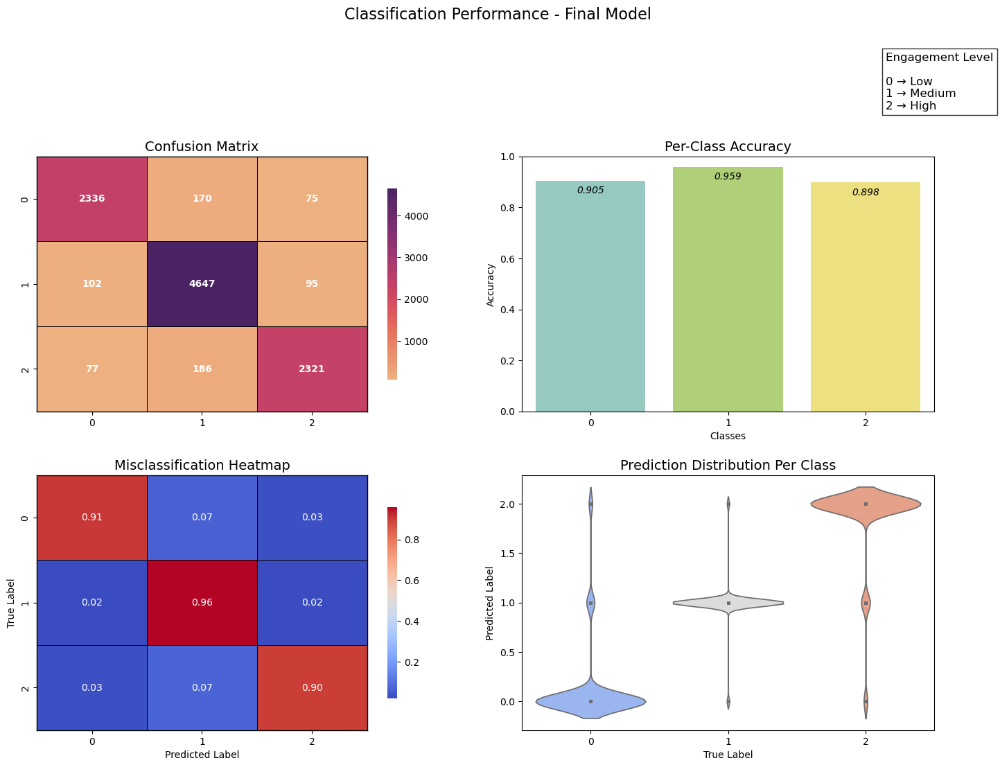

In [17]:
# Model Performance - Final
visualize_model_performance(y_test, y_pred_final, "Final Model")

In [18]:
print("Unique predicted classes", np.unique(y_pred_final))

Unique predicted classes [0. 1. 2.]


In [19]:
# Compute SHAP Values
import shap

shap_values_path = 'data/shap_values.pkl'
dtest = xgb.DMatrix(X_test)

explainer = shap.TreeExplainer(final_model)

if os.path.exists(shap_values_path):
    print("Loading previously saved SHAP values...")
    with open(shap_values_path, 'rb') as file:
        shap_values = pickle.load(file)
else:
    print("Calculating new SHAP values...")
    # Generate SHAP values for the test set
    shap_values = explainer(dtest)

    # Save SHAP values
    with open(shap_values_path, 'wb') as file:
        pickle.dump(shap_values, file)
    print(f"\nSHAP values stored at {shap_values_path}")

Calculating new SHAP values...

SHAP values stored at data/shap_values.pkl


In [20]:
# Inspect SHAP values

print(f"SHAP values type: {type(shap_values)}")
print(f"SHAP values shape: {shap_values.values.shape}")

SHAP values type: <class 'shap._explanation.Explanation'>
SHAP values shape: (10009, 17, 3)


In [21]:
# We have SHAP values all classes
# Let's split for each class
indices_high = np.where(y_test == 2)[0]
indices_medium = np.where(y_test == 1)[0]
indices_low = np.where(y_test == 0)[0]

shap_values_high = shap_values.values[indices_high, :, 2]
shap_values_medium = shap_values.values[indices_medium, :, 1]
shap_values_low = shap_values.values[indices_low, :, 0]

print(shap_values_high.shape)
print(shap_values_medium.shape)
print(shap_values_low.shape)

(2584, 17)
(4844, 17)
(2581, 17)


In [25]:
short_column_names = {
    "Age": "Age",
    "Gender": "Gen",
    "InGamePurchases": "IGP",
    "GameDifficulty": "GDif",
    "SessionsPerWeek": "SesWk",
    "AvgSessionDurationMinutes": "ASMin",
    "PlayerLevel": "PyLvl",
    "AchievementsUnlocked": "AsUnl",
    "AvgPlayTimePerWeek": "APWk",
    "isAddicted": "Adctd",
    "Location_Europe": "LoEU",
    "Location_Other": "LoOTH",
    "Location_USA": "LoUSA",
    "Genre_RPG": "RPG",
    "Genre_Simulation": "Sim",
    "Genre_Sports": "Sport",
    "Genre_Strategy": "Strat"
}

# Function to generate legend using abbreviations for SHAP plots
def show_custom_legend(short_column_names, class_label):
    fig, ax = plt.subplots(figsize=(12, 1))
    ax.axis("off")
    fig.suptitle(f'SHAP Force Plots for {"High" if class_label==2 else "Low"} Predictions', fontsize=16, x=0.525, y=4)

    legend_text = [f"{short_name} – {full_name}" for full_name, short_name in short_column_names.items()]
    
    ax.text(0.99, 0.5, "\n".join(legend_text), ha="right", fontsize=10, fontweight="bold")
    plt.subplots_adjust(right=1.0)
    plt.show()

# Function to create SHAP force plots
def create_force_plot(explainer, shap_values, x_test, idx, class_label, feature_names):
    shap_values_array = np.round(np.array(shap_values[idx]), 2)
    feature_values = np.round(x_test[idx], 2)

    shap.force_plot(
        explainer.expected_value[class_label], 
        shap_values_array,  
        feature_values,
        feature_names=[short_column_names.get(col, col) for col in feature_names],
        matplotlib=True,
        show=False
    )
    
    plt.grid(False)
    plt.gca().set_axisbelow(True)
    plt.show()

# Function to generate SHAP force plots for correctly classified samples
def generate_force_plots(explainer, shap_values, x_test, y_test, short_column_names, feature_names, num_samples=3, class_label=2):
    show_custom_legend(short_column_names, class_label)

    for idx in range(num_samples):
        create_force_plot(explainer, shap_values, x_test, idx, class_label, feature_names)

def generate_summary_plot(shap_values, x_test, class_label):
    plt.title(f'Feature Importance for {"High" if class_label==2 else "Low"} Predictions', fontsize=14)
    if isinstance(x_test, np.ndarray):
        x_test = pd.DataFrame(x_test, columns=short_column_names.keys())
    
    shap.summary_plot(shap_values, x_test, plot_type="bar", show=True, max_display=10)

def generate_dependence_plots(shap_values, x_test, y_test, y_pred, feature_names, class_label):
    x_test = scaler.inverse_transform(x_test)
    
    if isinstance(x_test, np.ndarray):
        x_test = pd.DataFrame(x_test, columns=feature_names)
    
    correct_indices = np.where(y_test == class_label)[0]
    x_test_filtered = x_test.iloc[correct_indices]
    
    # Compute the mean absolute SHAP values to determine feature importance
    mean_abs_shap = np.abs(shap_values).mean(axis=0)
    top_features = x_test_filtered.columns[np.argsort(mean_abs_shap)[::-1]]  

    most_important_feature = top_features[0]  
    other_top_features = top_features[1:9]    

    fig, axs = plt.subplots(nrows=5, ncols=2, figsize=(16, 24))
    plt.subplots_adjust(hspace=0.8, wspace=0.7)  

    fig.suptitle(f'SHAP Dependence Plots for {"High" if class_label==2 else "Low"} Predictions - {most_important_feature} vs Other Features', fontsize=18)

    for idx, feature in enumerate(other_top_features):
        row_idx = idx // 2
        col_idx = idx % 2
    
        shap.dependence_plot(feature, shap_values, x_test_filtered, interaction_index=most_important_feature, ax=axs[row_idx, col_idx], show=False)
    
    fig.delaxes(axs[4, 0])
    fig.delaxes(axs[4, 1])
    plt.tight_layout(rect=[0, 0, 1, 1], pad=3.0)
    plt.show()

feature_names = df.drop(columns=["EngagementLevel", "PlayerID"]).columns.to_list()

## Analyze Features Driving “High” predictions for EngagementLevel

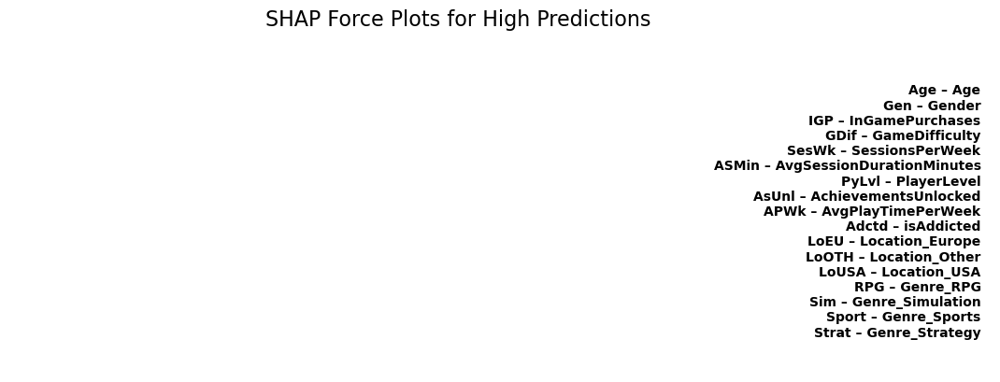

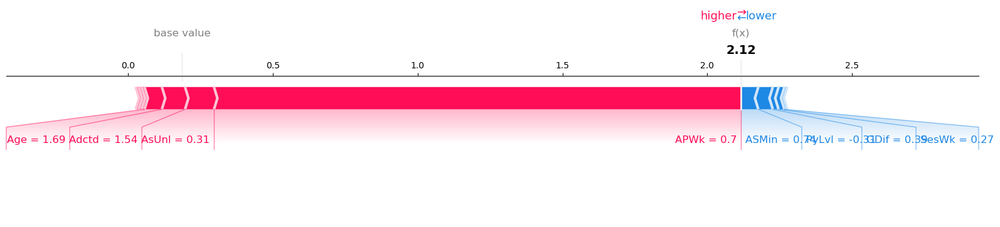

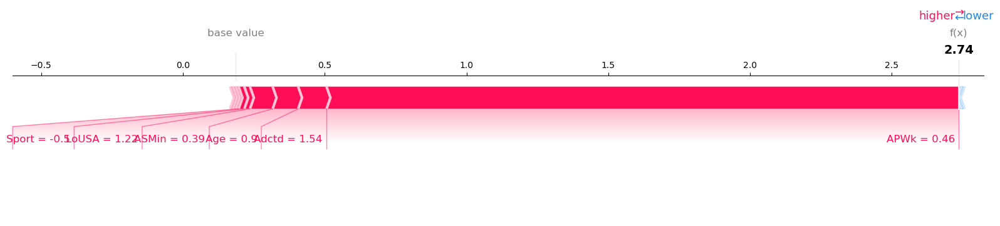

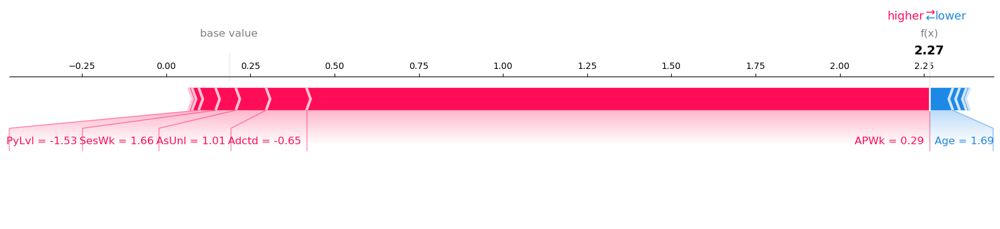

In [27]:
generate_force_plots(explainer, shap_values_high, X_test, y_test, short_column_names, feature_names, num_samples=3, class_label=2)

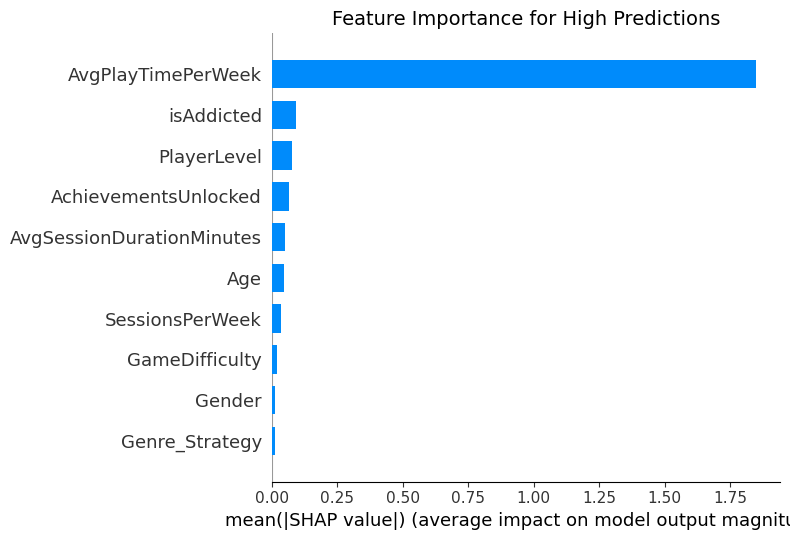

In [28]:
generate_summary_plot(shap_values_high, X_test, class_label=2)

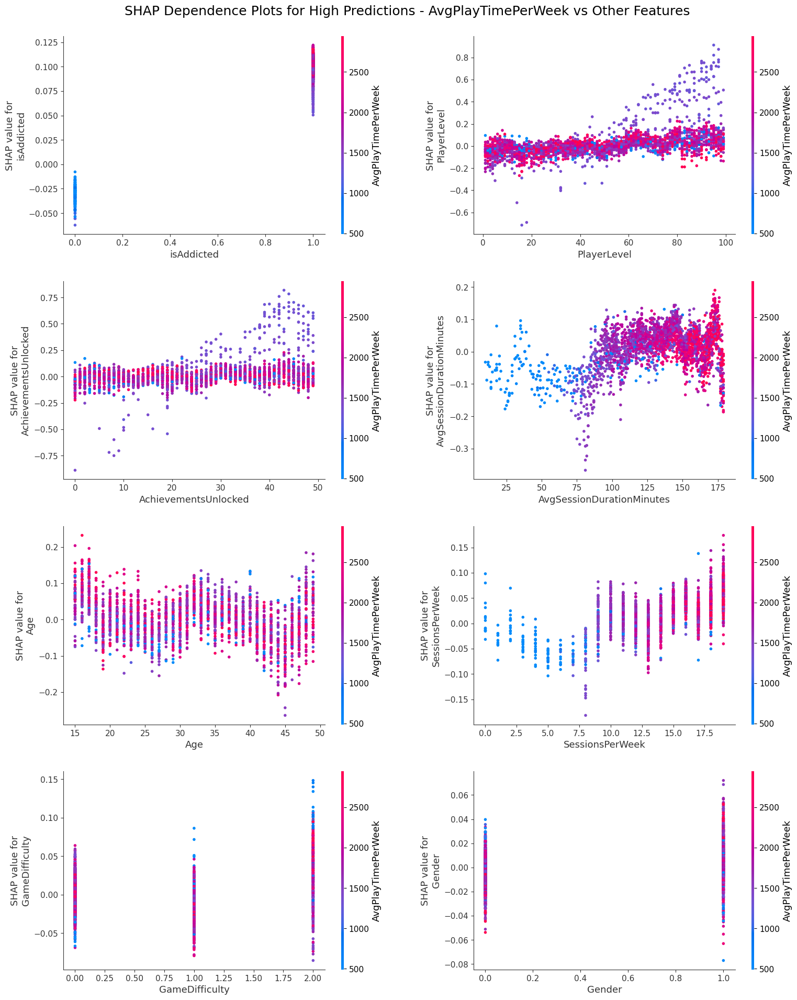

In [29]:
generate_dependence_plots(shap_values_high, X_test, y_test, y_pred_final, feature_names, class_label=2)

## Analyze Features Driving “Low” predictions for EngagementLevel

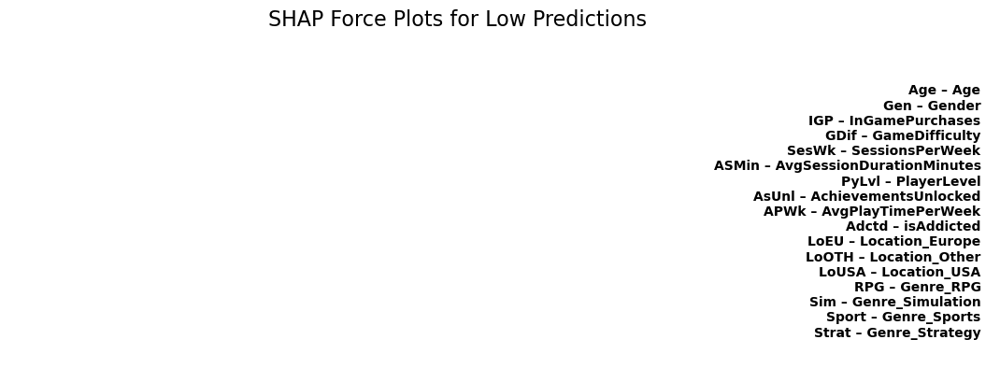

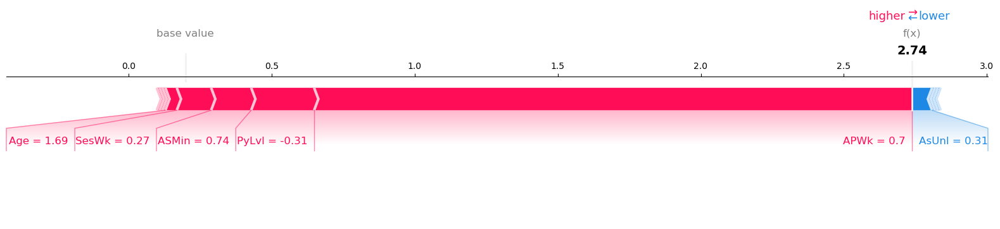

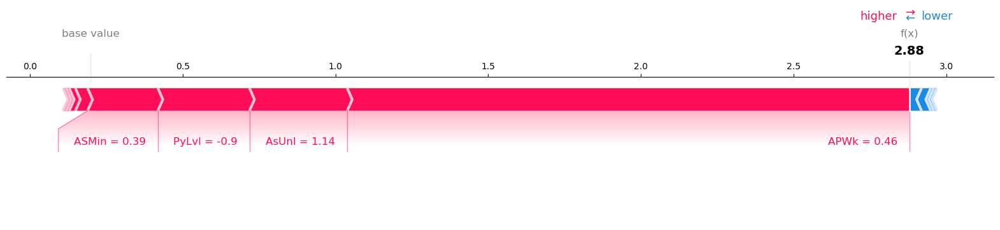

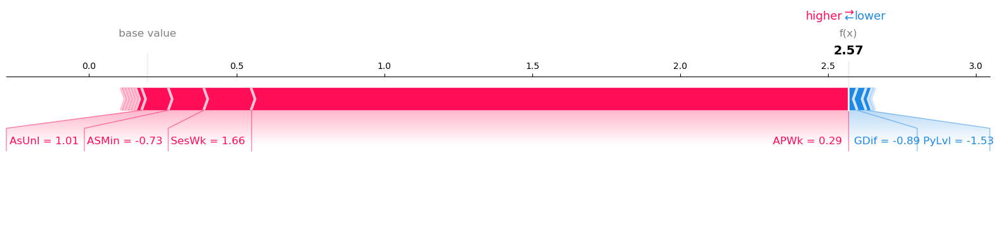

In [30]:
generate_force_plots(explainer, shap_values_low, X_test, y_test, short_column_names, feature_names, num_samples=3, class_label=0)

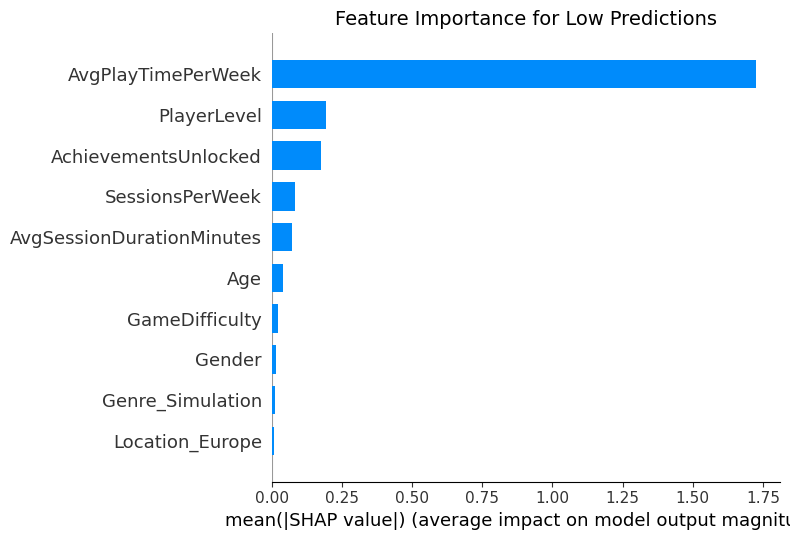

In [31]:
generate_summary_plot(shap_values_low, X_test, 0)

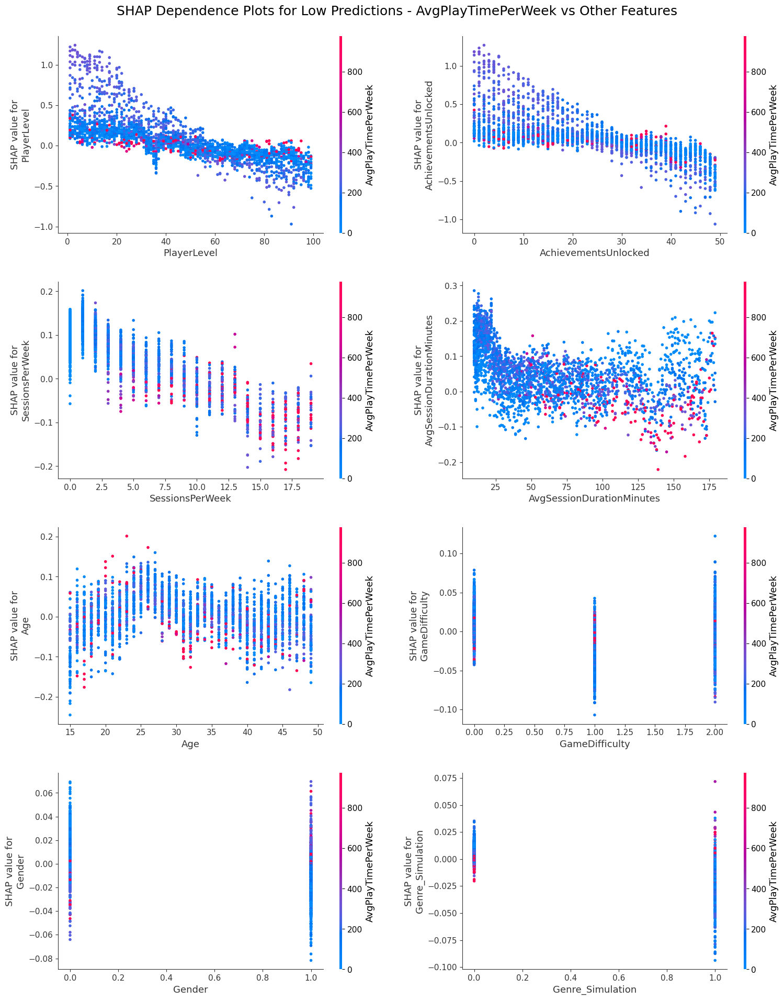

In [32]:
generate_dependence_plots(shap_values_low, X_test, y_test, y_pred_final, feature_names, class_label=0)

## Compare Features Across "High" and "Low" Predictions

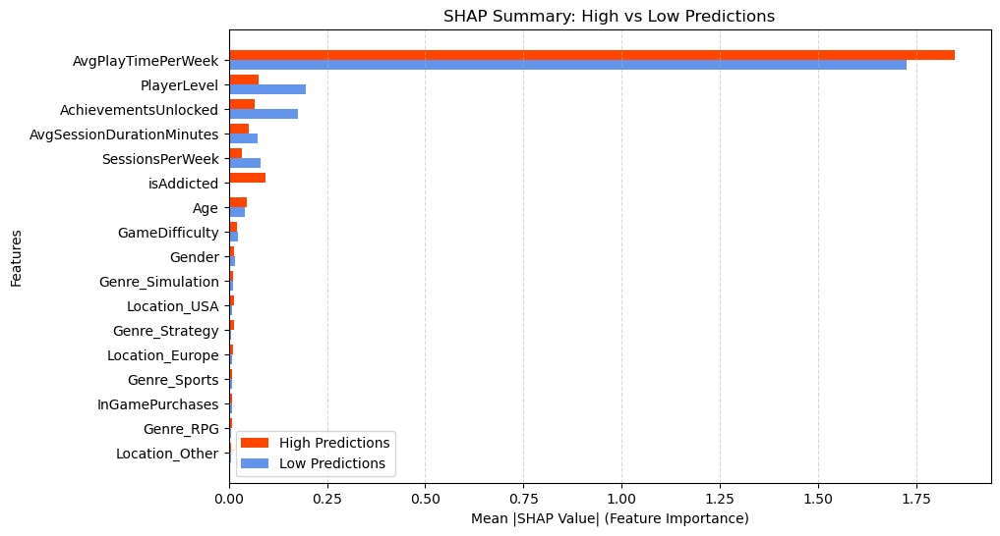

In [33]:
plt.figure(figsize=(10, 6))

mean_abs_shap_high = np.abs(shap_values_high).mean(axis=0)
mean_abs_shap_low = np.abs(shap_values_low).mean(axis=0)

combined_shap = mean_abs_shap_high + mean_abs_shap_low
sorted_indices = np.argsort(combined_shap)[::-1]

sorted_features = [feature_names[i] for i in sorted_indices]
sorted_shap_high = mean_abs_shap_high[sorted_indices]
sorted_shap_low = mean_abs_shap_low[sorted_indices]

bar_width = 0.4
x_pos = np.arange(len(sorted_features))

plt.barh(x_pos - bar_width/2, sorted_shap_high, height=bar_width, color="orangered", label="High Predictions")
plt.barh(x_pos + bar_width/2, sorted_shap_low, height=bar_width, color="cornflowerblue", label="Low Predictions")

plt.xlabel("Mean |SHAP Value| (Feature Importance)")
plt.ylabel("Features")
plt.title("SHAP Summary: High vs Low Predictions")
plt.yticks(x_pos, sorted_features)
plt.legend()
plt.gca().invert_yaxis()
plt.grid(axis="x", linestyle="--", alpha=0.5)
plt.show()

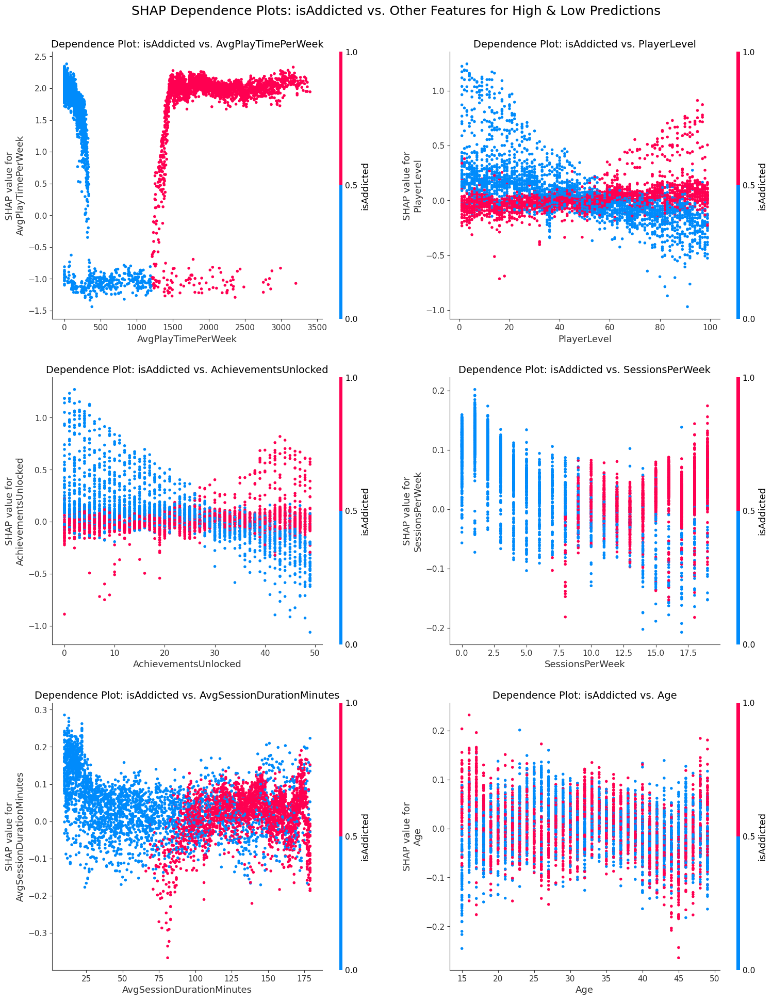

In [34]:
def visualize_isAddicted_interactions(shap_values_high, shap_values_low, x_test, y_test, feature_names):
    x_test = scaler.inverse_transform(x_test)
    
    important_features = [
        "AvgPlayTimePerWeek",
        "PlayerLevel",
        "AchievementsUnlocked",
        "SessionsPerWeek",
        "AvgSessionDurationMinutes",
        "Age"  
    ]

    fig, axs = plt.subplots(nrows=3, ncols=2, figsize=(16, 20))
    plt.subplots_adjust(hspace=0.6, wspace=0.5)

    fig.suptitle("SHAP Dependence Plots: isAddicted vs. Other Features for High & Low Predictions", fontsize=18)

    indices_high = np.where((y_test == 2))[0]
    indices_low = np.where((y_test == 0))[0]

    x_test = pd.DataFrame(x_test, columns=feature_names)
    x_test_high = x_test.iloc[indices_high]
    x_test_low = x_test.iloc[indices_low]

    combined_shap_values = np.vstack((shap_values_high, shap_values_low))
    combined_x_test = pd.concat([x_test_high, x_test_low])

    for idx, feature in enumerate(important_features):
        row_idx = idx // 2
        col_idx = idx % 2

        shap.dependence_plot(
            feature, combined_shap_values, combined_x_test,
            interaction_index="isAddicted",
            ax=axs[row_idx, col_idx],
            show=False
        )

        axs[row_idx, col_idx].set_title(f"Dependence Plot: isAddicted vs. {feature}", fontsize=14)

    plt.tight_layout(rect=[0, 0, 1, 1], pad=3.0)
    plt.show()

visualize_isAddicted_interactions(shap_values_high, shap_values_low, X_test, y_test, feature_names)